<a href="https://colab.research.google.com/github/Jeevesh28/BrainDead2k23-Duo-Lipa/blob/main/Problem-2%3A%20Generate%20Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **1. Import the Required Libraries**

In [ ]:
import numpy as np
import random
from scipy import misc
from pathlib import Path
from PIL import Image, ImageOps
import glob
import matplotlib.pyplot as plt
import scipy.misc
from matplotlib.pyplot import imshow
%matplotlib inline

import cv2
import seaborn as sn
import pandas as pd
import pickle
import warnings
warnings.filterwarnings("ignore")

import tensorflow as tf
from keras import layers
from keras.layers import Flatten, Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D, Dropout
from keras.layers import Reshape, UpSampling2D, Conv2DTranspose, LeakyReLU
from keras.models import Sequential, Model, load_model
from keras.preprocessing import image
from keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from keras.applications.imagenet_utils import decode_predictions
from keras.applications import densenet
from keras.utils import layer_utils, np_utils, plot_model
from keras.utils.data_utils import get_file
from keras.applications.imagenet_utils import preprocess_input
from keras.utils.vis_utils import model_to_dot
from keras.initializers import glorot_uniform

from keras import losses
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, Callback
from keras.optimizers import Adam, RMSprop
from keras import regularizers
from keras import backend as K
from sklearn.metrics import confusion_matrix, classification_report

Using TensorFlow backend.


### **2. Load the Image Training**

In [ ]:
path_base = '/kaggle/input/brain-dead-emotion-detection/brain_dead_emotion_detection/Train/happy/'
allfiles = [f for f in glob.glob(path_base + "*.png", recursive=True)]
random.shuffle(allfiles)

files = []
for i in range(0, len(allfiles)):
    my_file = Path(allfiles[i])
    if my_file.is_file():
        im = Image.open(my_file)
        image = np.array(im)
        if image.ndim == 3:
            files.append(allfiles[i])
        else:
            print(allfiles[i])

train_df = np.array(files)
train_df.shape

(595,)

In [ ]:
latent_dim = 100
height = 32
width = 32
channels = 3
batch_size = 16

### **3. Build the Generator**

In [ ]:
def build_generator():
    generator_input = layers.Input(shape=(latent_dim,))

    x = layers.Dense(16 * 16 * 16)(generator_input)
    x = layers.LeakyReLU()(x)
    x = layers.Reshape((16, 16, 16))(x)

    x = layers.Conv2D(16, 5, padding='same')(x)
    x = layers.LeakyReLU()(x)

    x = layers.Conv2DTranspose(16, 4, strides=2, padding='same')(x)
    x = layers.LeakyReLU()(x)

    x = layers.Conv2D(16, 5, padding='same')(x)
    x = layers.LeakyReLU()(x)

    x = layers.Conv2D(channels, 7, padding='same')(x)
    x = layers.LeakyReLU()(x)
    generator = Model(generator_input, x)
    generator.summary()

    return generator

### **4. Build the Discriminator**

In [ ]:
def build_discriminator():
    discriminator_input = layers.Input(shape=(height, width, channels))
    x = layers.Conv2D(16, 3)(discriminator_input)
    x = layers.LeakyReLU()(x)
    x = layers.Flatten()(x)

    x = layers.Dropout(0.1)(x)
    x = layers.Dense(10)(x)

    x = layers.Dense(1)(x)

    discriminator = Model(discriminator_input, x)
    discriminator.summary()

    return discriminator

### **5. Assemble the GAN (Generative adversarial network)**

In [ ]:
def build_gan(discriminator, generator):
    # Set discriminator weights to non-trainable
    discriminator.trainable = False

    gan_input = layers.Input(shape=(latent_dim,))
    gan_output = discriminator(generator(gan_input))
    gan = Model(gan_input, gan_output)

    return gan

**i. Compile the Discriminator**

In [ ]:
discriminator = build_discriminator()
discriminator_optimizer = RMSprop(lr=0.0005, clipvalue=1.0, decay=1e-8)
discriminator.compile(optimizer=discriminator_optimizer, loss='mse')

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 30, 30, 16)        448       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 30, 30, 16)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 14400)             0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 14400)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 10)                144010    
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 11        
Total para

In [ ]:
generator = build_generator()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 100)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 4096)              413696    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 4096)              0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 16, 16, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 16, 16)        6416      
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 16, 16, 16)        0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 32, 32, 16)        4112      
__________

**ii. Compile the GAN Model**

In [ ]:
gan = build_gan(discriminator, generator)
gan_optimizer = RMSprop(lr=0.0001, clipvalue=1.0, decay=1e-8)
gan.compile(optimizer=gan_optimizer, loss='mse')

### **6. Helper functions to show Images**

In [ ]:
def generate_real(data, index, size):
    im = Image.open(data[index])
    im = ImageOps.fit(im, size, Image.ANTIALIAS)
    npimage = np.array(im)
    npimage = npimage / 255

    return npimage

In [ ]:
def plot_images(save2file=False, fake=True, samples=16, images=None, dpi = 80):
    mul = samples

    plt.figure(figsize=(mul*width/dpi,mul*height/dpi))
    for i in range(samples):
        plt.subplot(4, 4, i+1)
        image = images[i, :, :, :]
        image = np.reshape(image, [width, height, channels])
        plt.imshow((image * 255).astype(np.uint8))
        plt.axis('off')
    plt.tight_layout()
    if save2file:
        plt.savefig(filename)
        plt.close('all')
    else:
        plt.show()

In [ ]:
def plot_image(image, save2file=False, dpi=80):
    plt.figure(figsize=(width/dpi,height/dpi))
    image = np.reshape(image, [width, height, channels])
    plt.imshow((image * 255).astype(np.uint8))
    plt.axis('off')
    plt.tight_layout()
    if save2file:
        plt.savefig(filename)
        plt.close('all')
    else:
        plt.show()

**i. Actual image**

float64


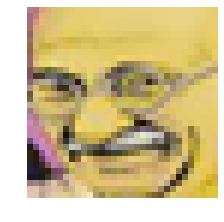

In [ ]:
im = generate_real(train_df, 10, (width, height))
print(im.dtype)
plot_image(im, False, dpi=10);

**ii. Initialise generated image**

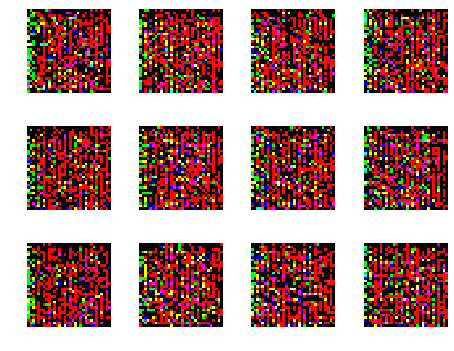

In [ ]:
generated_images = generator.predict(np.random.normal(size=(batch_size, latent_dim)))
plot_images(save2file=False, fake=True, samples=12, images=generated_images, dpi=60)

### **7. Model training and Image generation**

discriminator loss at step 0:	 1.5898900032043457 	-- adversarial loss at step 0:	 0.5193825


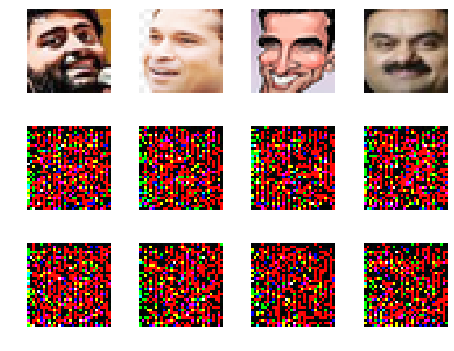

discriminator loss at step 100:	 0.14078126847743988 	-- adversarial loss at step 100:	 4.3032837
discriminator loss at step 200:	 0.9787180423736572 	-- adversarial loss at step 200:	 4.9776216
discriminator loss at step 300:	 0.532848596572876 	-- adversarial loss at step 300:	 5.2335777
discriminator loss at step 400:	 0.433230459690094 	-- adversarial loss at step 400:	 7.4939966
discriminator loss at step 500:	 0.8060195446014404 	-- adversarial loss at step 500:	 5.374899


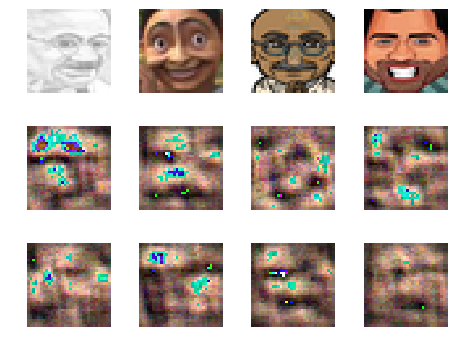

discriminator loss at step 600:	 1.0933771133422852 	-- adversarial loss at step 600:	 4.001205
discriminator loss at step 700:	 0.9514610767364502 	-- adversarial loss at step 700:	 3.1801906
discriminator loss at step 800:	 1.1628819704055786 	-- adversarial loss at step 800:	 1.6239004
discriminator loss at step 900:	 0.6847816109657288 	-- adversarial loss at step 900:	 1.5501581
discriminator loss at step 1000:	 0.7794656753540039 	-- adversarial loss at step 1000:	 1.5412024


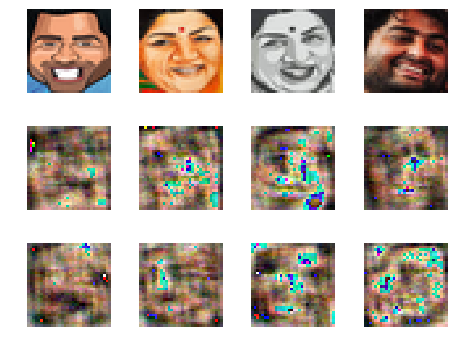

discriminator loss at step 1100:	 0.7283506393432617 	-- adversarial loss at step 1100:	 1.5538542
discriminator loss at step 1200:	 0.9547388553619385 	-- adversarial loss at step 1200:	 1.5790043
discriminator loss at step 1300:	 1.0279033184051514 	-- adversarial loss at step 1300:	 1.4458516
discriminator loss at step 1400:	 0.9419018626213074 	-- adversarial loss at step 1400:	 1.6823027
discriminator loss at step 1500:	 1.0573318004608154 	-- adversarial loss at step 1500:	 1.2754954


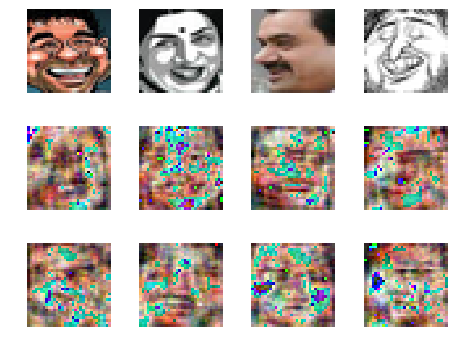

discriminator loss at step 1600:	 1.0041863918304443 	-- adversarial loss at step 1600:	 1.3366816
discriminator loss at step 1700:	 1.080737829208374 	-- adversarial loss at step 1700:	 1.2619874
discriminator loss at step 1800:	 1.1002386808395386 	-- adversarial loss at step 1800:	 1.4053401
discriminator loss at step 1900:	 1.0340391397476196 	-- adversarial loss at step 1900:	 1.2934608
discriminator loss at step 2000:	 0.9303642511367798 	-- adversarial loss at step 2000:	 1.397154


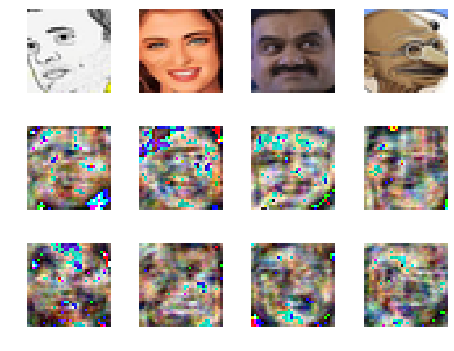

discriminator loss at step 2100:	 1.0692312717437744 	-- adversarial loss at step 2100:	 1.1638057
discriminator loss at step 2200:	 1.1418324708938599 	-- adversarial loss at step 2200:	 1.1654153
discriminator loss at step 2300:	 1.0399998426437378 	-- adversarial loss at step 2300:	 0.9171436
discriminator loss at step 2400:	 1.2004547119140625 	-- adversarial loss at step 2400:	 1.1253728
discriminator loss at step 2500:	 1.0350408554077148 	-- adversarial loss at step 2500:	 1.0311849


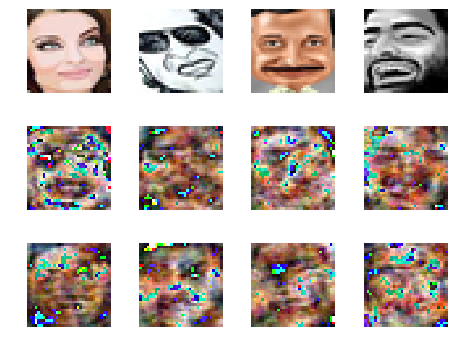

discriminator loss at step 2600:	 1.0337013006210327 	-- adversarial loss at step 2600:	 1.0142612
discriminator loss at step 2700:	 1.071265459060669 	-- adversarial loss at step 2700:	 1.1081753
discriminator loss at step 2800:	 1.0729705095291138 	-- adversarial loss at step 2800:	 1.0374417
discriminator loss at step 2900:	 1.099142074584961 	-- adversarial loss at step 2900:	 1.0705625
discriminator loss at step 3000:	 1.0752156972885132 	-- adversarial loss at step 3000:	 1.0725715


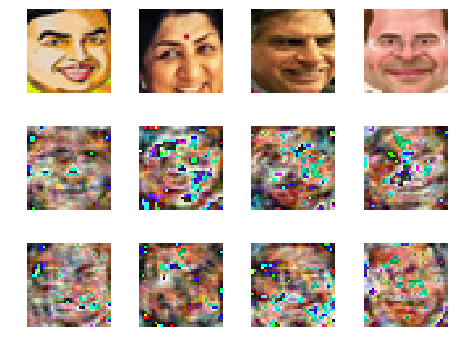

discriminator loss at step 3100:	 1.054429292678833 	-- adversarial loss at step 3100:	 1.058816
discriminator loss at step 3200:	 1.0714027881622314 	-- adversarial loss at step 3200:	 1.0878228
discriminator loss at step 3300:	 1.0767829418182373 	-- adversarial loss at step 3300:	 1.0897775
discriminator loss at step 3400:	 1.0796892642974854 	-- adversarial loss at step 3400:	 1.0293374
discriminator loss at step 3500:	 1.0620744228363037 	-- adversarial loss at step 3500:	 1.0784014


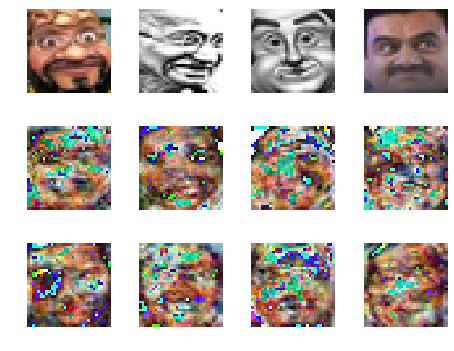

discriminator loss at step 3600:	 1.0468450784683228 	-- adversarial loss at step 3600:	 1.0710814
discriminator loss at step 3700:	 1.0593807697296143 	-- adversarial loss at step 3700:	 1.0627384
discriminator loss at step 3800:	 1.0624489784240723 	-- adversarial loss at step 3800:	 1.091464
discriminator loss at step 3900:	 1.0611016750335693 	-- adversarial loss at step 3900:	 1.07559
discriminator loss at step 4000:	 1.0661308765411377 	-- adversarial loss at step 4000:	 1.086582


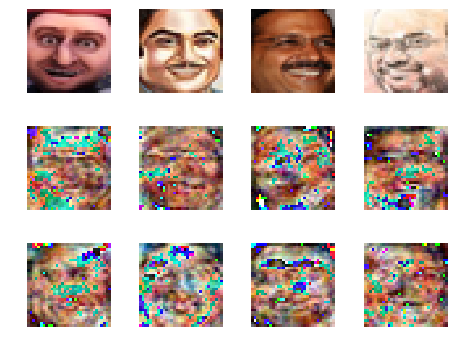

discriminator loss at step 4100:	 1.058141827583313 	-- adversarial loss at step 4100:	 1.0787755
discriminator loss at step 4200:	 1.0574177503585815 	-- adversarial loss at step 4200:	 1.103077
discriminator loss at step 4300:	 1.0663273334503174 	-- adversarial loss at step 4300:	 1.0507698
discriminator loss at step 4400:	 1.0466547012329102 	-- adversarial loss at step 4400:	 1.0954077
discriminator loss at step 4500:	 1.0608930587768555 	-- adversarial loss at step 4500:	 1.0387107


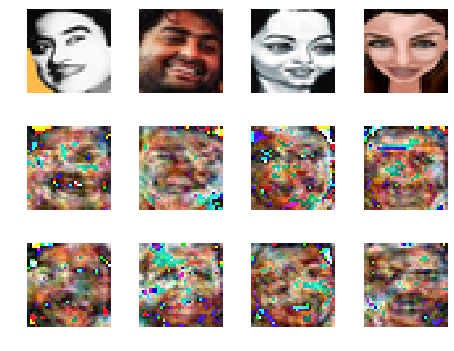

discriminator loss at step 4600:	 1.1108664274215698 	-- adversarial loss at step 4600:	 1.0072597
discriminator loss at step 4700:	 1.0355170965194702 	-- adversarial loss at step 4700:	 1.0882137
discriminator loss at step 4800:	 1.0515611171722412 	-- adversarial loss at step 4800:	 1.0829501
discriminator loss at step 4900:	 1.0909847021102905 	-- adversarial loss at step 4900:	 0.98958504
discriminator loss at step 5000:	 1.0155560970306396 	-- adversarial loss at step 5000:	 1.110055


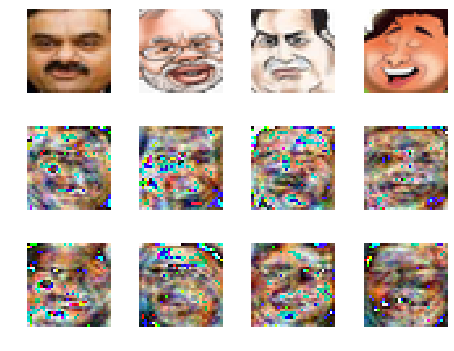

discriminator loss at step 5100:	 1.0921294689178467 	-- adversarial loss at step 5100:	 1.0274858
discriminator loss at step 5200:	 1.0472185611724854 	-- adversarial loss at step 5200:	 1.1220238
discriminator loss at step 5300:	 1.055022954940796 	-- adversarial loss at step 5300:	 1.0751864
discriminator loss at step 5400:	 1.0516564846038818 	-- adversarial loss at step 5400:	 1.0347769
discriminator loss at step 5500:	 0.9909038543701172 	-- adversarial loss at step 5500:	 1.0595446


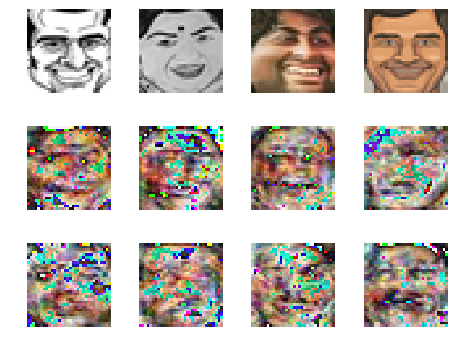

discriminator loss at step 5600:	 1.0458858013153076 	-- adversarial loss at step 5600:	 1.1107908
discriminator loss at step 5700:	 1.058408498764038 	-- adversarial loss at step 5700:	 1.0778989
discriminator loss at step 5800:	 1.037977933883667 	-- adversarial loss at step 5800:	 1.1315416
discriminator loss at step 5900:	 1.0399521589279175 	-- adversarial loss at step 5900:	 1.0838454
discriminator loss at step 6000:	 1.05153226852417 	-- adversarial loss at step 6000:	 1.0744674


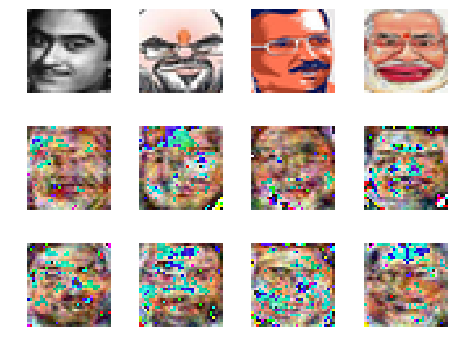

discriminator loss at step 6100:	 1.0329244136810303 	-- adversarial loss at step 6100:	 1.0334439
discriminator loss at step 6200:	 1.0378637313842773 	-- adversarial loss at step 6200:	 1.139026
discriminator loss at step 6300:	 1.0837650299072266 	-- adversarial loss at step 6300:	 1.0680403
discriminator loss at step 6400:	 1.055941104888916 	-- adversarial loss at step 6400:	 1.0527263
discriminator loss at step 6500:	 1.070451021194458 	-- adversarial loss at step 6500:	 1.0668578


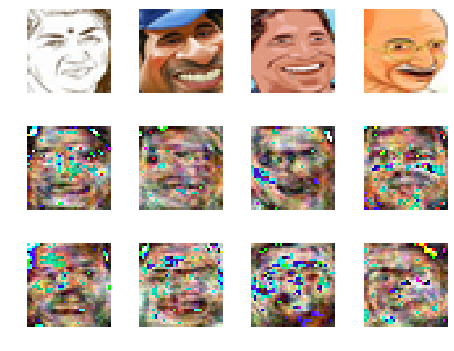

discriminator loss at step 6600:	 1.0198955535888672 	-- adversarial loss at step 6600:	 1.1257693
discriminator loss at step 6700:	 1.0533808469772339 	-- adversarial loss at step 6700:	 1.0141803
discriminator loss at step 6800:	 1.0473499298095703 	-- adversarial loss at step 6800:	 1.1137648
discriminator loss at step 6900:	 1.071315050125122 	-- adversarial loss at step 6900:	 1.0807227
discriminator loss at step 7000:	 1.067840576171875 	-- adversarial loss at step 7000:	 1.0265857


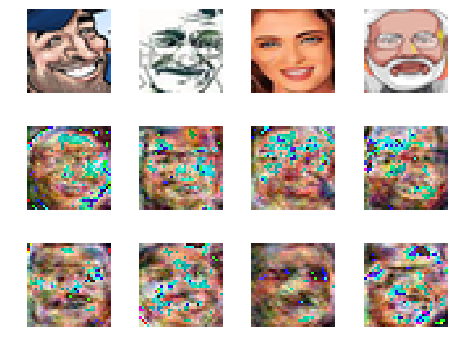

discriminator loss at step 7100:	 1.0426356792449951 	-- adversarial loss at step 7100:	 1.0741618
discriminator loss at step 7200:	 1.074954867362976 	-- adversarial loss at step 7200:	 1.1047845
discriminator loss at step 7300:	 1.0751672983169556 	-- adversarial loss at step 7300:	 1.097348
discriminator loss at step 7400:	 1.0362375974655151 	-- adversarial loss at step 7400:	 1.025027
discriminator loss at step 7500:	 1.1037695407867432 	-- adversarial loss at step 7500:	 1.0361199


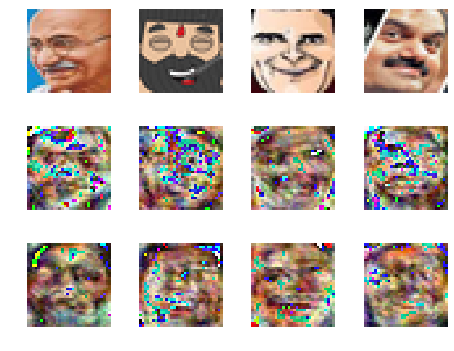

discriminator loss at step 7600:	 1.0518062114715576 	-- adversarial loss at step 7600:	 1.0783329
discriminator loss at step 7700:	 1.1240671873092651 	-- adversarial loss at step 7700:	 0.9625211
discriminator loss at step 7800:	 1.0732882022857666 	-- adversarial loss at step 7800:	 1.0862865
discriminator loss at step 7900:	 1.0575222969055176 	-- adversarial loss at step 7900:	 1.100043
discriminator loss at step 8000:	 1.064013957977295 	-- adversarial loss at step 8000:	 1.0201434


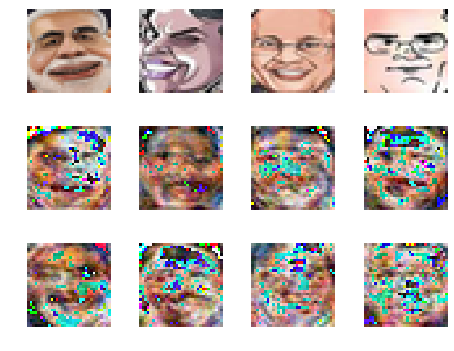

discriminator loss at step 8100:	 1.069490909576416 	-- adversarial loss at step 8100:	 1.0433455
discriminator loss at step 8200:	 1.0820817947387695 	-- adversarial loss at step 8200:	 0.9871023
discriminator loss at step 8300:	 1.0442167520523071 	-- adversarial loss at step 8300:	 1.1195604
discriminator loss at step 8400:	 1.1963521242141724 	-- adversarial loss at step 8400:	 0.83649445
discriminator loss at step 8500:	 1.0795495510101318 	-- adversarial loss at step 8500:	 1.0690345


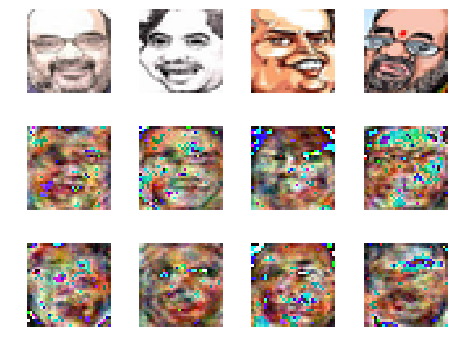

discriminator loss at step 8600:	 1.0653324127197266 	-- adversarial loss at step 8600:	 1.0158876
discriminator loss at step 8700:	 1.1515552997589111 	-- adversarial loss at step 8700:	 0.9757854
discriminator loss at step 8800:	 1.1192965507507324 	-- adversarial loss at step 8800:	 0.9899584
discriminator loss at step 8900:	 1.0357099771499634 	-- adversarial loss at step 8900:	 1.0610292
discriminator loss at step 9000:	 1.0367265939712524 	-- adversarial loss at step 9000:	 1.0851703


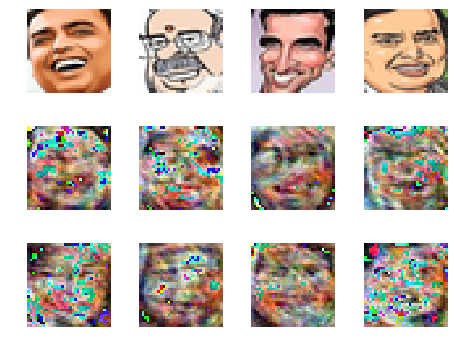

discriminator loss at step 9100:	 1.0214955806732178 	-- adversarial loss at step 9100:	 1.0507394
discriminator loss at step 9200:	 1.0257432460784912 	-- adversarial loss at step 9200:	 1.0654985
discriminator loss at step 9300:	 1.014736533164978 	-- adversarial loss at step 9300:	 1.0812801
discriminator loss at step 9400:	 1.0785412788391113 	-- adversarial loss at step 9400:	 1.0092571
discriminator loss at step 9500:	 1.0935931205749512 	-- adversarial loss at step 9500:	 0.999863


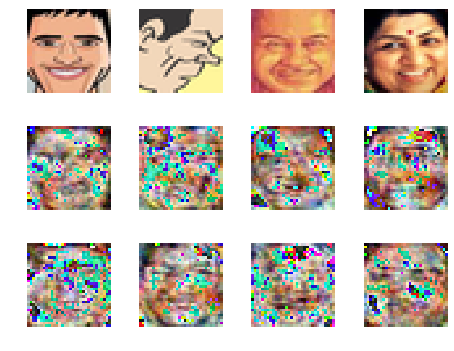

discriminator loss at step 9600:	 1.0815852880477905 	-- adversarial loss at step 9600:	 1.032134
discriminator loss at step 9700:	 1.077905297279358 	-- adversarial loss at step 9700:	 1.00866
discriminator loss at step 9800:	 1.0898988246917725 	-- adversarial loss at step 9800:	 1.06657
discriminator loss at step 9900:	 1.0712298154830933 	-- adversarial loss at step 9900:	 1.0784371
discriminator loss at step 10000:	 1.0906850099563599 	-- adversarial loss at step 10000:	 1.065898


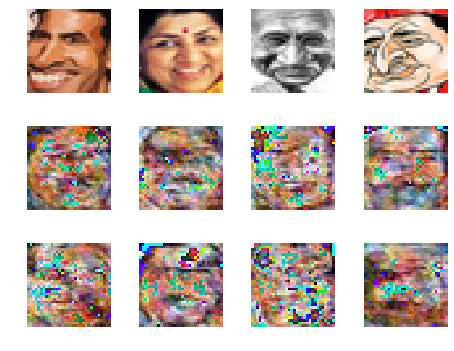

discriminator loss at step 10100:	 1.1742088794708252 	-- adversarial loss at step 10100:	 0.97404516
discriminator loss at step 10200:	 1.042401909828186 	-- adversarial loss at step 10200:	 1.0935895
discriminator loss at step 10300:	 1.0720360279083252 	-- adversarial loss at step 10300:	 0.98277295
discriminator loss at step 10400:	 1.0454753637313843 	-- adversarial loss at step 10400:	 0.9855398
discriminator loss at step 10500:	 1.1147239208221436 	-- adversarial loss at step 10500:	 0.9715441


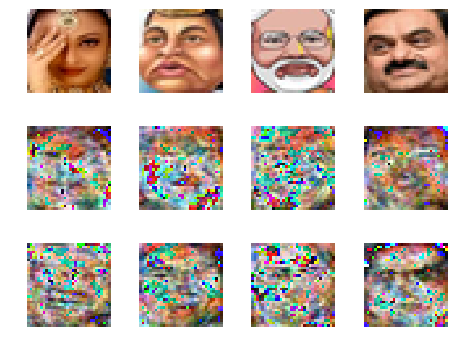

discriminator loss at step 10600:	 1.0892319679260254 	-- adversarial loss at step 10600:	 1.0353808
discriminator loss at step 10700:	 1.0882952213287354 	-- adversarial loss at step 10700:	 0.95695955
discriminator loss at step 10800:	 1.0853471755981445 	-- adversarial loss at step 10800:	 1.0745132
discriminator loss at step 10900:	 1.0945411920547485 	-- adversarial loss at step 10900:	 1.0730393
discriminator loss at step 11000:	 1.0738298892974854 	-- adversarial loss at step 11000:	 1.086936


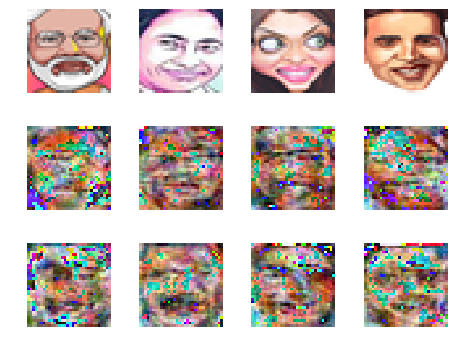

discriminator loss at step 11100:	 1.0634983777999878 	-- adversarial loss at step 11100:	 1.0294812
discriminator loss at step 11200:	 1.0697842836380005 	-- adversarial loss at step 11200:	 1.1042287
discriminator loss at step 11300:	 1.0856826305389404 	-- adversarial loss at step 11300:	 1.0442595
discriminator loss at step 11400:	 1.0380353927612305 	-- adversarial loss at step 11400:	 1.0440726
discriminator loss at step 11500:	 1.0679419040679932 	-- adversarial loss at step 11500:	 1.030884


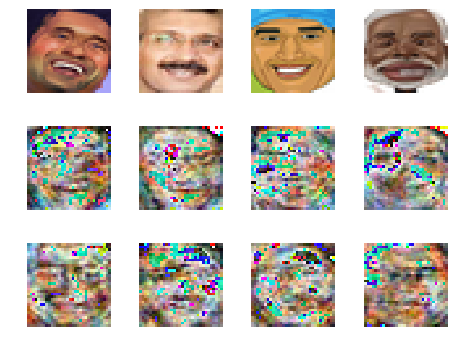

discriminator loss at step 11600:	 1.0839157104492188 	-- adversarial loss at step 11600:	 1.1005759
discriminator loss at step 11700:	 1.0631873607635498 	-- adversarial loss at step 11700:	 1.0398068
discriminator loss at step 11800:	 1.0694949626922607 	-- adversarial loss at step 11800:	 1.0046072
discriminator loss at step 11900:	 1.0722482204437256 	-- adversarial loss at step 11900:	 1.0647669
discriminator loss at step 12000:	 1.0539720058441162 	-- adversarial loss at step 12000:	 1.0566223


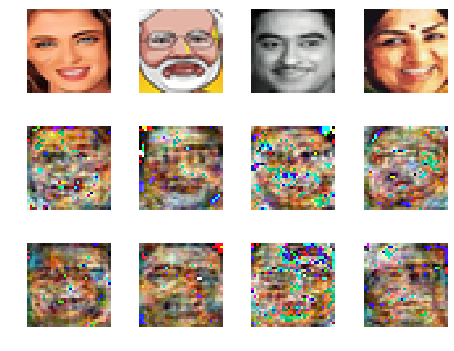

discriminator loss at step 12100:	 1.0798118114471436 	-- adversarial loss at step 12100:	 1.0091208
discriminator loss at step 12200:	 1.0767930746078491 	-- adversarial loss at step 12200:	 1.0693973
discriminator loss at step 12300:	 1.0770384073257446 	-- adversarial loss at step 12300:	 0.95968795
discriminator loss at step 12400:	 1.0843945741653442 	-- adversarial loss at step 12400:	 1.0703859
discriminator loss at step 12500:	 1.0413968563079834 	-- adversarial loss at step 12500:	 1.0760343


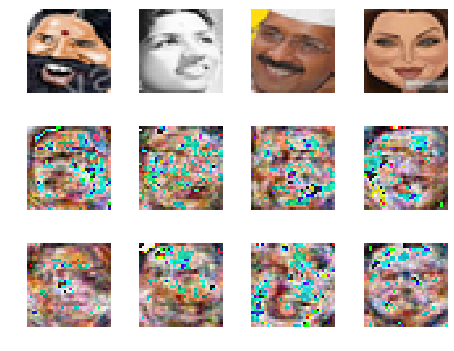

discriminator loss at step 12600:	 1.0646007061004639 	-- adversarial loss at step 12600:	 1.0377641
discriminator loss at step 12700:	 1.0689483880996704 	-- adversarial loss at step 12700:	 1.0546796
discriminator loss at step 12800:	 1.0308327674865723 	-- adversarial loss at step 12800:	 1.0033554
discriminator loss at step 12900:	 1.0673847198486328 	-- adversarial loss at step 12900:	 1.0457085
discriminator loss at step 13000:	 1.0474233627319336 	-- adversarial loss at step 13000:	 1.1167178


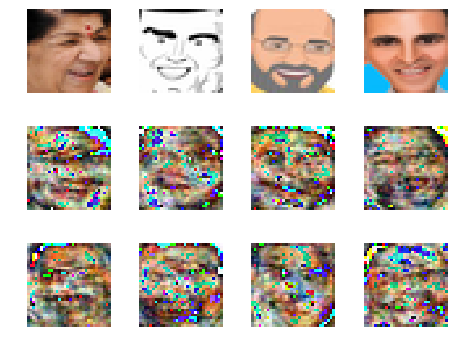

discriminator loss at step 13100:	 1.0639498233795166 	-- adversarial loss at step 13100:	 1.0017226
discriminator loss at step 13200:	 1.0712454319000244 	-- adversarial loss at step 13200:	 1.0771899
discriminator loss at step 13300:	 1.0777443647384644 	-- adversarial loss at step 13300:	 1.0582235
discriminator loss at step 13400:	 1.0665674209594727 	-- adversarial loss at step 13400:	 1.0280138
discriminator loss at step 13500:	 1.0583834648132324 	-- adversarial loss at step 13500:	 1.0693676


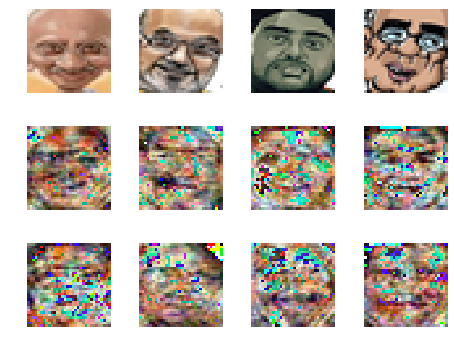

discriminator loss at step 13600:	 1.0811271667480469 	-- adversarial loss at step 13600:	 1.0453417
discriminator loss at step 13700:	 1.0619935989379883 	-- adversarial loss at step 13700:	 1.0596843
discriminator loss at step 13800:	 1.0849802494049072 	-- adversarial loss at step 13800:	 0.9973924
discriminator loss at step 13900:	 1.0737217664718628 	-- adversarial loss at step 13900:	 1.0217156
discriminator loss at step 14000:	 1.0584464073181152 	-- adversarial loss at step 14000:	 1.052448


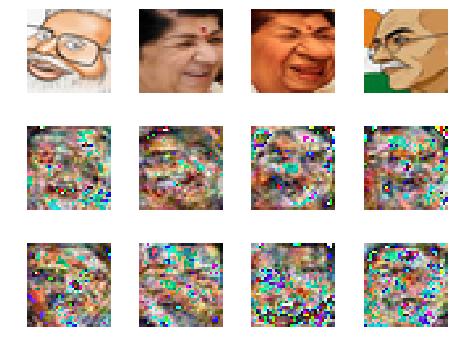

discriminator loss at step 14100:	 1.0848420858383179 	-- adversarial loss at step 14100:	 1.007565
discriminator loss at step 14200:	 1.0757718086242676 	-- adversarial loss at step 14200:	 0.9987476
discriminator loss at step 14300:	 1.049727439880371 	-- adversarial loss at step 14300:	 1.0246584
discriminator loss at step 14400:	 1.0774779319763184 	-- adversarial loss at step 14400:	 1.0276246
discriminator loss at step 14500:	 1.1129779815673828 	-- adversarial loss at step 14500:	 1.0293335


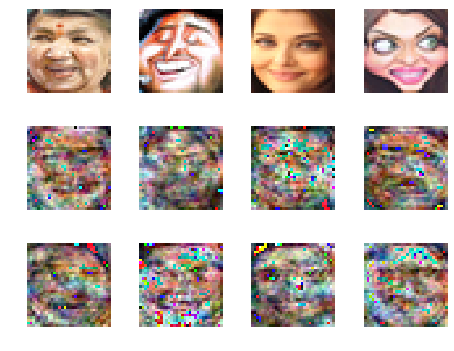

discriminator loss at step 14600:	 1.1248799562454224 	-- adversarial loss at step 14600:	 1.0335065
discriminator loss at step 14700:	 1.0790541172027588 	-- adversarial loss at step 14700:	 0.9576613
discriminator loss at step 14800:	 1.0526235103607178 	-- adversarial loss at step 14800:	 1.0397074
discriminator loss at step 14900:	 1.0987966060638428 	-- adversarial loss at step 14900:	 0.98581374
discriminator loss at step 15000:	 1.0986247062683105 	-- adversarial loss at step 15000:	 1.014833


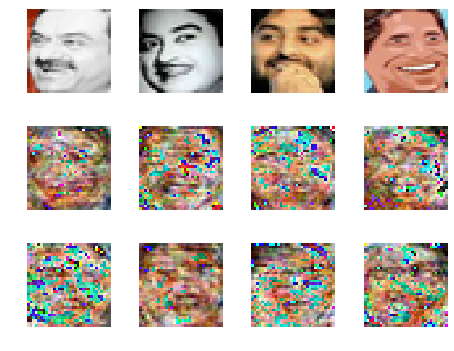

discriminator loss at step 15100:	 1.0725809335708618 	-- adversarial loss at step 15100:	 1.0299255
discriminator loss at step 15200:	 1.0560351610183716 	-- adversarial loss at step 15200:	 1.0129886
discriminator loss at step 15300:	 1.0971907377243042 	-- adversarial loss at step 15300:	 0.9871682
discriminator loss at step 15400:	 1.0535318851470947 	-- adversarial loss at step 15400:	 1.0725812
discriminator loss at step 15500:	 1.0364782810211182 	-- adversarial loss at step 15500:	 0.9764142


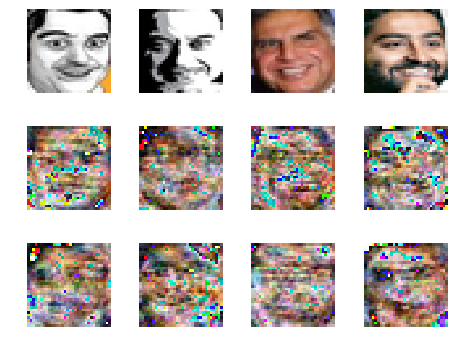

discriminator loss at step 15600:	 1.0813385248184204 	-- adversarial loss at step 15600:	 1.0304358
discriminator loss at step 15700:	 1.0552139282226562 	-- adversarial loss at step 15700:	 1.0117474
discriminator loss at step 15800:	 1.1042094230651855 	-- adversarial loss at step 15800:	 0.9982844
discriminator loss at step 15900:	 1.0451574325561523 	-- adversarial loss at step 15900:	 1.1048851
discriminator loss at step 16000:	 1.0906498432159424 	-- adversarial loss at step 16000:	 1.0307908


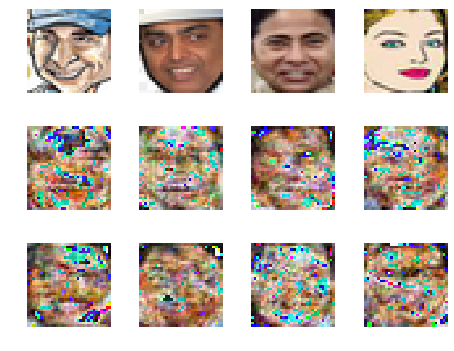

discriminator loss at step 16100:	 1.0640408992767334 	-- adversarial loss at step 16100:	 1.0164115
discriminator loss at step 16200:	 1.072906494140625 	-- adversarial loss at step 16200:	 1.0742078
discriminator loss at step 16300:	 1.0728574991226196 	-- adversarial loss at step 16300:	 1.0728387
discriminator loss at step 16400:	 1.0732665061950684 	-- adversarial loss at step 16400:	 1.0684384
discriminator loss at step 16500:	 1.0528234243392944 	-- adversarial loss at step 16500:	 1.0027905


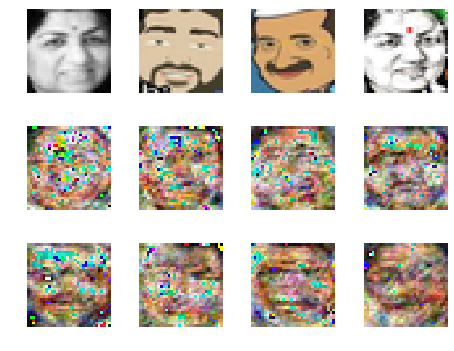

discriminator loss at step 16600:	 1.109429955482483 	-- adversarial loss at step 16600:	 0.99243665
discriminator loss at step 16700:	 1.0836293697357178 	-- adversarial loss at step 16700:	 0.98151606
discriminator loss at step 16800:	 1.0279181003570557 	-- adversarial loss at step 16800:	 1.1353977
discriminator loss at step 16900:	 1.11200749874115 	-- adversarial loss at step 16900:	 1.0482761
discriminator loss at step 17000:	 1.0987341403961182 	-- adversarial loss at step 17000:	 1.0968736


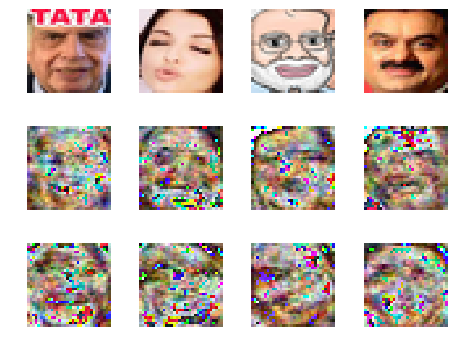

discriminator loss at step 17100:	 1.0781041383743286 	-- adversarial loss at step 17100:	 1.1230204
discriminator loss at step 17200:	 1.0995159149169922 	-- adversarial loss at step 17200:	 1.0988529
discriminator loss at step 17300:	 1.0661885738372803 	-- adversarial loss at step 17300:	 1.0887916
discriminator loss at step 17400:	 1.0292108058929443 	-- adversarial loss at step 17400:	 1.0262992
discriminator loss at step 17500:	 1.0949995517730713 	-- adversarial loss at step 17500:	 1.0945039


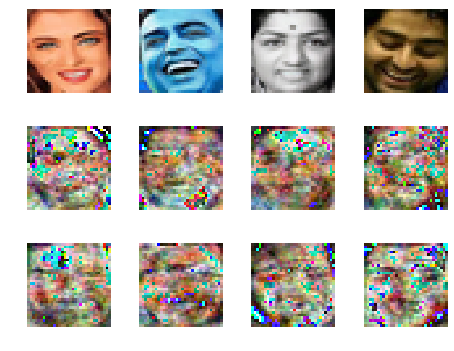

discriminator loss at step 17600:	 1.0813980102539062 	-- adversarial loss at step 17600:	 1.0467637
discriminator loss at step 17700:	 1.0471469163894653 	-- adversarial loss at step 17700:	 1.0607884
discriminator loss at step 17800:	 1.0822203159332275 	-- adversarial loss at step 17800:	 1.0935427
discriminator loss at step 17900:	 1.0588839054107666 	-- adversarial loss at step 17900:	 0.946203
discriminator loss at step 18000:	 1.087960958480835 	-- adversarial loss at step 18000:	 1.0854733


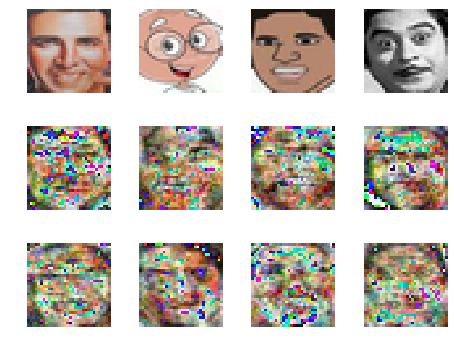

discriminator loss at step 18100:	 1.0163280963897705 	-- adversarial loss at step 18100:	 1.2587277
discriminator loss at step 18200:	 1.104298710823059 	-- adversarial loss at step 18200:	 1.1408143
discriminator loss at step 18300:	 1.053403615951538 	-- adversarial loss at step 18300:	 1.1936831
discriminator loss at step 18400:	 1.1308887004852295 	-- adversarial loss at step 18400:	 1.0443404
discriminator loss at step 18500:	 1.0494540929794312 	-- adversarial loss at step 18500:	 1.1252142


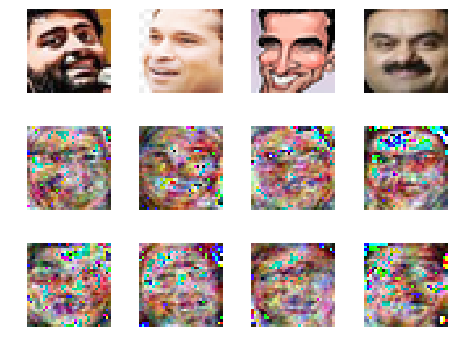

discriminator loss at step 18600:	 1.0681209564208984 	-- adversarial loss at step 18600:	 0.9790571
discriminator loss at step 18700:	 1.0400018692016602 	-- adversarial loss at step 18700:	 1.0928795
discriminator loss at step 18800:	 1.0848712921142578 	-- adversarial loss at step 18800:	 1.0825846
discriminator loss at step 18900:	 1.0839067697525024 	-- adversarial loss at step 18900:	 1.0757565
discriminator loss at step 19000:	 1.0670166015625 	-- adversarial loss at step 19000:	 1.1222003


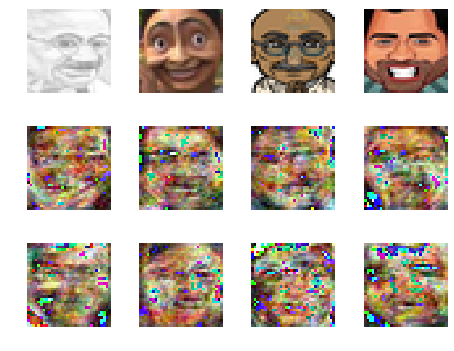

discriminator loss at step 19100:	 1.0503076314926147 	-- adversarial loss at step 19100:	 1.0807354
discriminator loss at step 19200:	 1.07449209690094 	-- adversarial loss at step 19200:	 1.0621119
discriminator loss at step 19300:	 1.0420234203338623 	-- adversarial loss at step 19300:	 1.0921164
discriminator loss at step 19400:	 1.0513803958892822 	-- adversarial loss at step 19400:	 1.1310575
discriminator loss at step 19500:	 1.0533710718154907 	-- adversarial loss at step 19500:	 1.101022


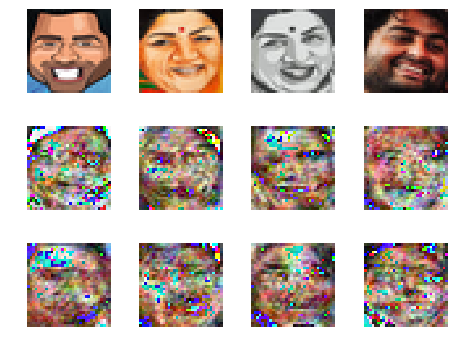

discriminator loss at step 19600:	 1.0389277935028076 	-- adversarial loss at step 19600:	 1.0988789
discriminator loss at step 19700:	 1.0644235610961914 	-- adversarial loss at step 19700:	 1.2043399
discriminator loss at step 19800:	 1.0468883514404297 	-- adversarial loss at step 19800:	 1.086554
discriminator loss at step 19900:	 1.0167772769927979 	-- adversarial loss at step 19900:	 1.1531103
discriminator loss at step 20000:	 1.057999849319458 	-- adversarial loss at step 20000:	 1.1425884


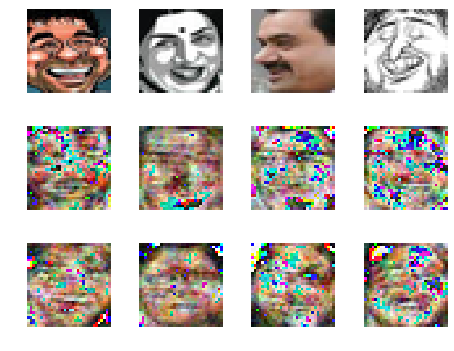

discriminator loss at step 20100:	 1.0871798992156982 	-- adversarial loss at step 20100:	 1.0358099
discriminator loss at step 20200:	 1.0252177715301514 	-- adversarial loss at step 20200:	 1.073727
discriminator loss at step 20300:	 1.079899787902832 	-- adversarial loss at step 20300:	 1.0937595
discriminator loss at step 20400:	 1.0889787673950195 	-- adversarial loss at step 20400:	 1.0911686
discriminator loss at step 20500:	 1.046884298324585 	-- adversarial loss at step 20500:	 1.1206868


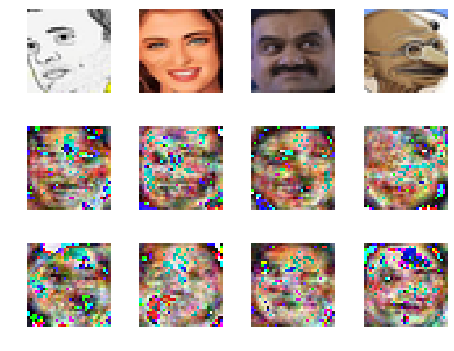

discriminator loss at step 20600:	 1.08443284034729 	-- adversarial loss at step 20600:	 1.0324638
discriminator loss at step 20700:	 1.032705545425415 	-- adversarial loss at step 20700:	 1.0763196
discriminator loss at step 20800:	 1.0709335803985596 	-- adversarial loss at step 20800:	 1.1058629
discriminator loss at step 20900:	 1.0788443088531494 	-- adversarial loss at step 20900:	 1.0691838
discriminator loss at step 21000:	 1.0419909954071045 	-- adversarial loss at step 21000:	 1.1327245


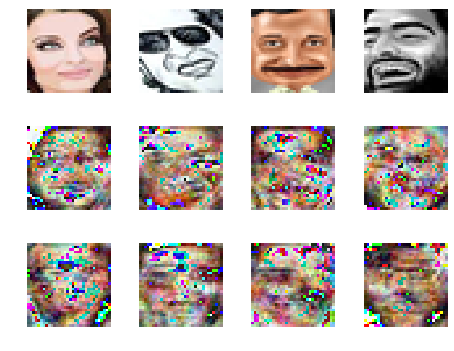

discriminator loss at step 21100:	 1.066659927368164 	-- adversarial loss at step 21100:	 1.0591431
discriminator loss at step 21200:	 1.0674546957015991 	-- adversarial loss at step 21200:	 1.0080744
discriminator loss at step 21300:	 1.0164086818695068 	-- adversarial loss at step 21300:	 1.108746
discriminator loss at step 21400:	 1.1030967235565186 	-- adversarial loss at step 21400:	 1.0863471
discriminator loss at step 21500:	 1.0228675603866577 	-- adversarial loss at step 21500:	 1.1012319


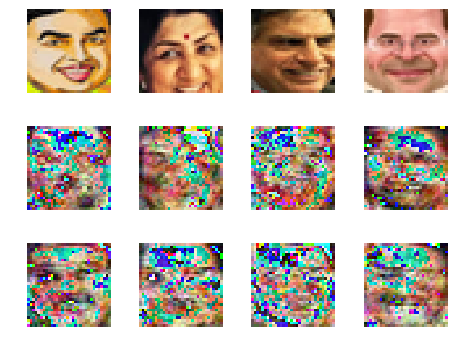

discriminator loss at step 21600:	 1.0635801553726196 	-- adversarial loss at step 21600:	 1.1094929
discriminator loss at step 21700:	 1.0888125896453857 	-- adversarial loss at step 21700:	 1.0094106
discriminator loss at step 21800:	 1.1146471500396729 	-- adversarial loss at step 21800:	 0.96304256
discriminator loss at step 21900:	 1.053546667098999 	-- adversarial loss at step 21900:	 1.1089544
discriminator loss at step 22000:	 1.113682746887207 	-- adversarial loss at step 22000:	 1.0421599


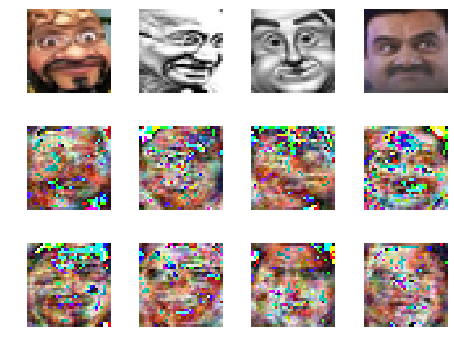

discriminator loss at step 22100:	 1.0689103603363037 	-- adversarial loss at step 22100:	 1.0383487
discriminator loss at step 22200:	 1.0698846578598022 	-- adversarial loss at step 22200:	 1.0152862
discriminator loss at step 22300:	 1.0536096096038818 	-- adversarial loss at step 22300:	 1.0231214
discriminator loss at step 22400:	 1.094853162765503 	-- adversarial loss at step 22400:	 0.98911417
discriminator loss at step 22500:	 1.0747332572937012 	-- adversarial loss at step 22500:	 1.0229614


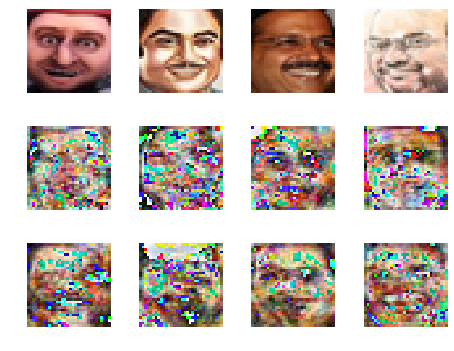

discriminator loss at step 22600:	 1.0853232145309448 	-- adversarial loss at step 22600:	 1.0618992
discriminator loss at step 22700:	 1.0930452346801758 	-- adversarial loss at step 22700:	 1.0298402
discriminator loss at step 22800:	 1.0518040657043457 	-- adversarial loss at step 22800:	 1.1021042
discriminator loss at step 22900:	 1.0725734233856201 	-- adversarial loss at step 22900:	 0.9725439
discriminator loss at step 23000:	 1.0568304061889648 	-- adversarial loss at step 23000:	 1.0849786


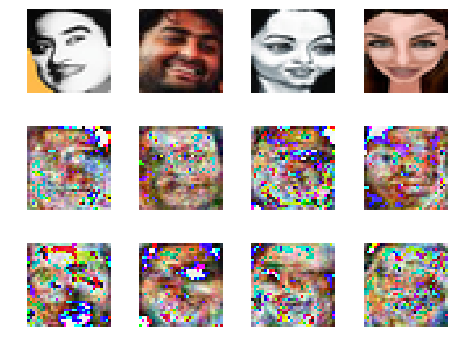

discriminator loss at step 23100:	 1.0581960678100586 	-- adversarial loss at step 23100:	 1.0074258
discriminator loss at step 23200:	 1.1024060249328613 	-- adversarial loss at step 23200:	 1.0219429
discriminator loss at step 23300:	 1.0467474460601807 	-- adversarial loss at step 23300:	 1.049524
discriminator loss at step 23400:	 1.0937719345092773 	-- adversarial loss at step 23400:	 1.0660884
discriminator loss at step 23500:	 1.0578538179397583 	-- adversarial loss at step 23500:	 0.959442


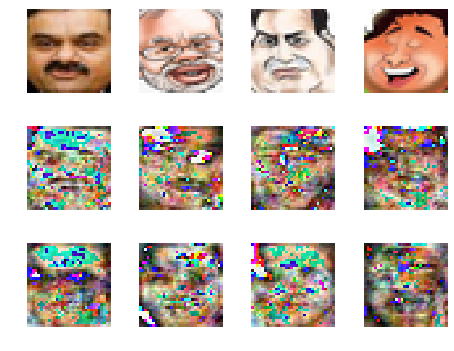

discriminator loss at step 23600:	 1.0851258039474487 	-- adversarial loss at step 23600:	 1.0573163
discriminator loss at step 23700:	 1.0847444534301758 	-- adversarial loss at step 23700:	 1.0485448
discriminator loss at step 23800:	 1.0564241409301758 	-- adversarial loss at step 23800:	 1.0490015
discriminator loss at step 23900:	 1.0460549592971802 	-- adversarial loss at step 23900:	 0.9435667
discriminator loss at step 24000:	 1.0604689121246338 	-- adversarial loss at step 24000:	 1.0319533


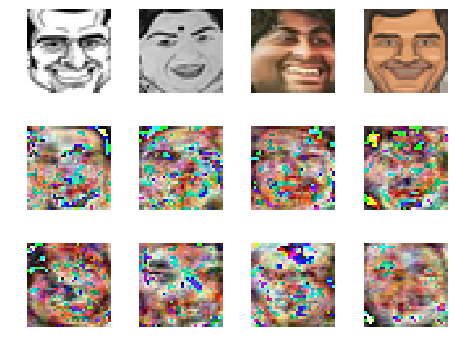

discriminator loss at step 24100:	 1.0323090553283691 	-- adversarial loss at step 24100:	 1.0396001
discriminator loss at step 24200:	 1.1000828742980957 	-- adversarial loss at step 24200:	 0.99157137
discriminator loss at step 24300:	 1.0373239517211914 	-- adversarial loss at step 24300:	 1.0178806
discriminator loss at step 24400:	 1.117551565170288 	-- adversarial loss at step 24400:	 1.035848
discriminator loss at step 24500:	 1.0602481365203857 	-- adversarial loss at step 24500:	 1.0138973


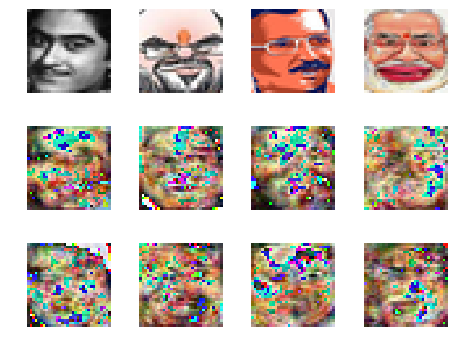

discriminator loss at step 24600:	 1.0729155540466309 	-- adversarial loss at step 24600:	 1.020581
discriminator loss at step 24700:	 1.0949904918670654 	-- adversarial loss at step 24700:	 0.9846649
discriminator loss at step 24800:	 1.0660113096237183 	-- adversarial loss at step 24800:	 1.1237965
discriminator loss at step 24900:	 1.1632869243621826 	-- adversarial loss at step 24900:	 1.0480006
discriminator loss at step 25000:	 1.0897926092147827 	-- adversarial loss at step 25000:	 0.99163264


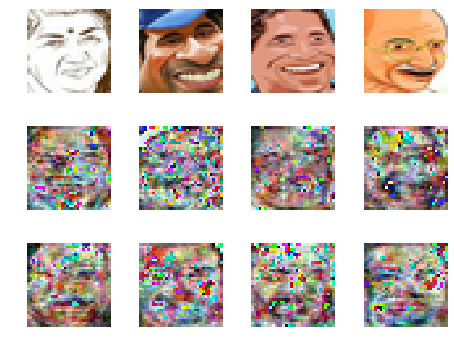

discriminator loss at step 25100:	 1.0669454336166382 	-- adversarial loss at step 25100:	 1.0628116
discriminator loss at step 25200:	 1.07474684715271 	-- adversarial loss at step 25200:	 1.0699152
discriminator loss at step 25300:	 1.098134160041809 	-- adversarial loss at step 25300:	 1.009203
discriminator loss at step 25400:	 1.1151213645935059 	-- adversarial loss at step 25400:	 1.0833192
discriminator loss at step 25500:	 1.0696475505828857 	-- adversarial loss at step 25500:	 1.0792017


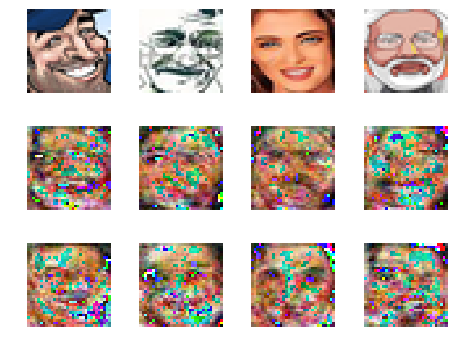

discriminator loss at step 25600:	 1.0583463907241821 	-- adversarial loss at step 25600:	 1.0482267
discriminator loss at step 25700:	 1.0849016904830933 	-- adversarial loss at step 25700:	 1.0356218
discriminator loss at step 25800:	 1.0705103874206543 	-- adversarial loss at step 25800:	 1.0602216
discriminator loss at step 25900:	 1.0724674463272095 	-- adversarial loss at step 25900:	 1.0295393
discriminator loss at step 26000:	 1.0978153944015503 	-- adversarial loss at step 26000:	 0.99858975


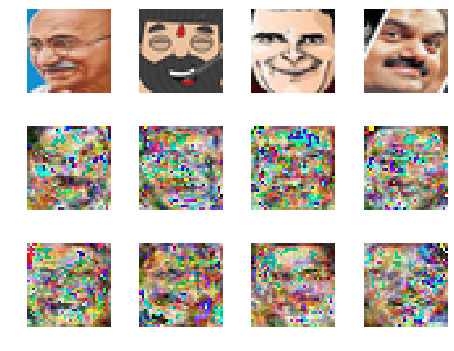

discriminator loss at step 26100:	 1.06569504737854 	-- adversarial loss at step 26100:	 1.020357
discriminator loss at step 26200:	 1.0956363677978516 	-- adversarial loss at step 26200:	 1.0173805
discriminator loss at step 26300:	 1.0531392097473145 	-- adversarial loss at step 26300:	 1.0638113
discriminator loss at step 26400:	 1.0716049671173096 	-- adversarial loss at step 26400:	 1.0119432
discriminator loss at step 26500:	 1.0670199394226074 	-- adversarial loss at step 26500:	 1.0510381


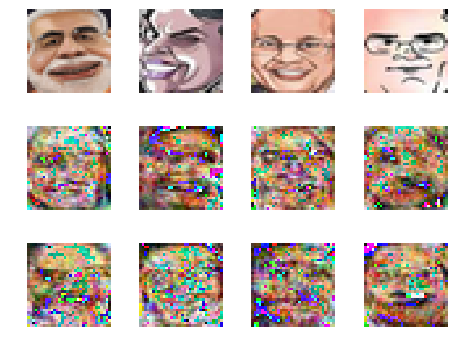

discriminator loss at step 26600:	 1.0853610038757324 	-- adversarial loss at step 26600:	 1.0307438
discriminator loss at step 26700:	 1.0596439838409424 	-- adversarial loss at step 26700:	 1.0371324
discriminator loss at step 26800:	 1.094449758529663 	-- adversarial loss at step 26800:	 1.0357678
discriminator loss at step 26900:	 1.0679317712783813 	-- adversarial loss at step 26900:	 1.0689313
discriminator loss at step 27000:	 1.0736979246139526 	-- adversarial loss at step 27000:	 1.0340936


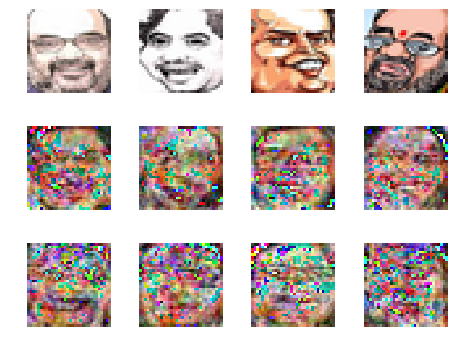

discriminator loss at step 27100:	 1.0648095607757568 	-- adversarial loss at step 27100:	 1.0740759
discriminator loss at step 27200:	 1.0762364864349365 	-- adversarial loss at step 27200:	 1.0439473
discriminator loss at step 27300:	 1.06269371509552 	-- adversarial loss at step 27300:	 1.0776465
discriminator loss at step 27400:	 1.0733306407928467 	-- adversarial loss at step 27400:	 1.0583265
discriminator loss at step 27500:	 1.079406976699829 	-- adversarial loss at step 27500:	 1.0431705


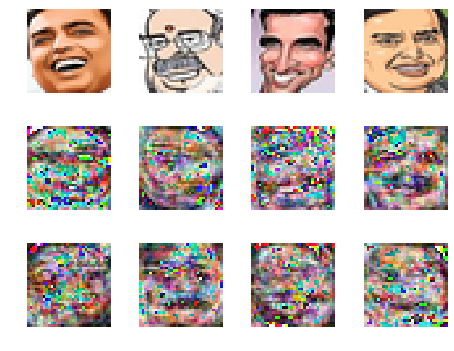

discriminator loss at step 27600:	 1.0448126792907715 	-- adversarial loss at step 27600:	 1.0742797
discriminator loss at step 27700:	 1.06544828414917 	-- adversarial loss at step 27700:	 1.0368631
discriminator loss at step 27800:	 1.0890657901763916 	-- adversarial loss at step 27800:	 1.0620933
discriminator loss at step 27900:	 1.0393643379211426 	-- adversarial loss at step 27900:	 1.1272719
discriminator loss at step 28000:	 1.0669212341308594 	-- adversarial loss at step 28000:	 1.0387647


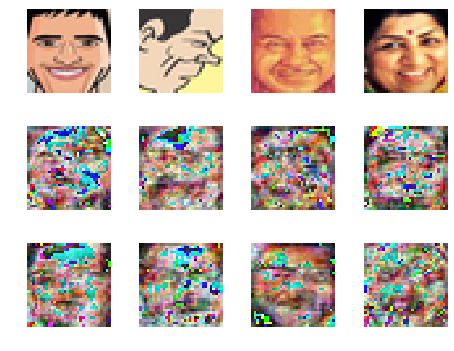

discriminator loss at step 28100:	 1.076888918876648 	-- adversarial loss at step 28100:	 1.0678382
discriminator loss at step 28200:	 1.076178789138794 	-- adversarial loss at step 28200:	 1.0136116
discriminator loss at step 28300:	 1.0592942237854004 	-- adversarial loss at step 28300:	 1.0551801
discriminator loss at step 28400:	 1.0764756202697754 	-- adversarial loss at step 28400:	 1.0101291
discriminator loss at step 28500:	 1.0751609802246094 	-- adversarial loss at step 28500:	 1.036127


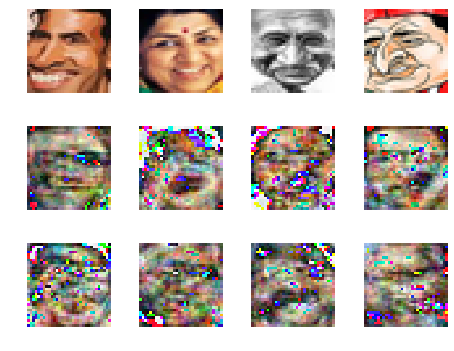

discriminator loss at step 28600:	 1.081438422203064 	-- adversarial loss at step 28600:	 1.0486093
discriminator loss at step 28700:	 1.0608749389648438 	-- adversarial loss at step 28700:	 1.0897549
discriminator loss at step 28800:	 1.0624974966049194 	-- adversarial loss at step 28800:	 1.0609586
discriminator loss at step 28900:	 1.0251288414001465 	-- adversarial loss at step 28900:	 1.055974
discriminator loss at step 29000:	 1.0487725734710693 	-- adversarial loss at step 29000:	 1.0242906


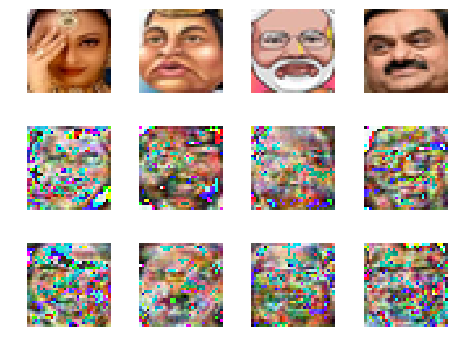

discriminator loss at step 29100:	 1.061774730682373 	-- adversarial loss at step 29100:	 1.045664
discriminator loss at step 29200:	 1.086305856704712 	-- adversarial loss at step 29200:	 1.0125073
discriminator loss at step 29300:	 1.0553128719329834 	-- adversarial loss at step 29300:	 1.0652512
discriminator loss at step 29400:	 1.0801537036895752 	-- adversarial loss at step 29400:	 1.0169879
discriminator loss at step 29500:	 1.0652930736541748 	-- adversarial loss at step 29500:	 1.0585432


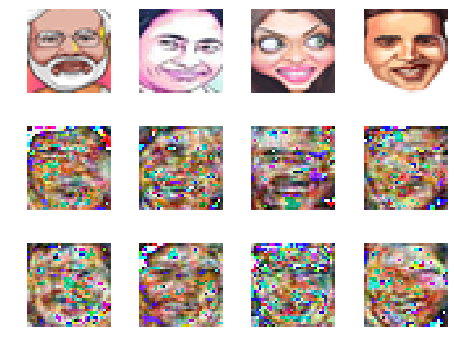

discriminator loss at step 29600:	 1.0502941608428955 	-- adversarial loss at step 29600:	 1.0488505
discriminator loss at step 29700:	 1.060995101928711 	-- adversarial loss at step 29700:	 1.037075
discriminator loss at step 29800:	 1.0736781358718872 	-- adversarial loss at step 29800:	 1.0525894
discriminator loss at step 29900:	 1.0853972434997559 	-- adversarial loss at step 29900:	 1.0112324
discriminator loss at step 30000:	 1.065155267715454 	-- adversarial loss at step 30000:	 1.0675113


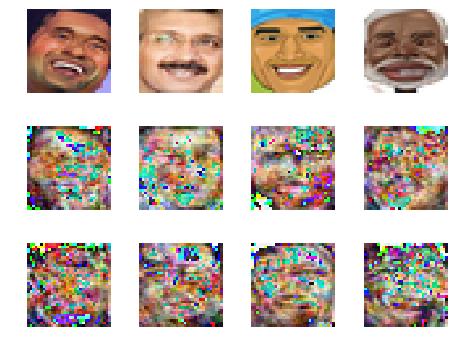

discriminator loss at step 30100:	 1.0555312633514404 	-- adversarial loss at step 30100:	 1.050905
discriminator loss at step 30200:	 1.074833869934082 	-- adversarial loss at step 30200:	 1.0648217
discriminator loss at step 30300:	 1.089167594909668 	-- adversarial loss at step 30300:	 1.0051196
discriminator loss at step 30400:	 1.0647495985031128 	-- adversarial loss at step 30400:	 1.0082185
discriminator loss at step 30500:	 1.0475125312805176 	-- adversarial loss at step 30500:	 1.0429902


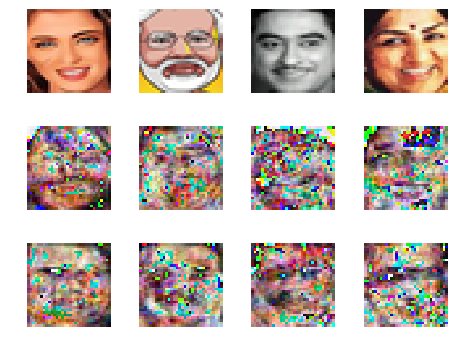

discriminator loss at step 30600:	 1.0793462991714478 	-- adversarial loss at step 30600:	 1.0141449
discriminator loss at step 30700:	 1.0606367588043213 	-- adversarial loss at step 30700:	 1.0326865
discriminator loss at step 30800:	 1.0735650062561035 	-- adversarial loss at step 30800:	 1.0432026
discriminator loss at step 30900:	 1.0565905570983887 	-- adversarial loss at step 30900:	 1.0036705
discriminator loss at step 31000:	 1.0705398321151733 	-- adversarial loss at step 31000:	 1.0240756


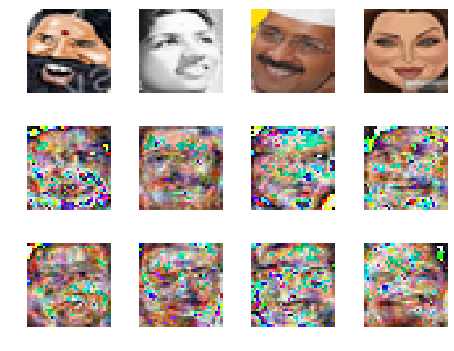

discriminator loss at step 31100:	 1.0608420372009277 	-- adversarial loss at step 31100:	 0.9899894
discriminator loss at step 31200:	 1.090881586074829 	-- adversarial loss at step 31200:	 1.0088959
discriminator loss at step 31300:	 1.0596301555633545 	-- adversarial loss at step 31300:	 1.014568
discriminator loss at step 31400:	 1.044215202331543 	-- adversarial loss at step 31400:	 1.0298276
discriminator loss at step 31500:	 1.0575653314590454 	-- adversarial loss at step 31500:	 1.0106344


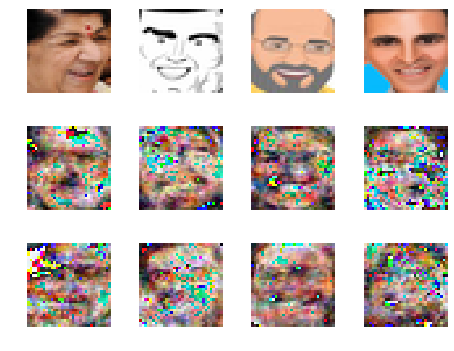

discriminator loss at step 31600:	 1.0537140369415283 	-- adversarial loss at step 31600:	 1.0103302
discriminator loss at step 31700:	 1.0583884716033936 	-- adversarial loss at step 31700:	 0.99951154
discriminator loss at step 31800:	 1.0748791694641113 	-- adversarial loss at step 31800:	 1.0327144
discriminator loss at step 31900:	 1.084336519241333 	-- adversarial loss at step 31900:	 0.9942448
discriminator loss at step 32000:	 1.1022911071777344 	-- adversarial loss at step 32000:	 1.0167298


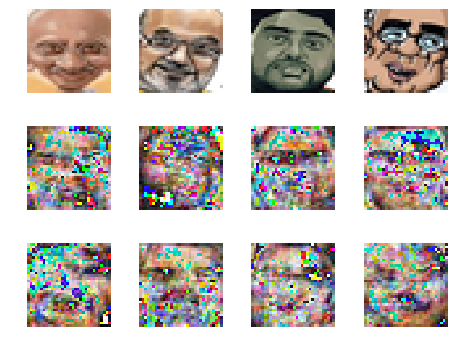

discriminator loss at step 32100:	 1.044954776763916 	-- adversarial loss at step 32100:	 1.0416017
discriminator loss at step 32200:	 1.0901308059692383 	-- adversarial loss at step 32200:	 1.0027016
discriminator loss at step 32300:	 1.0765560865402222 	-- adversarial loss at step 32300:	 1.0114759
discriminator loss at step 32400:	 1.051617980003357 	-- adversarial loss at step 32400:	 1.0241508
discriminator loss at step 32500:	 1.067927598953247 	-- adversarial loss at step 32500:	 1.0068787


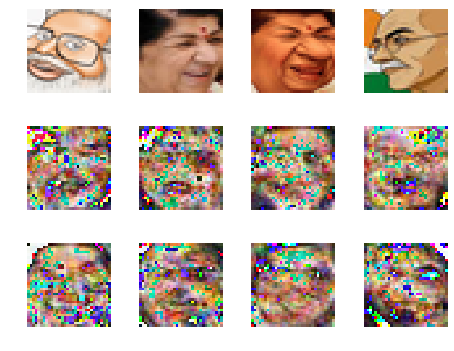

discriminator loss at step 32600:	 1.054466724395752 	-- adversarial loss at step 32600:	 1.0484933
discriminator loss at step 32700:	 1.0619854927062988 	-- adversarial loss at step 32700:	 1.0209298
discriminator loss at step 32800:	 1.0675054788589478 	-- adversarial loss at step 32800:	 1.0346038
discriminator loss at step 32900:	 1.0669753551483154 	-- adversarial loss at step 32900:	 1.0707628
discriminator loss at step 33000:	 1.0806591510772705 	-- adversarial loss at step 33000:	 1.0071869


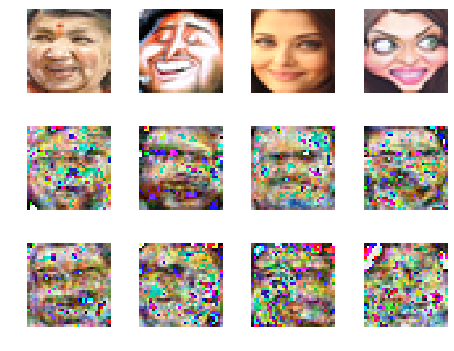

discriminator loss at step 33100:	 1.0686941146850586 	-- adversarial loss at step 33100:	 1.0502374
discriminator loss at step 33200:	 1.0586639642715454 	-- adversarial loss at step 33200:	 1.0474926
discriminator loss at step 33300:	 1.064152479171753 	-- adversarial loss at step 33300:	 0.99572027
discriminator loss at step 33400:	 1.0677225589752197 	-- adversarial loss at step 33400:	 1.0281578
discriminator loss at step 33500:	 1.0647802352905273 	-- adversarial loss at step 33500:	 1.0531014


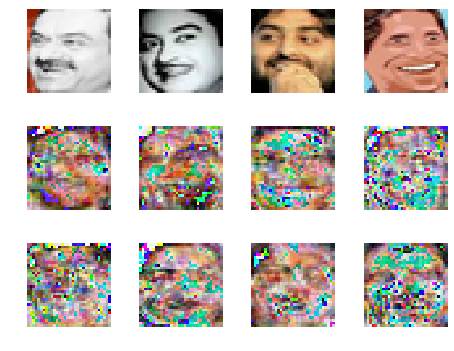

discriminator loss at step 33600:	 1.070425271987915 	-- adversarial loss at step 33600:	 1.0248543
discriminator loss at step 33700:	 1.0653902292251587 	-- adversarial loss at step 33700:	 1.0784817
discriminator loss at step 33800:	 1.0554293394088745 	-- adversarial loss at step 33800:	 1.0694301
discriminator loss at step 33900:	 1.0722007751464844 	-- adversarial loss at step 33900:	 1.049784
discriminator loss at step 34000:	 1.0542137622833252 	-- adversarial loss at step 34000:	 1.0524738


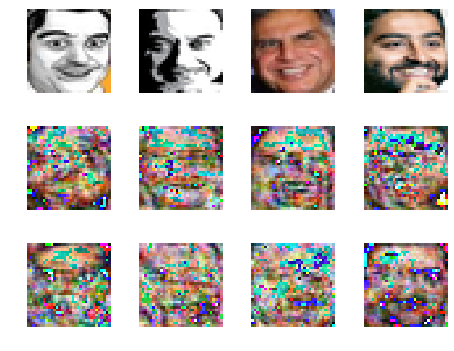

discriminator loss at step 34100:	 1.0627657175064087 	-- adversarial loss at step 34100:	 1.0680821
discriminator loss at step 34200:	 1.0965282917022705 	-- adversarial loss at step 34200:	 1.0451719
discriminator loss at step 34300:	 1.0874524116516113 	-- adversarial loss at step 34300:	 0.98331946
discriminator loss at step 34400:	 1.0619622468948364 	-- adversarial loss at step 34400:	 0.9985681
discriminator loss at step 34500:	 1.0627408027648926 	-- adversarial loss at step 34500:	 1.014833


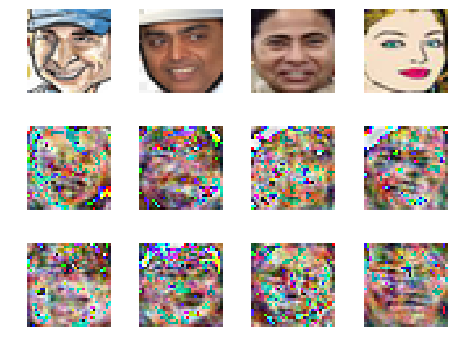

discriminator loss at step 34600:	 1.047218918800354 	-- adversarial loss at step 34600:	 1.0387838
discriminator loss at step 34700:	 1.0908643007278442 	-- adversarial loss at step 34700:	 1.0293595
discriminator loss at step 34800:	 1.071033000946045 	-- adversarial loss at step 34800:	 1.0453928
discriminator loss at step 34900:	 1.1011121273040771 	-- adversarial loss at step 34900:	 1.0653472
discriminator loss at step 35000:	 1.0539665222167969 	-- adversarial loss at step 35000:	 0.9920873


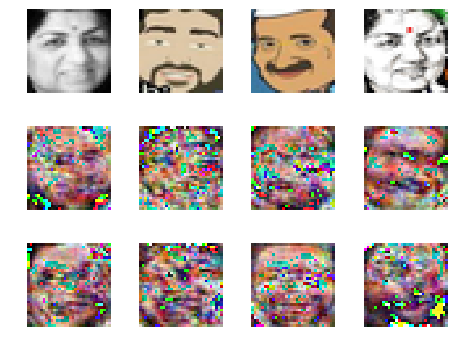

discriminator loss at step 35100:	 1.0403342247009277 	-- adversarial loss at step 35100:	 1.0507482
discriminator loss at step 35200:	 1.0836844444274902 	-- adversarial loss at step 35200:	 1.0662217
discriminator loss at step 35300:	 1.0368752479553223 	-- adversarial loss at step 35300:	 1.1008662
discriminator loss at step 35400:	 1.0599701404571533 	-- adversarial loss at step 35400:	 1.0210276
discriminator loss at step 35500:	 1.0798367261886597 	-- adversarial loss at step 35500:	 1.0465115


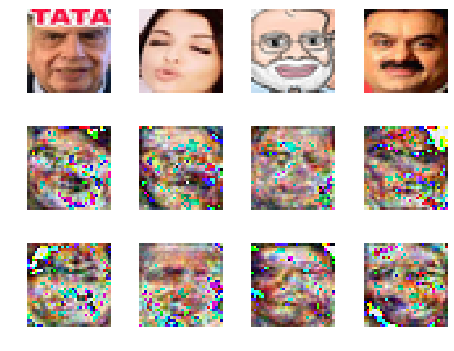

discriminator loss at step 35600:	 1.0593174695968628 	-- adversarial loss at step 35600:	 1.1310723
discriminator loss at step 35700:	 1.0584721565246582 	-- adversarial loss at step 35700:	 1.0690053
discriminator loss at step 35800:	 1.0688658952713013 	-- adversarial loss at step 35800:	 1.0075808
discriminator loss at step 35900:	 1.078245759010315 	-- adversarial loss at step 35900:	 1.0444975
discriminator loss at step 36000:	 1.0933098793029785 	-- adversarial loss at step 36000:	 1.0051396


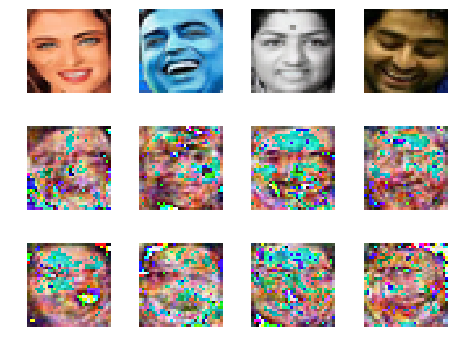

discriminator loss at step 36100:	 1.0818371772766113 	-- adversarial loss at step 36100:	 1.038038
discriminator loss at step 36200:	 1.0933003425598145 	-- adversarial loss at step 36200:	 0.9942002
discriminator loss at step 36300:	 1.0841851234436035 	-- adversarial loss at step 36300:	 1.0609869
discriminator loss at step 36400:	 1.0695438385009766 	-- adversarial loss at step 36400:	 1.0008332
discriminator loss at step 36500:	 1.1070137023925781 	-- adversarial loss at step 36500:	 0.99573016


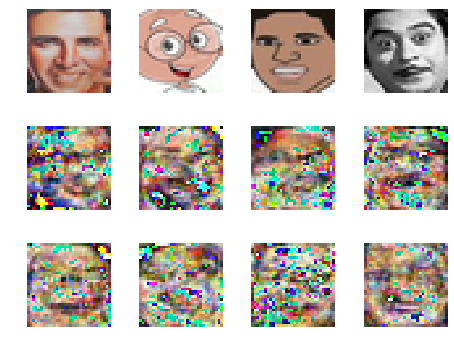

discriminator loss at step 36600:	 1.0733342170715332 	-- adversarial loss at step 36600:	 1.0225356
discriminator loss at step 36700:	 1.0753216743469238 	-- adversarial loss at step 36700:	 1.0301597
discriminator loss at step 36800:	 1.070529580116272 	-- adversarial loss at step 36800:	 1.1013895
discriminator loss at step 36900:	 1.084113359451294 	-- adversarial loss at step 36900:	 0.9955469
discriminator loss at step 37000:	 1.036449670791626 	-- adversarial loss at step 37000:	 0.99638283


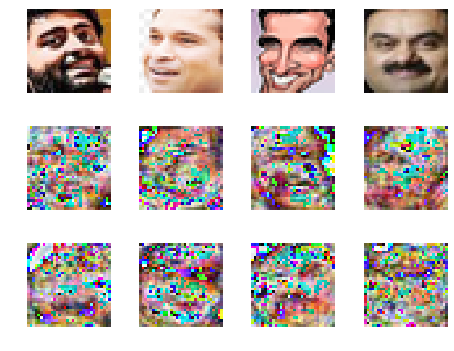

discriminator loss at step 37100:	 1.0589385032653809 	-- adversarial loss at step 37100:	 1.0578468
discriminator loss at step 37200:	 1.050229787826538 	-- adversarial loss at step 37200:	 1.094317
discriminator loss at step 37300:	 1.0457987785339355 	-- adversarial loss at step 37300:	 1.036159
discriminator loss at step 37400:	 1.0557384490966797 	-- adversarial loss at step 37400:	 0.99747694
discriminator loss at step 37500:	 1.051283359527588 	-- adversarial loss at step 37500:	 1.0378501


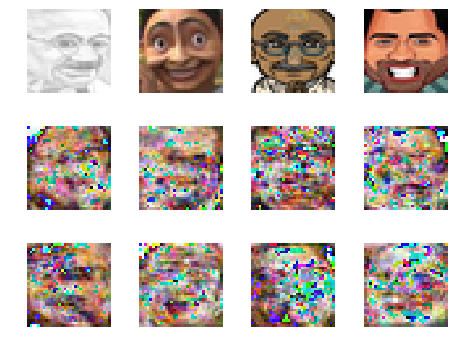

discriminator loss at step 37600:	 1.0279154777526855 	-- adversarial loss at step 37600:	 1.0773237
discriminator loss at step 37700:	 1.0884943008422852 	-- adversarial loss at step 37700:	 1.0091329
discriminator loss at step 37800:	 1.042943000793457 	-- adversarial loss at step 37800:	 1.015878
discriminator loss at step 37900:	 1.0556256771087646 	-- adversarial loss at step 37900:	 1.0117031
discriminator loss at step 38000:	 1.0833284854888916 	-- adversarial loss at step 38000:	 0.9817075


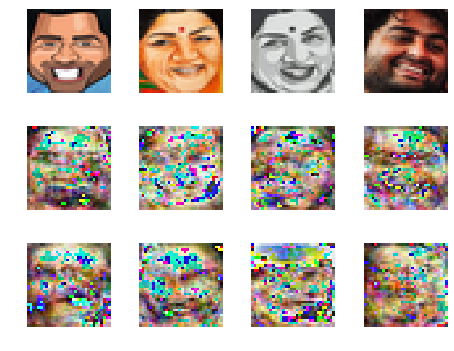

discriminator loss at step 38100:	 1.0544140338897705 	-- adversarial loss at step 38100:	 1.0469935
discriminator loss at step 38200:	 1.0668808221817017 	-- adversarial loss at step 38200:	 1.0207818
discriminator loss at step 38300:	 1.0342665910720825 	-- adversarial loss at step 38300:	 1.0084796
discriminator loss at step 38400:	 1.0540742874145508 	-- adversarial loss at step 38400:	 0.9532872
discriminator loss at step 38500:	 1.0584170818328857 	-- adversarial loss at step 38500:	 0.98911405


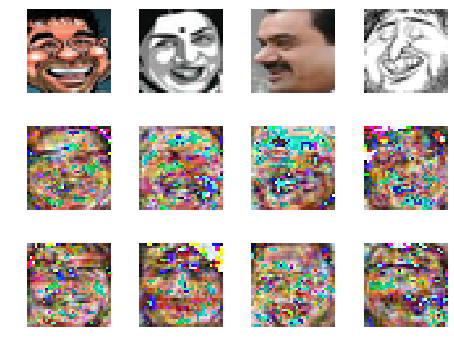

discriminator loss at step 38600:	 1.056567907333374 	-- adversarial loss at step 38600:	 1.026721
discriminator loss at step 38700:	 1.013355016708374 	-- adversarial loss at step 38700:	 0.974754
discriminator loss at step 38800:	 1.0565621852874756 	-- adversarial loss at step 38800:	 1.0596426
discriminator loss at step 38900:	 1.0560951232910156 	-- adversarial loss at step 38900:	 0.98199284
discriminator loss at step 39000:	 1.046101450920105 	-- adversarial loss at step 39000:	 1.0647289


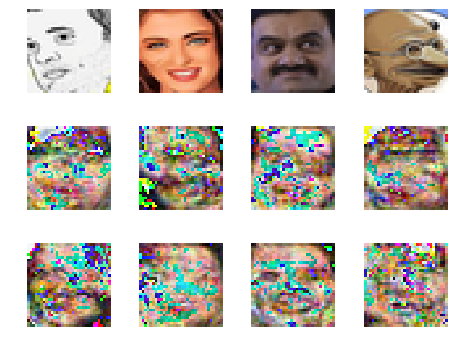

discriminator loss at step 39100:	 1.0728816986083984 	-- adversarial loss at step 39100:	 1.0583715
discriminator loss at step 39200:	 1.0759942531585693 	-- adversarial loss at step 39200:	 1.0167878
discriminator loss at step 39300:	 1.0741643905639648 	-- adversarial loss at step 39300:	 1.0912714
discriminator loss at step 39400:	 1.091007947921753 	-- adversarial loss at step 39400:	 0.9702544
discriminator loss at step 39500:	 1.0898354053497314 	-- adversarial loss at step 39500:	 1.0443392


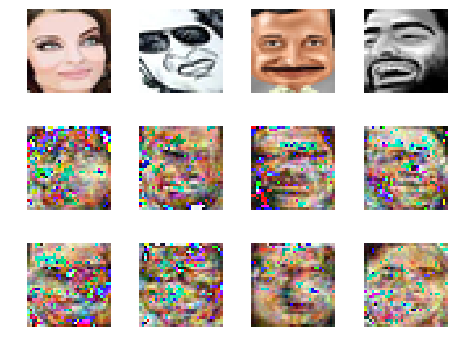

discriminator loss at step 39600:	 1.0919277667999268 	-- adversarial loss at step 39600:	 1.0212972
discriminator loss at step 39700:	 1.112905740737915 	-- adversarial loss at step 39700:	 0.98622406
discriminator loss at step 39800:	 1.0605489015579224 	-- adversarial loss at step 39800:	 1.083662
discriminator loss at step 39900:	 1.11764657497406 	-- adversarial loss at step 39900:	 0.9871708
discriminator loss at step 40000:	 1.0941622257232666 	-- adversarial loss at step 40000:	 1.0679858


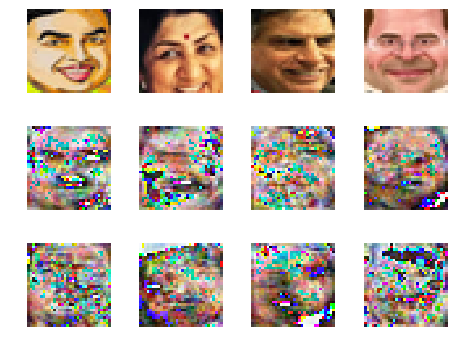

discriminator loss at step 40100:	 1.079899549484253 	-- adversarial loss at step 40100:	 1.0280724
discriminator loss at step 40200:	 1.1004102230072021 	-- adversarial loss at step 40200:	 1.0527307
discriminator loss at step 40300:	 1.0306627750396729 	-- adversarial loss at step 40300:	 1.10068
discriminator loss at step 40400:	 1.0664105415344238 	-- adversarial loss at step 40400:	 0.98207986
discriminator loss at step 40500:	 1.0369712114334106 	-- adversarial loss at step 40500:	 1.1084993


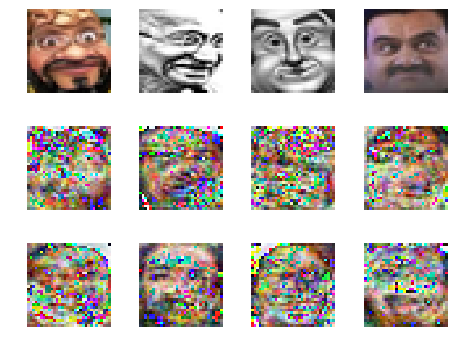

discriminator loss at step 40600:	 1.0632743835449219 	-- adversarial loss at step 40600:	 0.97983366
discriminator loss at step 40700:	 1.0775538682937622 	-- adversarial loss at step 40700:	 1.0281627
discriminator loss at step 40800:	 1.0466151237487793 	-- adversarial loss at step 40800:	 1.1071917
discriminator loss at step 40900:	 1.1048997640609741 	-- adversarial loss at step 40900:	 0.993881
discriminator loss at step 41000:	 1.0542786121368408 	-- adversarial loss at step 41000:	 1.0693842


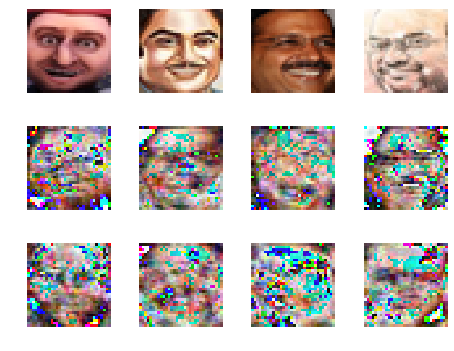

discriminator loss at step 41100:	 1.041820764541626 	-- adversarial loss at step 41100:	 1.0744154
discriminator loss at step 41200:	 1.0632365942001343 	-- adversarial loss at step 41200:	 1.0998008
discriminator loss at step 41300:	 1.0026602745056152 	-- adversarial loss at step 41300:	 1.1628276
discriminator loss at step 41400:	 1.0211458206176758 	-- adversarial loss at step 41400:	 1.0390899
discriminator loss at step 41500:	 1.066415786743164 	-- adversarial loss at step 41500:	 1.071654


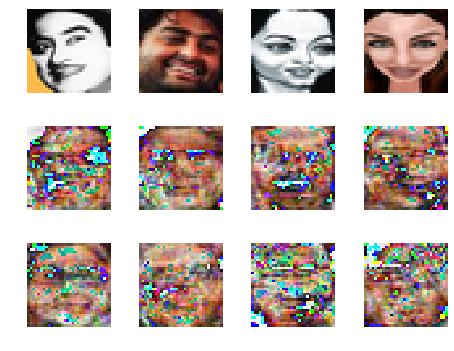

discriminator loss at step 41600:	 1.0865988731384277 	-- adversarial loss at step 41600:	 1.0701561
discriminator loss at step 41700:	 1.0826157331466675 	-- adversarial loss at step 41700:	 1.0217686
discriminator loss at step 41800:	 1.0417098999023438 	-- adversarial loss at step 41800:	 1.023473
discriminator loss at step 41900:	 1.0561691522598267 	-- adversarial loss at step 41900:	 1.0163512
discriminator loss at step 42000:	 1.0712913274765015 	-- adversarial loss at step 42000:	 1.0477417


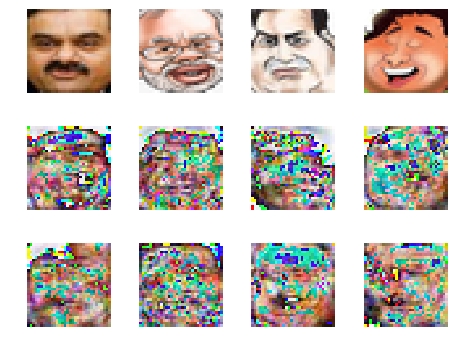

discriminator loss at step 42100:	 1.0922366380691528 	-- adversarial loss at step 42100:	 1.0585325
discriminator loss at step 42200:	 1.0505770444869995 	-- adversarial loss at step 42200:	 1.0702826
discriminator loss at step 42300:	 1.0504281520843506 	-- adversarial loss at step 42300:	 1.0572908
discriminator loss at step 42400:	 1.046433925628662 	-- adversarial loss at step 42400:	 1.0540719
discriminator loss at step 42500:	 1.0487651824951172 	-- adversarial loss at step 42500:	 1.0305643


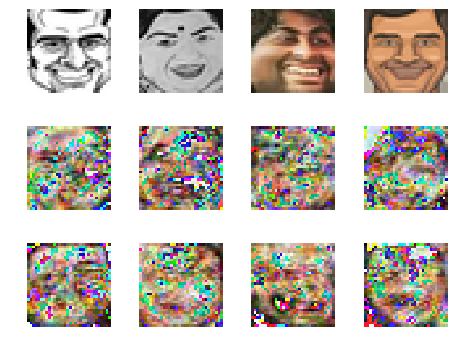

discriminator loss at step 42600:	 1.0569623708724976 	-- adversarial loss at step 42600:	 1.0573573
discriminator loss at step 42700:	 1.0907186269760132 	-- adversarial loss at step 42700:	 1.0452168
discriminator loss at step 42800:	 1.0648884773254395 	-- adversarial loss at step 42800:	 1.0706775
discriminator loss at step 42900:	 1.0638272762298584 	-- adversarial loss at step 42900:	 1.0557234
discriminator loss at step 43000:	 1.045011281967163 	-- adversarial loss at step 43000:	 1.0634782


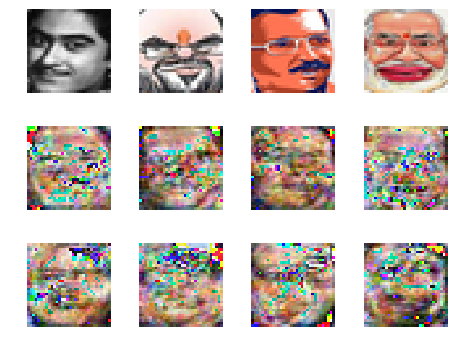

discriminator loss at step 43100:	 1.0481066703796387 	-- adversarial loss at step 43100:	 1.0279871
discriminator loss at step 43200:	 1.0552529096603394 	-- adversarial loss at step 43200:	 1.0418749
discriminator loss at step 43300:	 1.0825536251068115 	-- adversarial loss at step 43300:	 0.9971944
discriminator loss at step 43400:	 1.0641263723373413 	-- adversarial loss at step 43400:	 1.0840883
discriminator loss at step 43500:	 1.0307714939117432 	-- adversarial loss at step 43500:	 1.0450352


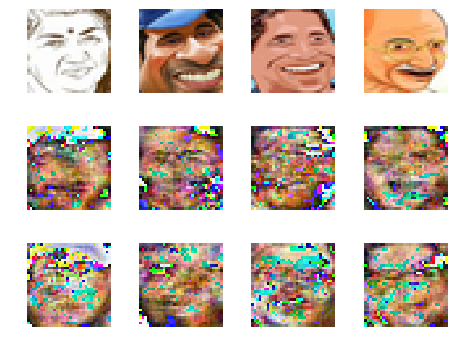

discriminator loss at step 43600:	 1.0539895296096802 	-- adversarial loss at step 43600:	 1.04358
discriminator loss at step 43700:	 1.0533690452575684 	-- adversarial loss at step 43700:	 1.079994
discriminator loss at step 43800:	 1.0627089738845825 	-- adversarial loss at step 43800:	 1.0220404
discriminator loss at step 43900:	 1.0809168815612793 	-- adversarial loss at step 43900:	 1.0600665
discriminator loss at step 44000:	 1.0606592893600464 	-- adversarial loss at step 44000:	 1.0801132


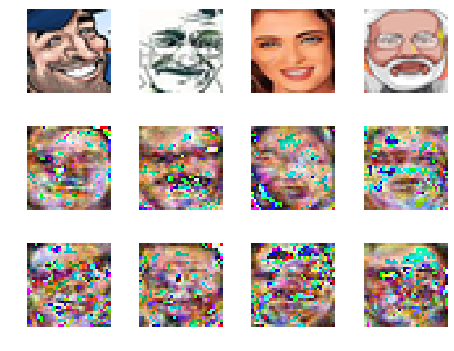

discriminator loss at step 44100:	 1.0724513530731201 	-- adversarial loss at step 44100:	 1.0386106
discriminator loss at step 44200:	 1.076887607574463 	-- adversarial loss at step 44200:	 1.0481775
discriminator loss at step 44300:	 1.0563397407531738 	-- adversarial loss at step 44300:	 1.0980223
discriminator loss at step 44400:	 1.0755200386047363 	-- adversarial loss at step 44400:	 1.0206572
discriminator loss at step 44500:	 1.0776748657226562 	-- adversarial loss at step 44500:	 1.0606277


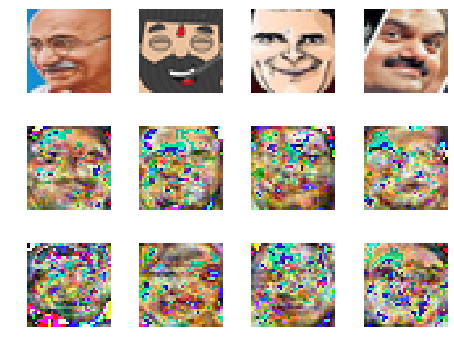

discriminator loss at step 44600:	 1.047383427619934 	-- adversarial loss at step 44600:	 1.0759969
discriminator loss at step 44700:	 1.06614089012146 	-- adversarial loss at step 44700:	 1.0143172
discriminator loss at step 44800:	 1.0509536266326904 	-- adversarial loss at step 44800:	 1.0977716
discriminator loss at step 44900:	 1.063374638557434 	-- adversarial loss at step 44900:	 1.0575856
discriminator loss at step 45000:	 1.0718607902526855 	-- adversarial loss at step 45000:	 1.0447419


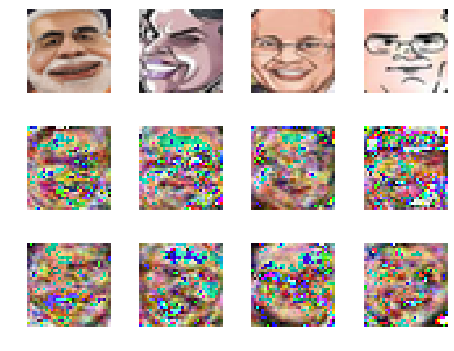

discriminator loss at step 45100:	 1.0593669414520264 	-- adversarial loss at step 45100:	 1.0622482
discriminator loss at step 45200:	 1.0829038619995117 	-- adversarial loss at step 45200:	 1.0383265
discriminator loss at step 45300:	 1.077831506729126 	-- adversarial loss at step 45300:	 1.0741758
discriminator loss at step 45400:	 1.0588295459747314 	-- adversarial loss at step 45400:	 1.0461257
discriminator loss at step 45500:	 1.0720164775848389 	-- adversarial loss at step 45500:	 1.0760686


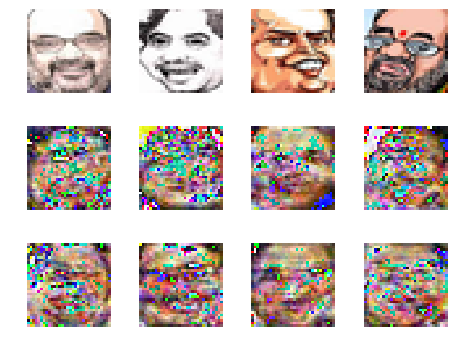

discriminator loss at step 45600:	 1.0443477630615234 	-- adversarial loss at step 45600:	 1.0516129
discriminator loss at step 45700:	 1.0728932619094849 	-- adversarial loss at step 45700:	 1.0522745
discriminator loss at step 45800:	 1.0689787864685059 	-- adversarial loss at step 45800:	 1.0889201
discriminator loss at step 45900:	 1.0508511066436768 	-- adversarial loss at step 45900:	 1.0737739
discriminator loss at step 46000:	 1.0577292442321777 	-- adversarial loss at step 46000:	 1.1179594


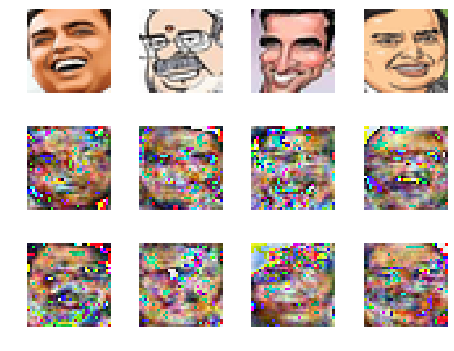

discriminator loss at step 46100:	 1.0840731859207153 	-- adversarial loss at step 46100:	 1.051779
discriminator loss at step 46200:	 1.0687452554702759 	-- adversarial loss at step 46200:	 1.0684505
discriminator loss at step 46300:	 1.073146104812622 	-- adversarial loss at step 46300:	 1.0724343
discriminator loss at step 46400:	 1.0641268491744995 	-- adversarial loss at step 46400:	 1.0638573
discriminator loss at step 46500:	 1.0493136644363403 	-- adversarial loss at step 46500:	 1.0587068


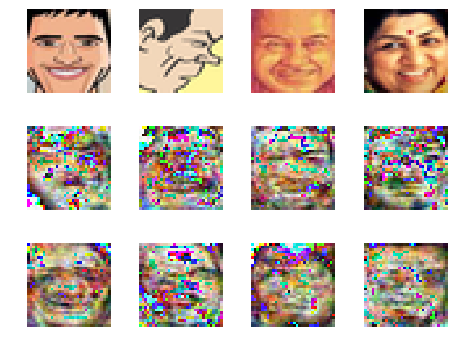

discriminator loss at step 46600:	 1.0669622421264648 	-- adversarial loss at step 46600:	 1.0337569
discriminator loss at step 46700:	 1.0493474006652832 	-- adversarial loss at step 46700:	 1.053169
discriminator loss at step 46800:	 1.0630781650543213 	-- adversarial loss at step 46800:	 1.067421
discriminator loss at step 46900:	 1.0565944910049438 	-- adversarial loss at step 46900:	 1.0742214
discriminator loss at step 47000:	 1.0400724411010742 	-- adversarial loss at step 47000:	 1.0758047


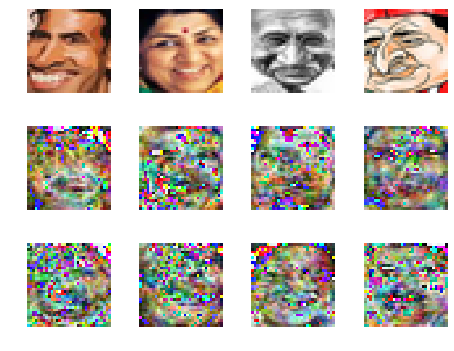

discriminator loss at step 47100:	 1.0684623718261719 	-- adversarial loss at step 47100:	 1.076211
discriminator loss at step 47200:	 1.058305263519287 	-- adversarial loss at step 47200:	 1.066705
discriminator loss at step 47300:	 1.0552624464035034 	-- adversarial loss at step 47300:	 1.0842184
discriminator loss at step 47400:	 1.063961386680603 	-- adversarial loss at step 47400:	 1.0597411
discriminator loss at step 47500:	 1.0645180940628052 	-- adversarial loss at step 47500:	 1.0749946


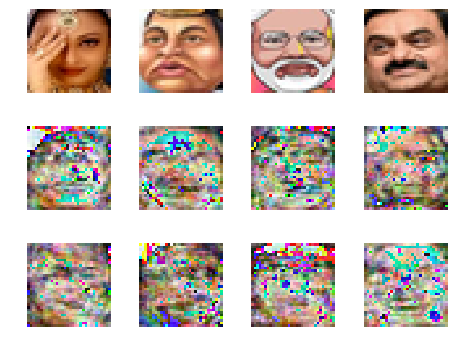

discriminator loss at step 47600:	 1.065605878829956 	-- adversarial loss at step 47600:	 1.0666928
discriminator loss at step 47700:	 1.0655782222747803 	-- adversarial loss at step 47700:	 1.0696926
discriminator loss at step 47800:	 1.0811119079589844 	-- adversarial loss at step 47800:	 1.042135
discriminator loss at step 47900:	 1.0491410493850708 	-- adversarial loss at step 47900:	 1.0799172
discriminator loss at step 48000:	 1.0534528493881226 	-- adversarial loss at step 48000:	 1.0562855


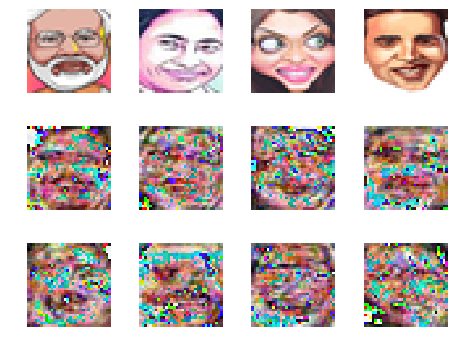

discriminator loss at step 48100:	 1.0611493587493896 	-- adversarial loss at step 48100:	 1.0530797
discriminator loss at step 48200:	 1.0445111989974976 	-- adversarial loss at step 48200:	 1.0650681
discriminator loss at step 48300:	 1.0554451942443848 	-- adversarial loss at step 48300:	 1.04608
discriminator loss at step 48400:	 1.0584897994995117 	-- adversarial loss at step 48400:	 1.0814279
discriminator loss at step 48500:	 1.0526143312454224 	-- adversarial loss at step 48500:	 1.0743575


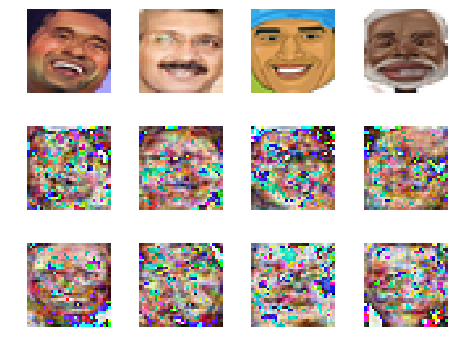

discriminator loss at step 48600:	 1.0713434219360352 	-- adversarial loss at step 48600:	 1.0699164
discriminator loss at step 48700:	 1.0602459907531738 	-- adversarial loss at step 48700:	 1.0744226
discriminator loss at step 48800:	 1.0608718395233154 	-- adversarial loss at step 48800:	 1.0615017
discriminator loss at step 48900:	 1.0636950731277466 	-- adversarial loss at step 48900:	 1.0553789
discriminator loss at step 49000:	 1.0595428943634033 	-- adversarial loss at step 49000:	 1.0805113


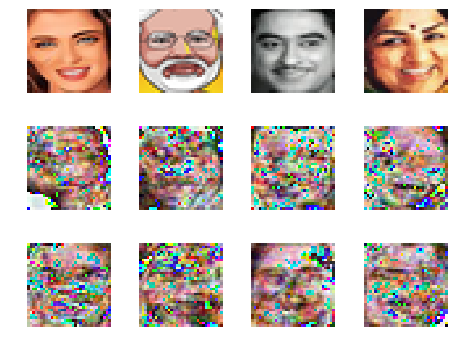

discriminator loss at step 49100:	 1.0694993734359741 	-- adversarial loss at step 49100:	 1.0468652
discriminator loss at step 49200:	 1.0584321022033691 	-- adversarial loss at step 49200:	 1.0627913
discriminator loss at step 49300:	 1.0569790601730347 	-- adversarial loss at step 49300:	 1.0388422
discriminator loss at step 49400:	 1.0641528367996216 	-- adversarial loss at step 49400:	 1.0360258
discriminator loss at step 49500:	 1.0780706405639648 	-- adversarial loss at step 49500:	 1.0625601


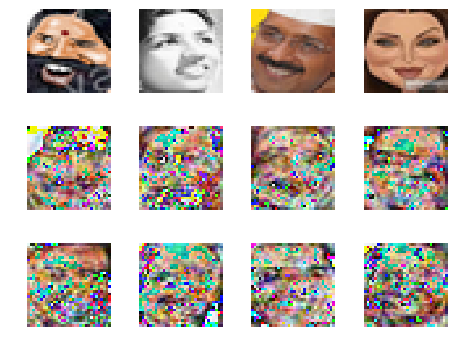

discriminator loss at step 49600:	 1.0470693111419678 	-- adversarial loss at step 49600:	 1.0458269
discriminator loss at step 49700:	 1.068199634552002 	-- adversarial loss at step 49700:	 1.0639429
discriminator loss at step 49800:	 1.053053855895996 	-- adversarial loss at step 49800:	 1.0618628
discriminator loss at step 49900:	 1.0509113073349 	-- adversarial loss at step 49900:	 1.0711329
discriminator loss at step 50000:	 1.0451632738113403 	-- adversarial loss at step 50000:	 1.0817521


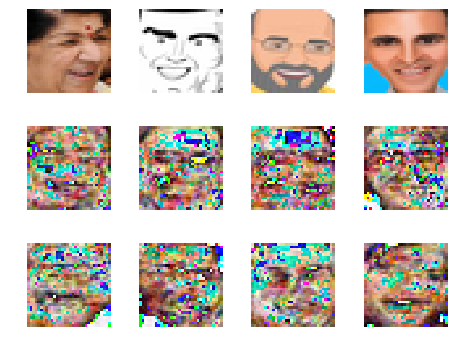

discriminator loss at step 50100:	 1.0808871984481812 	-- adversarial loss at step 50100:	 1.0195076
discriminator loss at step 50200:	 1.0501503944396973 	-- adversarial loss at step 50200:	 1.0676006
discriminator loss at step 50300:	 1.0665559768676758 	-- adversarial loss at step 50300:	 1.040389
discriminator loss at step 50400:	 1.0725326538085938 	-- adversarial loss at step 50400:	 1.0590905
discriminator loss at step 50500:	 1.047217845916748 	-- adversarial loss at step 50500:	 1.0507686


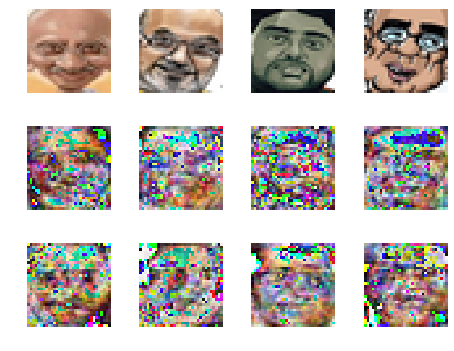

discriminator loss at step 50600:	 1.0594706535339355 	-- adversarial loss at step 50600:	 1.0473819
discriminator loss at step 50700:	 1.0516715049743652 	-- adversarial loss at step 50700:	 1.0692402
discriminator loss at step 50800:	 1.072731852531433 	-- adversarial loss at step 50800:	 1.06025
discriminator loss at step 50900:	 1.0561785697937012 	-- adversarial loss at step 50900:	 1.0539398
discriminator loss at step 51000:	 1.0659363269805908 	-- adversarial loss at step 51000:	 1.0790255


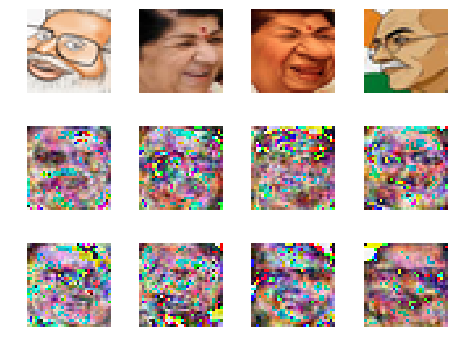

discriminator loss at step 51100:	 1.0670771598815918 	-- adversarial loss at step 51100:	 1.0568776
discriminator loss at step 51200:	 1.0570626258850098 	-- adversarial loss at step 51200:	 1.0837276
discriminator loss at step 51300:	 1.055060625076294 	-- adversarial loss at step 51300:	 1.0491076
discriminator loss at step 51400:	 1.0512017011642456 	-- adversarial loss at step 51400:	 1.0669968
discriminator loss at step 51500:	 1.0568230152130127 	-- adversarial loss at step 51500:	 1.0632396


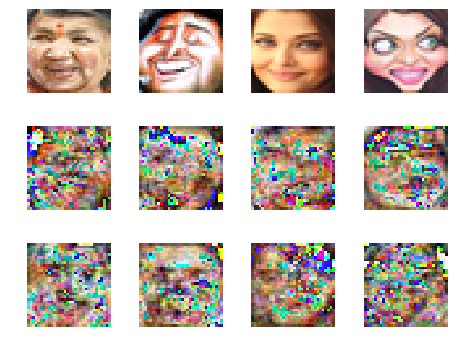

discriminator loss at step 51600:	 1.061117172241211 	-- adversarial loss at step 51600:	 1.0584633
discriminator loss at step 51700:	 1.0656366348266602 	-- adversarial loss at step 51700:	 1.0469866
discriminator loss at step 51800:	 1.058739185333252 	-- adversarial loss at step 51800:	 1.0474379
discriminator loss at step 51900:	 1.0656871795654297 	-- adversarial loss at step 51900:	 1.0702698
discriminator loss at step 52000:	 1.0580235719680786 	-- adversarial loss at step 52000:	 1.0461819


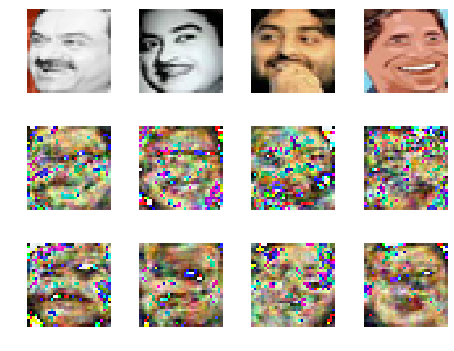

discriminator loss at step 52100:	 1.0712051391601562 	-- adversarial loss at step 52100:	 1.0168421
discriminator loss at step 52200:	 1.0732791423797607 	-- adversarial loss at step 52200:	 1.0842266
discriminator loss at step 52300:	 1.0593812465667725 	-- adversarial loss at step 52300:	 1.0631886
discriminator loss at step 52400:	 1.0662729740142822 	-- adversarial loss at step 52400:	 1.0642052
discriminator loss at step 52500:	 1.0557434558868408 	-- adversarial loss at step 52500:	 1.071295


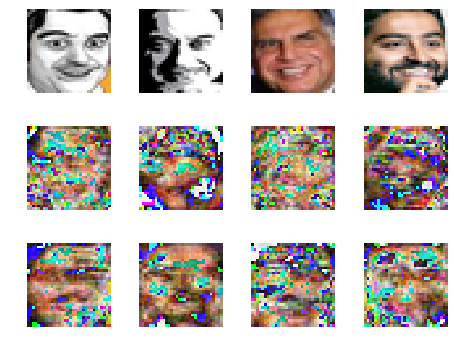

discriminator loss at step 52600:	 1.04818856716156 	-- adversarial loss at step 52600:	 1.0732951
discriminator loss at step 52700:	 1.0438748598098755 	-- adversarial loss at step 52700:	 1.0706451
discriminator loss at step 52800:	 1.0583827495574951 	-- adversarial loss at step 52800:	 1.0484358
discriminator loss at step 52900:	 1.07789945602417 	-- adversarial loss at step 52900:	 1.0490184
discriminator loss at step 53000:	 1.059501051902771 	-- adversarial loss at step 53000:	 1.0607793


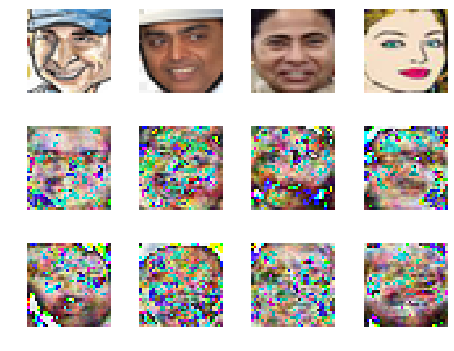

discriminator loss at step 53100:	 1.0557626485824585 	-- adversarial loss at step 53100:	 1.0794694
discriminator loss at step 53200:	 1.0716590881347656 	-- adversarial loss at step 53200:	 1.0723243
discriminator loss at step 53300:	 1.0642791986465454 	-- adversarial loss at step 53300:	 1.0646322
discriminator loss at step 53400:	 1.0497686862945557 	-- adversarial loss at step 53400:	 1.0787991
discriminator loss at step 53500:	 1.0612053871154785 	-- adversarial loss at step 53500:	 1.0731606


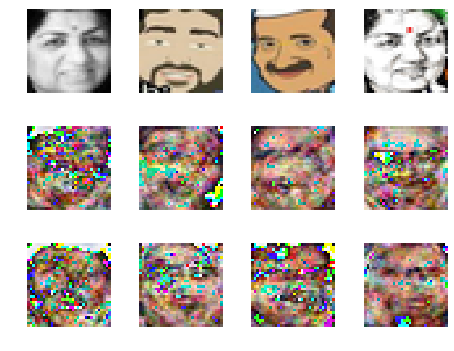

discriminator loss at step 53600:	 1.0443637371063232 	-- adversarial loss at step 53600:	 1.0873855
discriminator loss at step 53700:	 1.051306128501892 	-- adversarial loss at step 53700:	 1.0772325
discriminator loss at step 53800:	 1.0544596910476685 	-- adversarial loss at step 53800:	 1.0818901
discriminator loss at step 53900:	 1.0474388599395752 	-- adversarial loss at step 53900:	 1.0733938
discriminator loss at step 54000:	 1.0523467063903809 	-- adversarial loss at step 54000:	 1.0662004


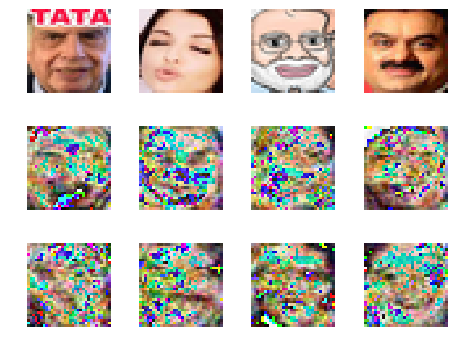

discriminator loss at step 54100:	 1.0465760231018066 	-- adversarial loss at step 54100:	 1.0736849
discriminator loss at step 54200:	 1.0642547607421875 	-- adversarial loss at step 54200:	 1.0554984
discriminator loss at step 54300:	 1.0529669523239136 	-- adversarial loss at step 54300:	 1.0816029
discriminator loss at step 54400:	 1.0601763725280762 	-- adversarial loss at step 54400:	 1.0757933
discriminator loss at step 54500:	 1.0697129964828491 	-- adversarial loss at step 54500:	 1.0676863


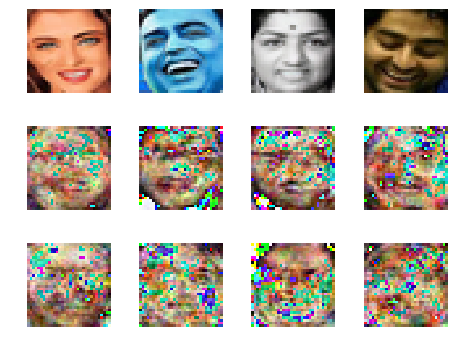

discriminator loss at step 54600:	 1.0591753721237183 	-- adversarial loss at step 54600:	 1.0663328
discriminator loss at step 54700:	 1.069091558456421 	-- adversarial loss at step 54700:	 1.082933
discriminator loss at step 54800:	 1.0638352632522583 	-- adversarial loss at step 54800:	 1.0797379
discriminator loss at step 54900:	 1.0574358701705933 	-- adversarial loss at step 54900:	 1.0817372
discriminator loss at step 55000:	 1.0540452003479004 	-- adversarial loss at step 55000:	 1.0990914


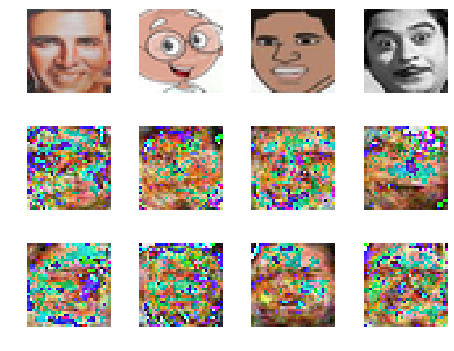

discriminator loss at step 55100:	 1.0520415306091309 	-- adversarial loss at step 55100:	 1.0852144
discriminator loss at step 55200:	 1.0535924434661865 	-- adversarial loss at step 55200:	 1.0799402
discriminator loss at step 55300:	 1.0571284294128418 	-- adversarial loss at step 55300:	 1.0755144
discriminator loss at step 55400:	 1.0594768524169922 	-- adversarial loss at step 55400:	 1.0761051
discriminator loss at step 55500:	 1.0549595355987549 	-- adversarial loss at step 55500:	 1.0788115


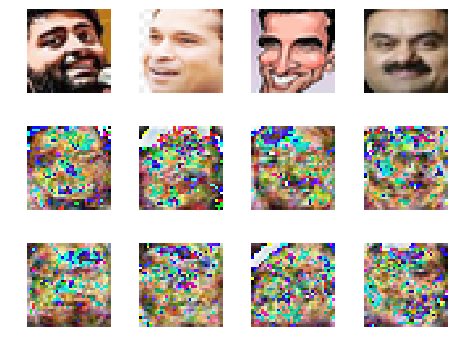

discriminator loss at step 55600:	 1.0552130937576294 	-- adversarial loss at step 55600:	 1.0668046
discriminator loss at step 55700:	 1.0503182411193848 	-- adversarial loss at step 55700:	 1.0644335
discriminator loss at step 55800:	 1.052962303161621 	-- adversarial loss at step 55800:	 1.0665513
discriminator loss at step 55900:	 1.068140983581543 	-- adversarial loss at step 55900:	 1.0792178
discriminator loss at step 56000:	 1.0554238557815552 	-- adversarial loss at step 56000:	 1.0890135


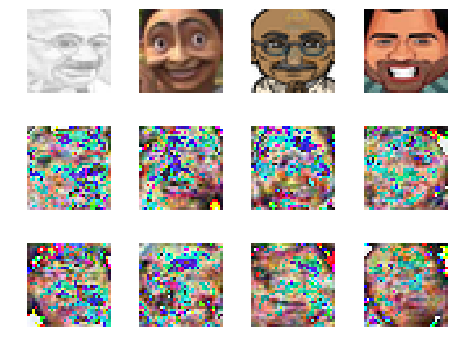

discriminator loss at step 56100:	 1.0483428239822388 	-- adversarial loss at step 56100:	 1.0931859
discriminator loss at step 56200:	 1.0665431022644043 	-- adversarial loss at step 56200:	 1.0688193
discriminator loss at step 56300:	 1.0563374757766724 	-- adversarial loss at step 56300:	 1.0837469
discriminator loss at step 56400:	 1.0494173765182495 	-- adversarial loss at step 56400:	 1.0995197
discriminator loss at step 56500:	 1.0524334907531738 	-- adversarial loss at step 56500:	 1.0933447


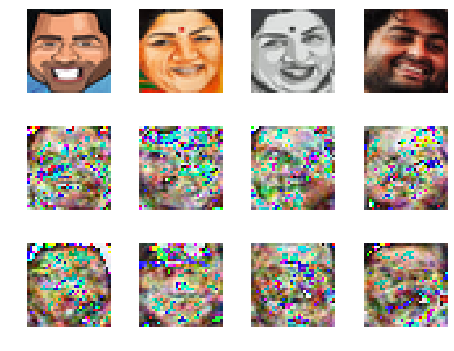

discriminator loss at step 56600:	 1.0430691242218018 	-- adversarial loss at step 56600:	 1.1337159
discriminator loss at step 56700:	 1.0624878406524658 	-- adversarial loss at step 56700:	 1.0746683
discriminator loss at step 56800:	 1.0627367496490479 	-- adversarial loss at step 56800:	 1.0770578
discriminator loss at step 56900:	 1.0673964023590088 	-- adversarial loss at step 56900:	 1.0863631
discriminator loss at step 57000:	 1.0497136116027832 	-- adversarial loss at step 57000:	 1.0726918


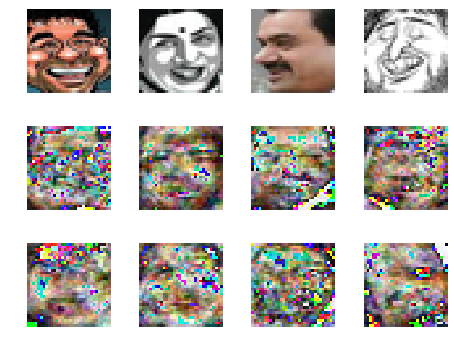

discriminator loss at step 57100:	 1.0585405826568604 	-- adversarial loss at step 57100:	 1.067251
discriminator loss at step 57200:	 1.048305869102478 	-- adversarial loss at step 57200:	 1.0808005
discriminator loss at step 57300:	 1.0542453527450562 	-- adversarial loss at step 57300:	 1.0800182
discriminator loss at step 57400:	 1.051463007926941 	-- adversarial loss at step 57400:	 1.0896462
discriminator loss at step 57500:	 1.0604274272918701 	-- adversarial loss at step 57500:	 1.0769229


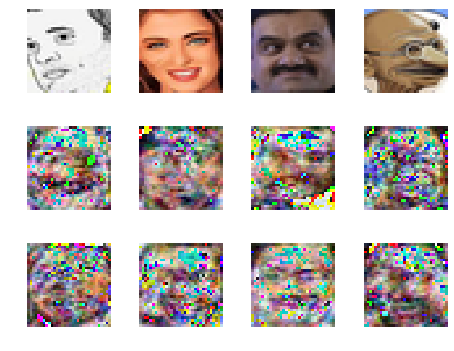

discriminator loss at step 57600:	 1.0562058687210083 	-- adversarial loss at step 57600:	 1.080586
discriminator loss at step 57700:	 1.0696022510528564 	-- adversarial loss at step 57700:	 1.0554857
discriminator loss at step 57800:	 1.0694262981414795 	-- adversarial loss at step 57800:	 1.0841135
discriminator loss at step 57900:	 1.0421984195709229 	-- adversarial loss at step 57900:	 1.0968299
discriminator loss at step 58000:	 1.0446959733963013 	-- adversarial loss at step 58000:	 1.0907867


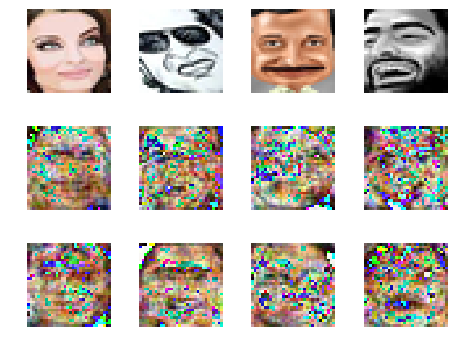

discriminator loss at step 58100:	 1.057065486907959 	-- adversarial loss at step 58100:	 1.0763904
discriminator loss at step 58200:	 1.0572757720947266 	-- adversarial loss at step 58200:	 1.0623158
discriminator loss at step 58300:	 1.0536115169525146 	-- adversarial loss at step 58300:	 1.0870407
discriminator loss at step 58400:	 1.048957347869873 	-- adversarial loss at step 58400:	 1.0779474
discriminator loss at step 58500:	 1.0460188388824463 	-- adversarial loss at step 58500:	 1.069757


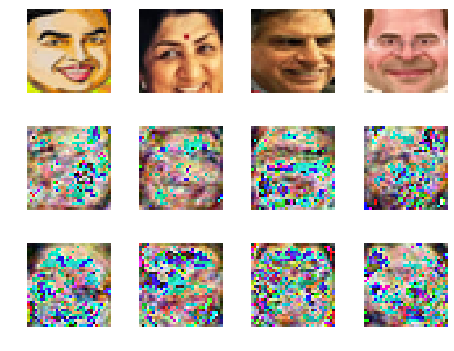

discriminator loss at step 58600:	 1.0612945556640625 	-- adversarial loss at step 58600:	 1.0861387
discriminator loss at step 58700:	 1.049657940864563 	-- adversarial loss at step 58700:	 1.0684923
discriminator loss at step 58800:	 1.061206340789795 	-- adversarial loss at step 58800:	 1.0786722
discriminator loss at step 58900:	 1.0532376766204834 	-- adversarial loss at step 58900:	 1.0936768
discriminator loss at step 59000:	 1.0463812351226807 	-- adversarial loss at step 59000:	 1.0888436


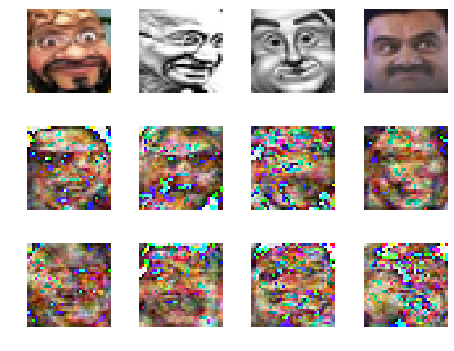

discriminator loss at step 59100:	 1.0465364456176758 	-- adversarial loss at step 59100:	 1.1290609
discriminator loss at step 59200:	 1.0621535778045654 	-- adversarial loss at step 59200:	 1.0794921
discriminator loss at step 59300:	 1.0618433952331543 	-- adversarial loss at step 59300:	 1.0888371
discriminator loss at step 59400:	 1.0727730989456177 	-- adversarial loss at step 59400:	 1.0849861
discriminator loss at step 59500:	 1.0678727626800537 	-- adversarial loss at step 59500:	 1.0375776


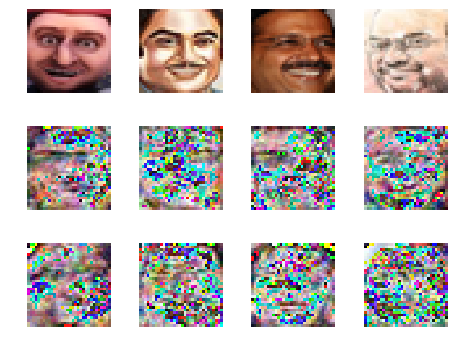

discriminator loss at step 59600:	 1.0515708923339844 	-- adversarial loss at step 59600:	 1.1007032
discriminator loss at step 59700:	 1.0665037631988525 	-- adversarial loss at step 59700:	 1.0795529
discriminator loss at step 59800:	 1.0493892431259155 	-- adversarial loss at step 59800:	 1.0822737
discriminator loss at step 59900:	 1.0601614713668823 	-- adversarial loss at step 59900:	 1.0829853
discriminator loss at step 60000:	 1.0536754131317139 	-- adversarial loss at step 60000:	 1.0863802


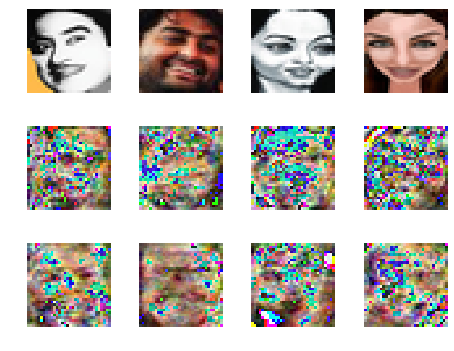

discriminator loss at step 60100:	 1.0359700918197632 	-- adversarial loss at step 60100:	 1.0993218
discriminator loss at step 60200:	 1.069885492324829 	-- adversarial loss at step 60200:	 1.0835172
discriminator loss at step 60300:	 1.0594913959503174 	-- adversarial loss at step 60300:	 1.0848494
discriminator loss at step 60400:	 1.0609207153320312 	-- adversarial loss at step 60400:	 1.1061506
discriminator loss at step 60500:	 1.0585702657699585 	-- adversarial loss at step 60500:	 1.0910968


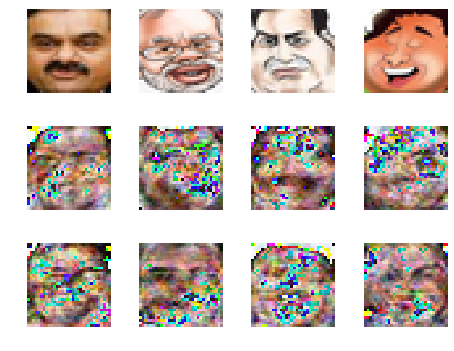

discriminator loss at step 60600:	 1.046187162399292 	-- adversarial loss at step 60600:	 1.1038455
discriminator loss at step 60700:	 1.0570662021636963 	-- adversarial loss at step 60700:	 1.0999266
discriminator loss at step 60800:	 1.0576975345611572 	-- adversarial loss at step 60800:	 1.0740944
discriminator loss at step 60900:	 1.0432796478271484 	-- adversarial loss at step 60900:	 1.1189127
discriminator loss at step 61000:	 1.0534979104995728 	-- adversarial loss at step 61000:	 1.09693


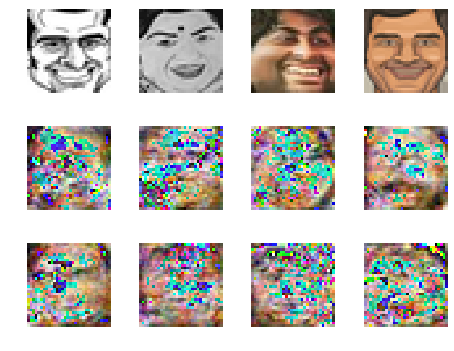

discriminator loss at step 61100:	 1.0563594102859497 	-- adversarial loss at step 61100:	 1.071003
discriminator loss at step 61200:	 1.0689858198165894 	-- adversarial loss at step 61200:	 1.0713233
discriminator loss at step 61300:	 1.0681138038635254 	-- adversarial loss at step 61300:	 1.0730805
discriminator loss at step 61400:	 1.057536005973816 	-- adversarial loss at step 61400:	 1.0715832
discriminator loss at step 61500:	 1.046933650970459 	-- adversarial loss at step 61500:	 1.0818064


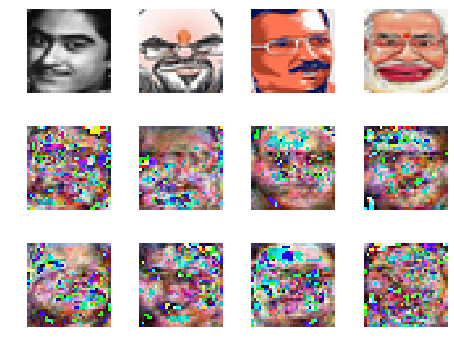

discriminator loss at step 61600:	 1.062636137008667 	-- adversarial loss at step 61600:	 1.0867912
discriminator loss at step 61700:	 1.060591220855713 	-- adversarial loss at step 61700:	 1.0697931
discriminator loss at step 61800:	 1.0477607250213623 	-- adversarial loss at step 61800:	 1.0866816
discriminator loss at step 61900:	 1.051079273223877 	-- adversarial loss at step 61900:	 1.0652983
discriminator loss at step 62000:	 1.054187536239624 	-- adversarial loss at step 62000:	 1.065619


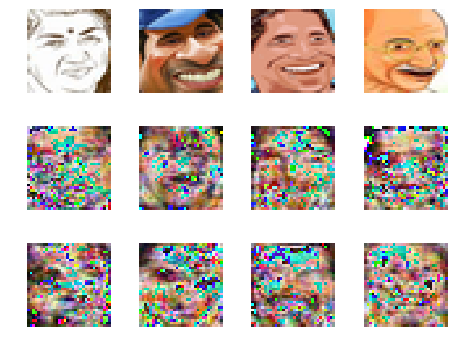

discriminator loss at step 62100:	 1.0519325733184814 	-- adversarial loss at step 62100:	 1.0710726
discriminator loss at step 62200:	 1.0629807710647583 	-- adversarial loss at step 62200:	 1.0724971
discriminator loss at step 62300:	 1.0635634660720825 	-- adversarial loss at step 62300:	 1.0734451
discriminator loss at step 62400:	 1.0589865446090698 	-- adversarial loss at step 62400:	 1.0813785
discriminator loss at step 62500:	 1.0610935688018799 	-- adversarial loss at step 62500:	 1.0854455


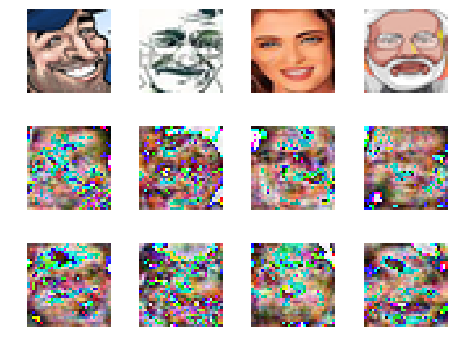

discriminator loss at step 62600:	 1.0378496646881104 	-- adversarial loss at step 62600:	 1.0924153
discriminator loss at step 62700:	 1.052924633026123 	-- adversarial loss at step 62700:	 1.0852345
discriminator loss at step 62800:	 1.049282193183899 	-- adversarial loss at step 62800:	 1.08986
discriminator loss at step 62900:	 1.051846981048584 	-- adversarial loss at step 62900:	 1.0739186
discriminator loss at step 63000:	 1.0506600141525269 	-- adversarial loss at step 63000:	 1.100795


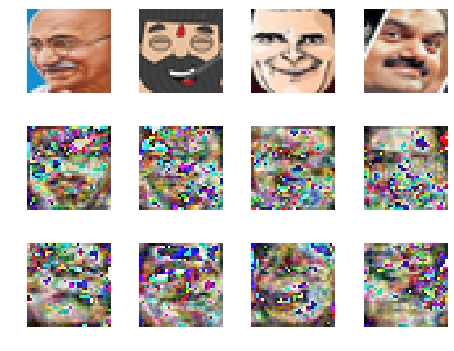

discriminator loss at step 63100:	 1.0379256010055542 	-- adversarial loss at step 63100:	 1.0473392
discriminator loss at step 63200:	 1.0796550512313843 	-- adversarial loss at step 63200:	 1.0741079
discriminator loss at step 63300:	 1.067556381225586 	-- adversarial loss at step 63300:	 1.0656378
discriminator loss at step 63400:	 1.0489861965179443 	-- adversarial loss at step 63400:	 1.0818045
discriminator loss at step 63500:	 1.0530121326446533 	-- adversarial loss at step 63500:	 1.0847208


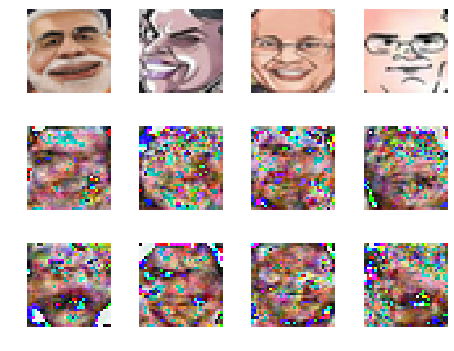

discriminator loss at step 63600:	 1.0542399883270264 	-- adversarial loss at step 63600:	 1.0835164
discriminator loss at step 63700:	 1.0594971179962158 	-- adversarial loss at step 63700:	 1.0843469
discriminator loss at step 63800:	 1.0572509765625 	-- adversarial loss at step 63800:	 1.0819947
discriminator loss at step 63900:	 1.0515427589416504 	-- adversarial loss at step 63900:	 1.0712963
discriminator loss at step 64000:	 1.0573251247406006 	-- adversarial loss at step 64000:	 1.075118


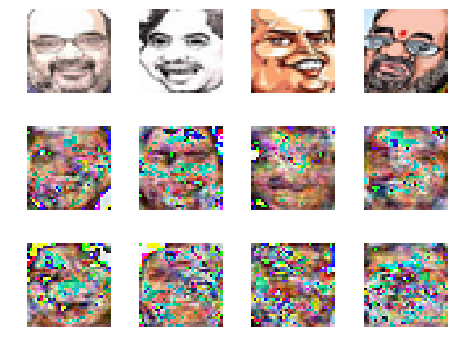

discriminator loss at step 64100:	 1.0585271120071411 	-- adversarial loss at step 64100:	 1.0804679
discriminator loss at step 64200:	 1.0519715547561646 	-- adversarial loss at step 64200:	 1.0918988
discriminator loss at step 64300:	 1.0591132640838623 	-- adversarial loss at step 64300:	 1.0799756
discriminator loss at step 64400:	 1.053179383277893 	-- adversarial loss at step 64400:	 1.0709517
discriminator loss at step 64500:	 1.0479967594146729 	-- adversarial loss at step 64500:	 1.0766091


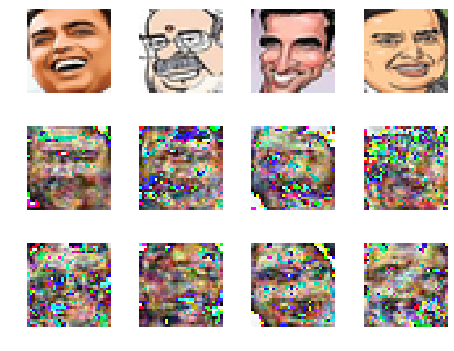

discriminator loss at step 64600:	 1.0630961656570435 	-- adversarial loss at step 64600:	 1.0751159
discriminator loss at step 64700:	 1.0583059787750244 	-- adversarial loss at step 64700:	 1.0706084
discriminator loss at step 64800:	 1.0488297939300537 	-- adversarial loss at step 64800:	 1.0847647
discriminator loss at step 64900:	 1.0614635944366455 	-- adversarial loss at step 64900:	 1.0734862
discriminator loss at step 65000:	 1.0525319576263428 	-- adversarial loss at step 65000:	 1.0833883


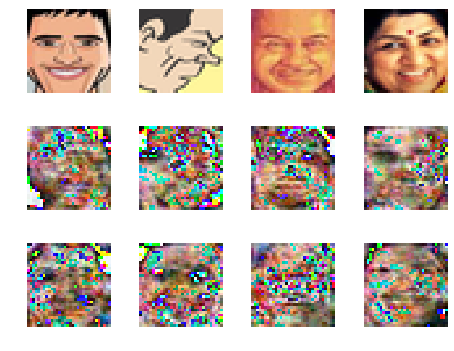

discriminator loss at step 65100:	 1.0634195804595947 	-- adversarial loss at step 65100:	 1.087035
discriminator loss at step 65200:	 1.056074619293213 	-- adversarial loss at step 65200:	 1.0886772
discriminator loss at step 65300:	 1.0614362955093384 	-- adversarial loss at step 65300:	 1.0865283
discriminator loss at step 65400:	 1.0440016984939575 	-- adversarial loss at step 65400:	 1.1026917
discriminator loss at step 65500:	 1.0495117902755737 	-- adversarial loss at step 65500:	 1.0886368


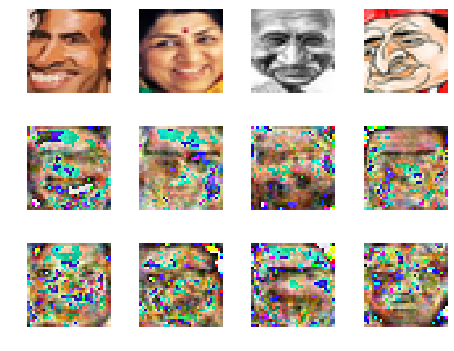

discriminator loss at step 65600:	 1.0545357465744019 	-- adversarial loss at step 65600:	 1.0871074
discriminator loss at step 65700:	 1.0521835088729858 	-- adversarial loss at step 65700:	 1.0666169
discriminator loss at step 65800:	 1.064328670501709 	-- adversarial loss at step 65800:	 1.0928329
discriminator loss at step 65900:	 1.053762435913086 	-- adversarial loss at step 65900:	 1.0910513
discriminator loss at step 66000:	 1.0534191131591797 	-- adversarial loss at step 66000:	 1.0885344


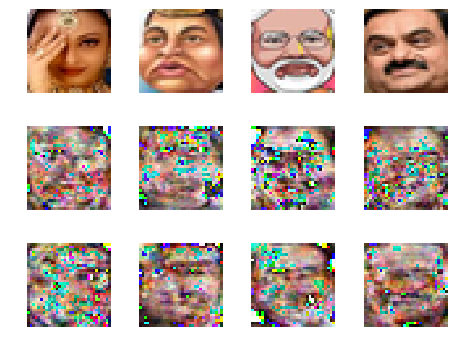

discriminator loss at step 66100:	 1.0709024667739868 	-- adversarial loss at step 66100:	 1.0250626
discriminator loss at step 66200:	 1.0571926832199097 	-- adversarial loss at step 66200:	 1.0834157
discriminator loss at step 66300:	 1.071001410484314 	-- adversarial loss at step 66300:	 1.0744063
discriminator loss at step 66400:	 1.0654128789901733 	-- adversarial loss at step 66400:	 1.086904
discriminator loss at step 66500:	 1.0649633407592773 	-- adversarial loss at step 66500:	 1.060718


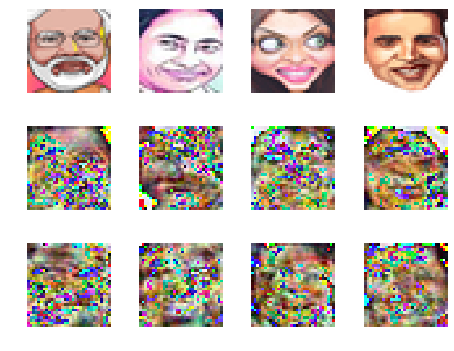

discriminator loss at step 66600:	 1.081234097480774 	-- adversarial loss at step 66600:	 1.0708253
discriminator loss at step 66700:	 1.0616568326950073 	-- adversarial loss at step 66700:	 1.0759778
discriminator loss at step 66800:	 1.0752944946289062 	-- adversarial loss at step 66800:	 1.1008551
discriminator loss at step 66900:	 1.0639493465423584 	-- adversarial loss at step 66900:	 1.0650725
discriminator loss at step 67000:	 1.0618689060211182 	-- adversarial loss at step 67000:	 1.0646961


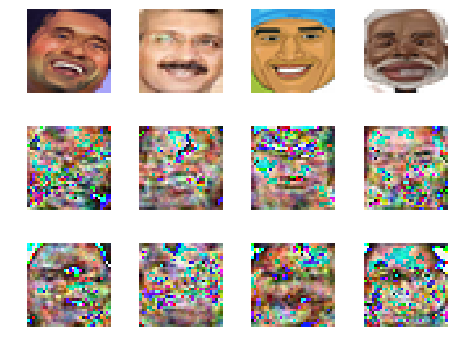

discriminator loss at step 67100:	 1.044999599456787 	-- adversarial loss at step 67100:	 1.0901287
discriminator loss at step 67200:	 1.0485776662826538 	-- adversarial loss at step 67200:	 1.100167
discriminator loss at step 67300:	 1.0540688037872314 	-- adversarial loss at step 67300:	 1.0544109
discriminator loss at step 67400:	 1.0615718364715576 	-- adversarial loss at step 67400:	 1.0437306
discriminator loss at step 67500:	 1.0487481355667114 	-- adversarial loss at step 67500:	 1.0717335


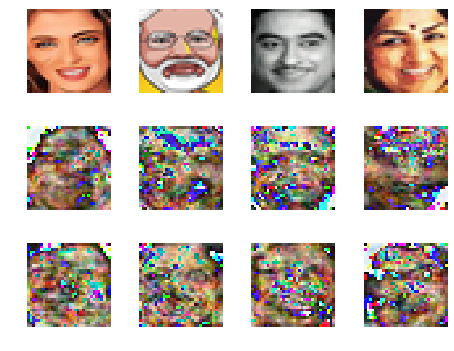

discriminator loss at step 67600:	 1.067394733428955 	-- adversarial loss at step 67600:	 1.0711915
discriminator loss at step 67700:	 1.0573773384094238 	-- adversarial loss at step 67700:	 1.0458038
discriminator loss at step 67800:	 1.057708501815796 	-- adversarial loss at step 67800:	 1.0639347
discriminator loss at step 67900:	 1.066664695739746 	-- adversarial loss at step 67900:	 1.0565009
discriminator loss at step 68000:	 1.0560088157653809 	-- adversarial loss at step 68000:	 1.0520627


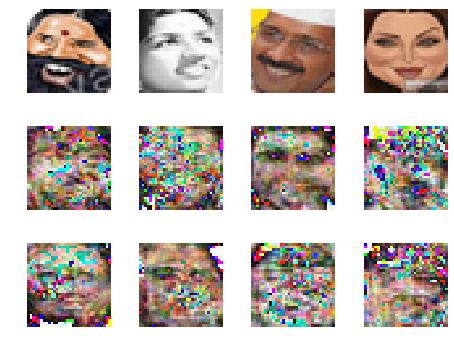

discriminator loss at step 68100:	 1.0602302551269531 	-- adversarial loss at step 68100:	 1.0554584
discriminator loss at step 68200:	 1.0564368963241577 	-- adversarial loss at step 68200:	 1.0655236
discriminator loss at step 68300:	 1.0513079166412354 	-- adversarial loss at step 68300:	 1.0572492
discriminator loss at step 68400:	 1.061931848526001 	-- adversarial loss at step 68400:	 1.0488539
discriminator loss at step 68500:	 1.0539193153381348 	-- adversarial loss at step 68500:	 1.074546


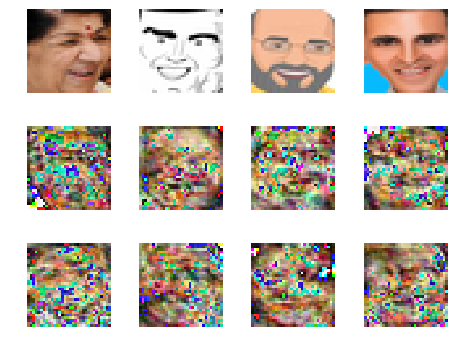

discriminator loss at step 68600:	 1.0493062734603882 	-- adversarial loss at step 68600:	 1.0632012
discriminator loss at step 68700:	 1.0524230003356934 	-- adversarial loss at step 68700:	 1.0745527
discriminator loss at step 68800:	 1.0592360496520996 	-- adversarial loss at step 68800:	 1.0579768
discriminator loss at step 68900:	 1.0539101362228394 	-- adversarial loss at step 68900:	 1.0639054
discriminator loss at step 69000:	 1.050858736038208 	-- adversarial loss at step 69000:	 1.082242


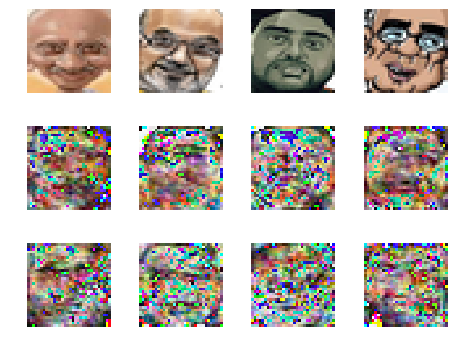

discriminator loss at step 69100:	 1.0640619993209839 	-- adversarial loss at step 69100:	 1.07965
discriminator loss at step 69200:	 1.0676956176757812 	-- adversarial loss at step 69200:	 1.0698656
discriminator loss at step 69300:	 1.0695300102233887 	-- adversarial loss at step 69300:	 1.0661857
discriminator loss at step 69400:	 1.0513156652450562 	-- adversarial loss at step 69400:	 1.0623316
discriminator loss at step 69500:	 1.0526173114776611 	-- adversarial loss at step 69500:	 1.0749793


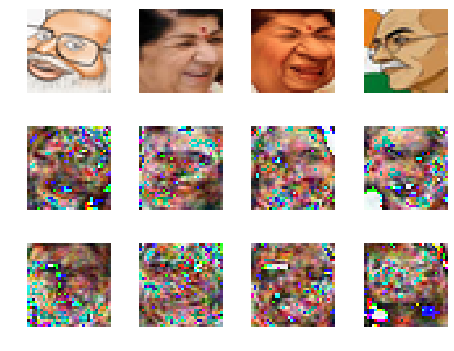

discriminator loss at step 69600:	 1.062549114227295 	-- adversarial loss at step 69600:	 1.0383191
discriminator loss at step 69700:	 1.0575147867202759 	-- adversarial loss at step 69700:	 1.07213
discriminator loss at step 69800:	 1.06758451461792 	-- adversarial loss at step 69800:	 1.0635649
discriminator loss at step 69900:	 1.0407469272613525 	-- adversarial loss at step 69900:	 1.0760157
discriminator loss at step 70000:	 1.0533673763275146 	-- adversarial loss at step 70000:	 1.044628


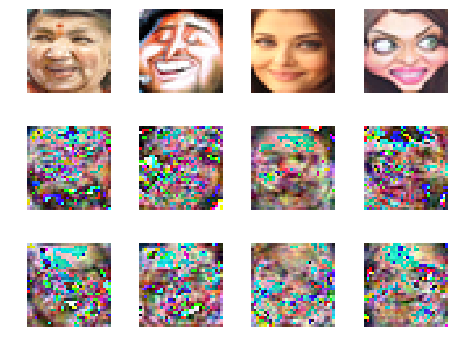

discriminator loss at step 70100:	 1.0695252418518066 	-- adversarial loss at step 70100:	 1.0676985
discriminator loss at step 70200:	 1.0652515888214111 	-- adversarial loss at step 70200:	 1.0463057
discriminator loss at step 70300:	 1.0585081577301025 	-- adversarial loss at step 70300:	 1.0561996
discriminator loss at step 70400:	 1.0513185262680054 	-- adversarial loss at step 70400:	 1.0684108
discriminator loss at step 70500:	 1.0525875091552734 	-- adversarial loss at step 70500:	 1.0508353


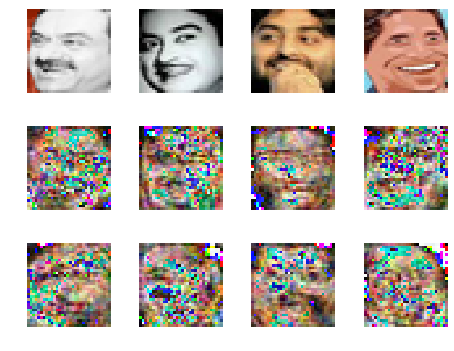

discriminator loss at step 70600:	 1.0668580532073975 	-- adversarial loss at step 70600:	 1.0442193
discriminator loss at step 70700:	 1.0605498552322388 	-- adversarial loss at step 70700:	 1.0683565
discriminator loss at step 70800:	 1.066235065460205 	-- adversarial loss at step 70800:	 1.0415367
discriminator loss at step 70900:	 1.0687341690063477 	-- adversarial loss at step 70900:	 1.0552561
discriminator loss at step 71000:	 1.0619490146636963 	-- adversarial loss at step 71000:	 1.0231369


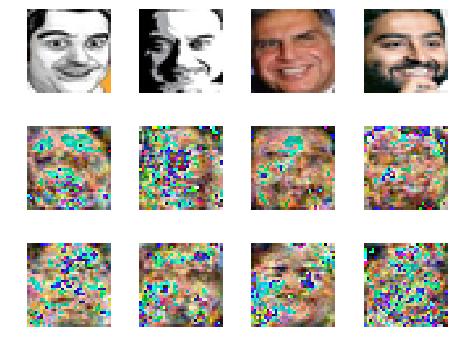

discriminator loss at step 71100:	 1.0638576745986938 	-- adversarial loss at step 71100:	 1.0609014
discriminator loss at step 71200:	 1.0571372509002686 	-- adversarial loss at step 71200:	 1.040937
discriminator loss at step 71300:	 1.0793159008026123 	-- adversarial loss at step 71300:	 1.040791
discriminator loss at step 71400:	 1.0695891380310059 	-- adversarial loss at step 71400:	 1.0529118
discriminator loss at step 71500:	 1.0956065654754639 	-- adversarial loss at step 71500:	 1.0309049


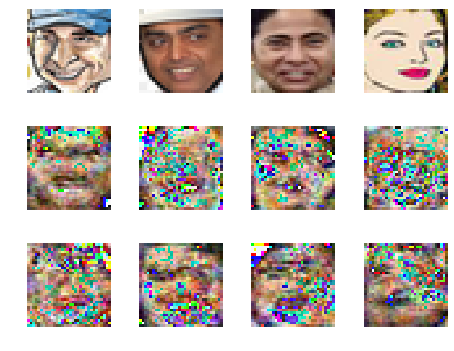

discriminator loss at step 71600:	 1.0579802989959717 	-- adversarial loss at step 71600:	 1.0648592
discriminator loss at step 71700:	 1.0738273859024048 	-- adversarial loss at step 71700:	 1.0398095
discriminator loss at step 71800:	 1.0457689762115479 	-- adversarial loss at step 71800:	 1.0415703
discriminator loss at step 71900:	 1.0597949028015137 	-- adversarial loss at step 71900:	 1.0607401
discriminator loss at step 72000:	 1.0567281246185303 	-- adversarial loss at step 72000:	 1.041088


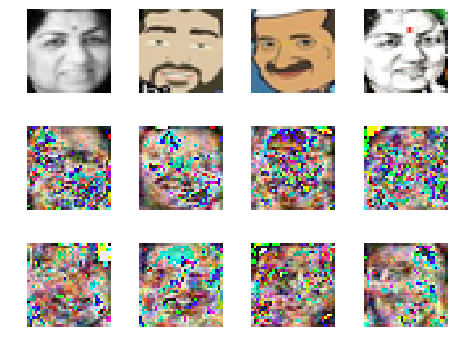

discriminator loss at step 72100:	 1.0605194568634033 	-- adversarial loss at step 72100:	 1.0574396
discriminator loss at step 72200:	 1.0540204048156738 	-- adversarial loss at step 72200:	 1.041764
discriminator loss at step 72300:	 1.0570173263549805 	-- adversarial loss at step 72300:	 1.0521884
discriminator loss at step 72400:	 1.0530662536621094 	-- adversarial loss at step 72400:	 1.0522935
discriminator loss at step 72500:	 1.0632052421569824 	-- adversarial loss at step 72500:	 1.0639486


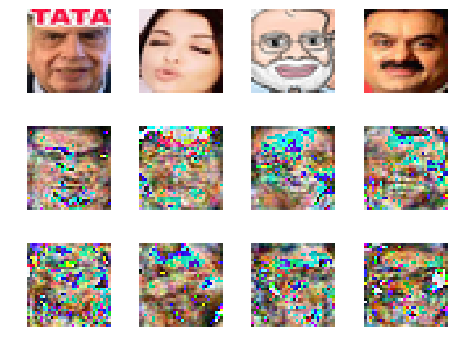

discriminator loss at step 72600:	 1.058779001235962 	-- adversarial loss at step 72600:	 1.062799
discriminator loss at step 72700:	 1.0569431781768799 	-- adversarial loss at step 72700:	 1.066891
discriminator loss at step 72800:	 1.0604419708251953 	-- adversarial loss at step 72800:	 1.0480365
discriminator loss at step 72900:	 1.065915822982788 	-- adversarial loss at step 72900:	 1.0359615
discriminator loss at step 73000:	 1.0706175565719604 	-- adversarial loss at step 73000:	 1.048976


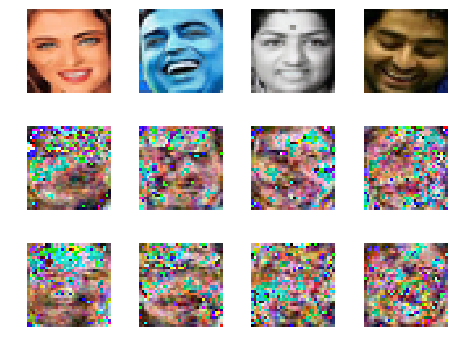

discriminator loss at step 73100:	 1.0717092752456665 	-- adversarial loss at step 73100:	 1.0472221
discriminator loss at step 73200:	 1.062233328819275 	-- adversarial loss at step 73200:	 1.0601025
discriminator loss at step 73300:	 1.0701243877410889 	-- adversarial loss at step 73300:	 1.0575132
discriminator loss at step 73400:	 1.0625624656677246 	-- adversarial loss at step 73400:	 1.0771711
discriminator loss at step 73500:	 1.05323326587677 	-- adversarial loss at step 73500:	 1.0580212


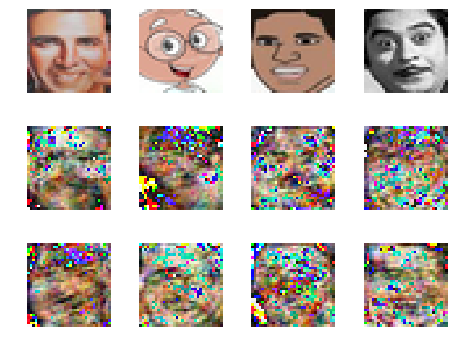

discriminator loss at step 73600:	 1.0534703731536865 	-- adversarial loss at step 73600:	 1.0834012
discriminator loss at step 73700:	 1.0486221313476562 	-- adversarial loss at step 73700:	 1.0331807
discriminator loss at step 73800:	 1.0647413730621338 	-- adversarial loss at step 73800:	 1.0539696
discriminator loss at step 73900:	 1.0563750267028809 	-- adversarial loss at step 73900:	 1.0538794
discriminator loss at step 74000:	 1.0601567029953003 	-- adversarial loss at step 74000:	 1.0410748


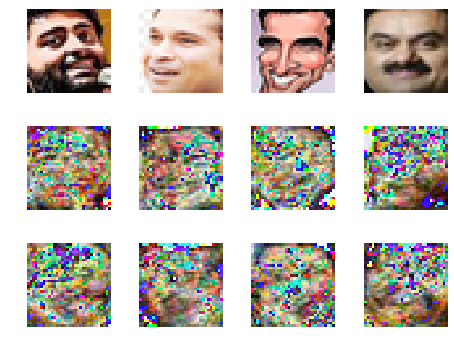

discriminator loss at step 74100:	 1.0605422258377075 	-- adversarial loss at step 74100:	 1.0238312
discriminator loss at step 74200:	 1.0705883502960205 	-- adversarial loss at step 74200:	 1.0249741
discriminator loss at step 74300:	 1.0705698728561401 	-- adversarial loss at step 74300:	 1.03985
discriminator loss at step 74400:	 1.0761997699737549 	-- adversarial loss at step 74400:	 1.0441363
discriminator loss at step 74500:	 1.085391640663147 	-- adversarial loss at step 74500:	 1.0223207


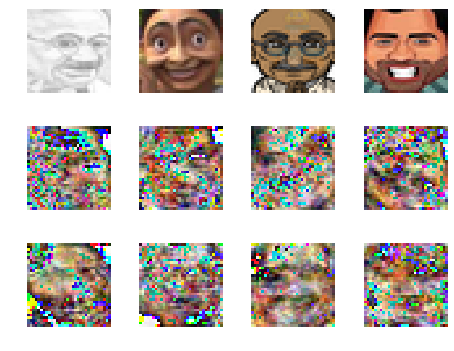

discriminator loss at step 74600:	 1.0619211196899414 	-- adversarial loss at step 74600:	 1.0295074
discriminator loss at step 74700:	 1.0630030632019043 	-- adversarial loss at step 74700:	 1.0032439
discriminator loss at step 74800:	 1.0587236881256104 	-- adversarial loss at step 74800:	 1.0467064
discriminator loss at step 74900:	 1.0599009990692139 	-- adversarial loss at step 74900:	 1.069263
discriminator loss at step 75000:	 1.1133235692977905 	-- adversarial loss at step 75000:	 1.0061438


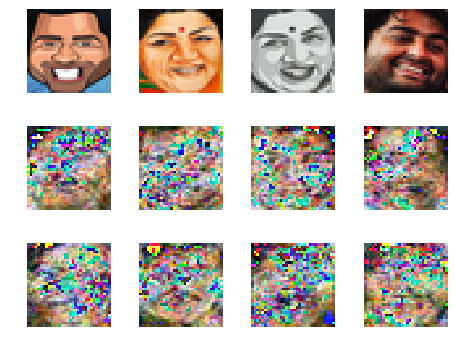

discriminator loss at step 75100:	 1.0487937927246094 	-- adversarial loss at step 75100:	 1.0407703
discriminator loss at step 75200:	 1.0767426490783691 	-- adversarial loss at step 75200:	 1.0108624
discriminator loss at step 75300:	 1.0915746688842773 	-- adversarial loss at step 75300:	 0.97519255
discriminator loss at step 75400:	 1.0511982440948486 	-- adversarial loss at step 75400:	 1.0188379
discriminator loss at step 75500:	 1.060331106185913 	-- adversarial loss at step 75500:	 0.98583585


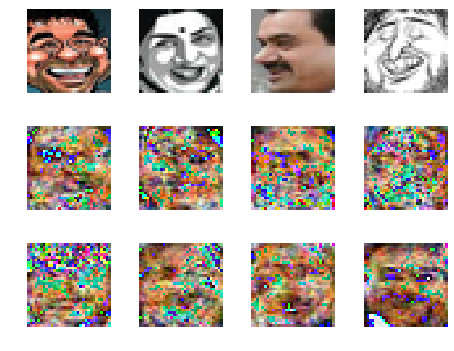

discriminator loss at step 75600:	 1.072331190109253 	-- adversarial loss at step 75600:	 1.0155118
discriminator loss at step 75700:	 1.0267226696014404 	-- adversarial loss at step 75700:	 1.0131199
discriminator loss at step 75800:	 1.0688191652297974 	-- adversarial loss at step 75800:	 1.0152931
discriminator loss at step 75900:	 0.9660519361495972 	-- adversarial loss at step 75900:	 1.0841687
discriminator loss at step 76000:	 1.0632305145263672 	-- adversarial loss at step 76000:	 0.99106115


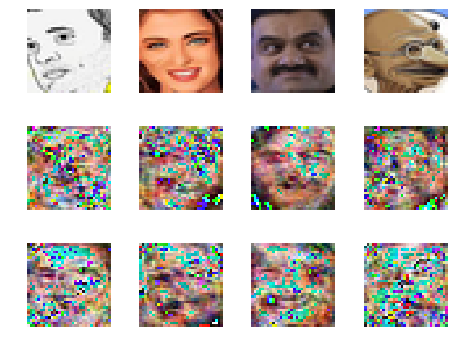

discriminator loss at step 76100:	 1.0522403717041016 	-- adversarial loss at step 76100:	 1.0357511
discriminator loss at step 76200:	 1.0490607023239136 	-- adversarial loss at step 76200:	 0.9599485
discriminator loss at step 76300:	 1.0788737535476685 	-- adversarial loss at step 76300:	 0.98731154
discriminator loss at step 76400:	 1.070879578590393 	-- adversarial loss at step 76400:	 1.0156242
discriminator loss at step 76500:	 1.0524739027023315 	-- adversarial loss at step 76500:	 1.0363442


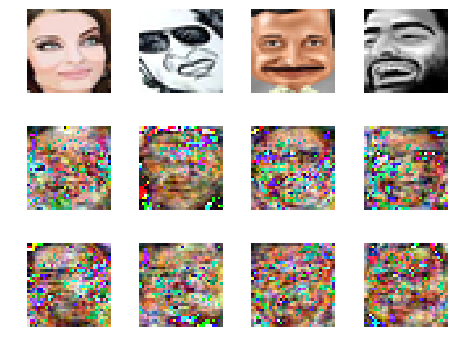

discriminator loss at step 76600:	 1.071210503578186 	-- adversarial loss at step 76600:	 1.0294123
discriminator loss at step 76700:	 1.091268539428711 	-- adversarial loss at step 76700:	 1.0368065
discriminator loss at step 76800:	 1.0867652893066406 	-- adversarial loss at step 76800:	 1.0373728
discriminator loss at step 76900:	 1.0675249099731445 	-- adversarial loss at step 76900:	 1.0095626
discriminator loss at step 77000:	 1.0548360347747803 	-- adversarial loss at step 77000:	 0.98041487


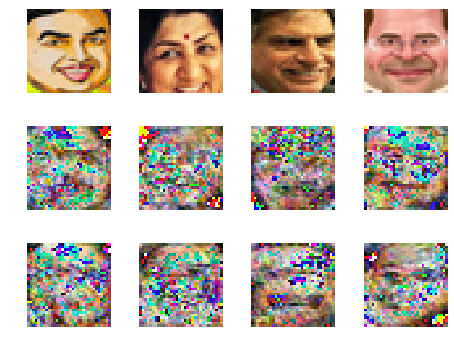

discriminator loss at step 77100:	 1.062730312347412 	-- adversarial loss at step 77100:	 1.0198421
discriminator loss at step 77200:	 1.058722734451294 	-- adversarial loss at step 77200:	 0.9821738
discriminator loss at step 77300:	 1.0542508363723755 	-- adversarial loss at step 77300:	 1.0413868
discriminator loss at step 77400:	 1.0857282876968384 	-- adversarial loss at step 77400:	 1.0081929
discriminator loss at step 77500:	 1.0562541484832764 	-- adversarial loss at step 77500:	 1.0210173


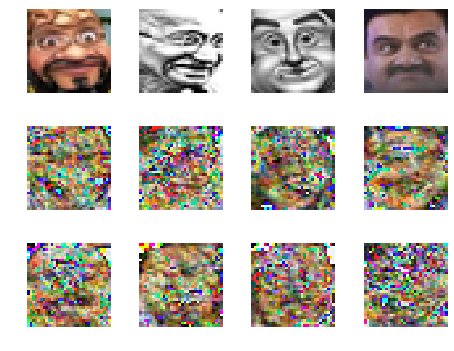

discriminator loss at step 77600:	 1.0618996620178223 	-- adversarial loss at step 77600:	 1.0216534
discriminator loss at step 77700:	 1.0477664470672607 	-- adversarial loss at step 77700:	 1.0025604
discriminator loss at step 77800:	 1.0668946504592896 	-- adversarial loss at step 77800:	 1.0322723
discriminator loss at step 77900:	 1.0634093284606934 	-- adversarial loss at step 77900:	 1.0452
discriminator loss at step 78000:	 1.0728284120559692 	-- adversarial loss at step 78000:	 1.0278456


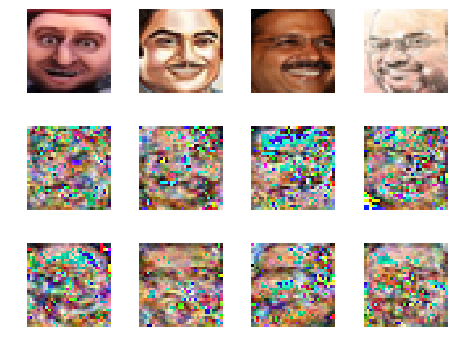

discriminator loss at step 78100:	 1.070296049118042 	-- adversarial loss at step 78100:	 1.0416231
discriminator loss at step 78200:	 1.0545508861541748 	-- adversarial loss at step 78200:	 1.0004337
discriminator loss at step 78300:	 1.0437023639678955 	-- adversarial loss at step 78300:	 1.0467343
discriminator loss at step 78400:	 1.059399127960205 	-- adversarial loss at step 78400:	 1.0650914
discriminator loss at step 78500:	 1.0679192543029785 	-- adversarial loss at step 78500:	 0.972866


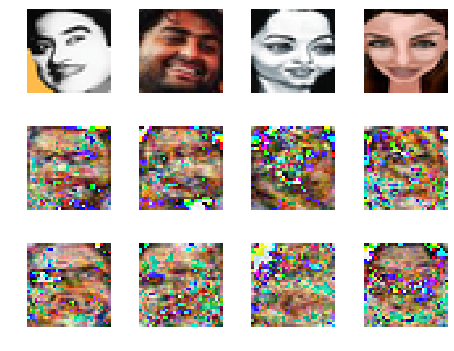

discriminator loss at step 78600:	 1.0312271118164062 	-- adversarial loss at step 78600:	 1.0205344
discriminator loss at step 78700:	 1.0684585571289062 	-- adversarial loss at step 78700:	 1.0242994
discriminator loss at step 78800:	 1.0582561492919922 	-- adversarial loss at step 78800:	 1.043356
discriminator loss at step 78900:	 1.0751456022262573 	-- adversarial loss at step 78900:	 1.0477288
discriminator loss at step 79000:	 1.0684049129486084 	-- adversarial loss at step 79000:	 1.0449324


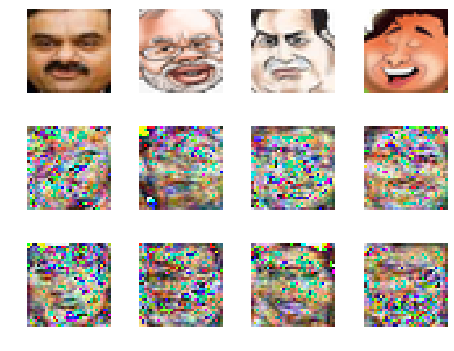

discriminator loss at step 79100:	 1.0350854396820068 	-- adversarial loss at step 79100:	 1.009774
discriminator loss at step 79200:	 1.0456129312515259 	-- adversarial loss at step 79200:	 1.0148567
discriminator loss at step 79300:	 1.0703604221343994 	-- adversarial loss at step 79300:	 1.0358036
discriminator loss at step 79400:	 1.048673391342163 	-- adversarial loss at step 79400:	 1.0324546
discriminator loss at step 79500:	 1.0677961111068726 	-- adversarial loss at step 79500:	 1.0398337


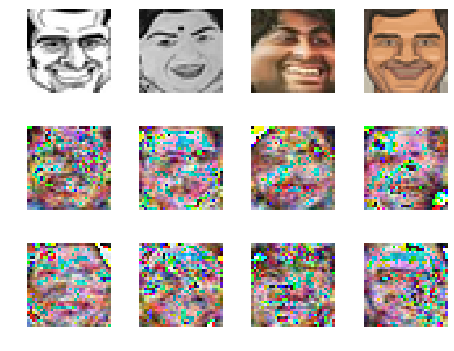

discriminator loss at step 79600:	 1.0657062530517578 	-- adversarial loss at step 79600:	 1.0345477
discriminator loss at step 79700:	 1.0809473991394043 	-- adversarial loss at step 79700:	 1.039732
discriminator loss at step 79800:	 1.0617117881774902 	-- adversarial loss at step 79800:	 0.9927152
discriminator loss at step 79900:	 1.0706264972686768 	-- adversarial loss at step 79900:	 0.9983878
discriminator loss at step 80000:	 1.0780858993530273 	-- adversarial loss at step 80000:	 1.0175204


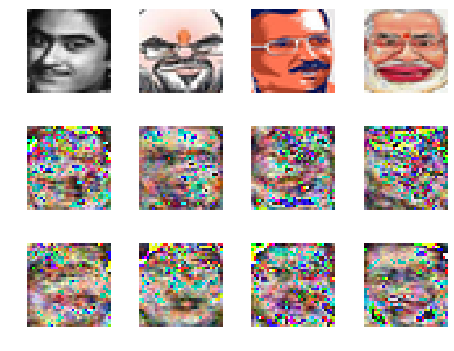

discriminator loss at step 80100:	 1.0538862943649292 	-- adversarial loss at step 80100:	 1.0366653
discriminator loss at step 80200:	 1.1137640476226807 	-- adversarial loss at step 80200:	 0.99420893
discriminator loss at step 80300:	 1.0496374368667603 	-- adversarial loss at step 80300:	 1.0130147
discriminator loss at step 80400:	 1.0937862396240234 	-- adversarial loss at step 80400:	 0.999128
discriminator loss at step 80500:	 1.0524016618728638 	-- adversarial loss at step 80500:	 1.0075793


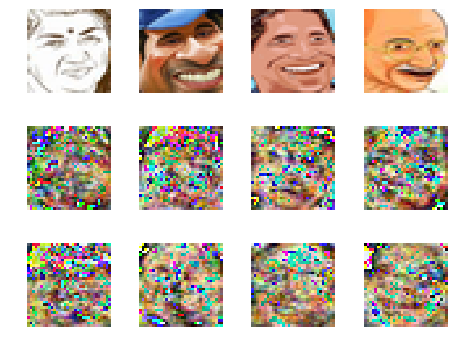

discriminator loss at step 80600:	 1.1205693483352661 	-- adversarial loss at step 80600:	 0.9975693
discriminator loss at step 80700:	 1.0684528350830078 	-- adversarial loss at step 80700:	 1.0551503
discriminator loss at step 80800:	 1.0584723949432373 	-- adversarial loss at step 80800:	 1.0186434
discriminator loss at step 80900:	 1.061783790588379 	-- adversarial loss at step 80900:	 1.0046217
discriminator loss at step 81000:	 1.0581026077270508 	-- adversarial loss at step 81000:	 1.0328782


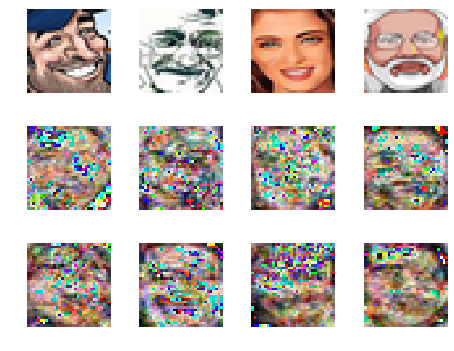

discriminator loss at step 81100:	 1.0499958992004395 	-- adversarial loss at step 81100:	 1.0506374
discriminator loss at step 81200:	 1.057661771774292 	-- adversarial loss at step 81200:	 1.078113
discriminator loss at step 81300:	 1.048771858215332 	-- adversarial loss at step 81300:	 1.050671
discriminator loss at step 81400:	 1.0697736740112305 	-- adversarial loss at step 81400:	 1.0150898
discriminator loss at step 81500:	 1.0620228052139282 	-- adversarial loss at step 81500:	 1.0121481


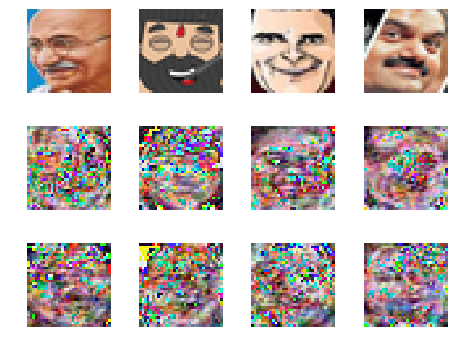

discriminator loss at step 81600:	 1.0710761547088623 	-- adversarial loss at step 81600:	 1.0257795
discriminator loss at step 81700:	 1.0749669075012207 	-- adversarial loss at step 81700:	 1.040419
discriminator loss at step 81800:	 1.0826588869094849 	-- adversarial loss at step 81800:	 1.0233057
discriminator loss at step 81900:	 1.0655925273895264 	-- adversarial loss at step 81900:	 1.0335398
discriminator loss at step 82000:	 1.0569909811019897 	-- adversarial loss at step 82000:	 1.0714673


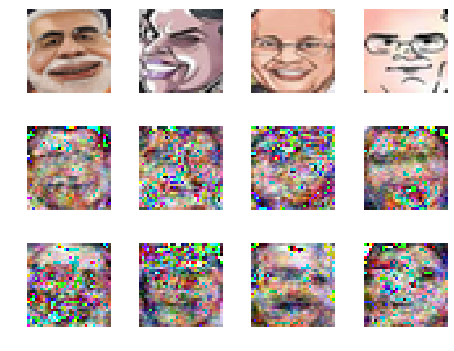

discriminator loss at step 82100:	 1.0747642517089844 	-- adversarial loss at step 82100:	 1.0226965
discriminator loss at step 82200:	 1.0584039688110352 	-- adversarial loss at step 82200:	 1.0379465
discriminator loss at step 82300:	 1.0656471252441406 	-- adversarial loss at step 82300:	 1.0650358
discriminator loss at step 82400:	 1.0620982646942139 	-- adversarial loss at step 82400:	 1.0456173
discriminator loss at step 82500:	 1.0568714141845703 	-- adversarial loss at step 82500:	 1.0110226


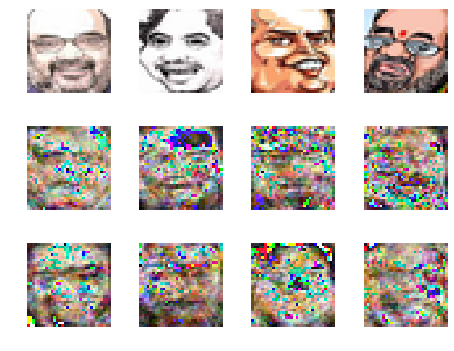

discriminator loss at step 82600:	 1.0469491481781006 	-- adversarial loss at step 82600:	 1.0256636
discriminator loss at step 82700:	 1.044270396232605 	-- adversarial loss at step 82700:	 1.0558338
discriminator loss at step 82800:	 1.0619142055511475 	-- adversarial loss at step 82800:	 1.0518286
discriminator loss at step 82900:	 1.0609169006347656 	-- adversarial loss at step 82900:	 1.0309861
discriminator loss at step 83000:	 1.0504895448684692 	-- adversarial loss at step 83000:	 1.0842304


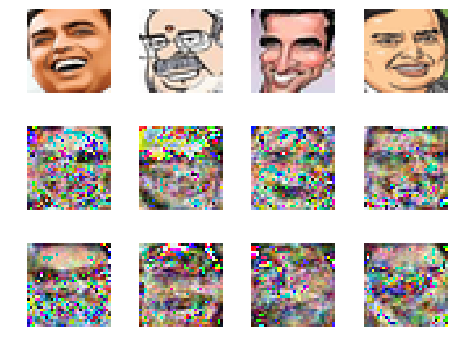

discriminator loss at step 83100:	 1.0368223190307617 	-- adversarial loss at step 83100:	 1.0214267
discriminator loss at step 83200:	 1.0361602306365967 	-- adversarial loss at step 83200:	 1.0469791
discriminator loss at step 83300:	 1.0819977521896362 	-- adversarial loss at step 83300:	 1.0474432
discriminator loss at step 83400:	 1.1231625080108643 	-- adversarial loss at step 83400:	 1.0063686
discriminator loss at step 83500:	 1.0793039798736572 	-- adversarial loss at step 83500:	 1.0162897


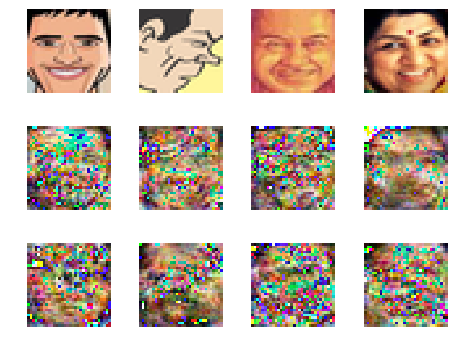

discriminator loss at step 83600:	 1.0711791515350342 	-- adversarial loss at step 83600:	 1.0396501
discriminator loss at step 83700:	 1.0538620948791504 	-- adversarial loss at step 83700:	 1.053729
discriminator loss at step 83800:	 1.0605242252349854 	-- adversarial loss at step 83800:	 1.0316558
discriminator loss at step 83900:	 1.0741195678710938 	-- adversarial loss at step 83900:	 1.0353569
discriminator loss at step 84000:	 1.0780619382858276 	-- adversarial loss at step 84000:	 1.0650463


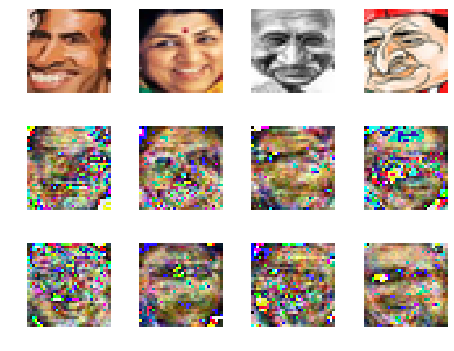

discriminator loss at step 84100:	 1.0831722021102905 	-- adversarial loss at step 84100:	 0.94431365
discriminator loss at step 84200:	 1.0546660423278809 	-- adversarial loss at step 84200:	 0.9822581
discriminator loss at step 84300:	 1.0464386940002441 	-- adversarial loss at step 84300:	 1.0203202
discriminator loss at step 84400:	 1.0708353519439697 	-- adversarial loss at step 84400:	 1.01222
discriminator loss at step 84500:	 1.0492452383041382 	-- adversarial loss at step 84500:	 1.0101033


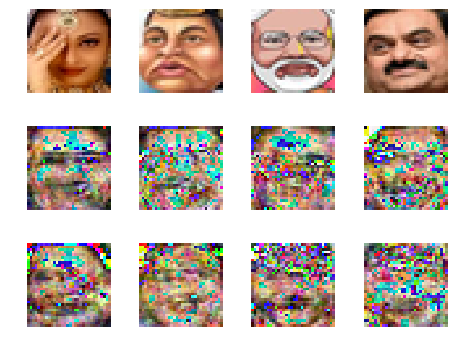

discriminator loss at step 84600:	 1.0415008068084717 	-- adversarial loss at step 84600:	 1.0200363
discriminator loss at step 84700:	 1.0480881929397583 	-- adversarial loss at step 84700:	 1.0470558
discriminator loss at step 84800:	 1.0483999252319336 	-- adversarial loss at step 84800:	 0.9964999
discriminator loss at step 84900:	 1.0869193077087402 	-- adversarial loss at step 84900:	 1.0132915
discriminator loss at step 85000:	 1.014024019241333 	-- adversarial loss at step 85000:	 1.0648501


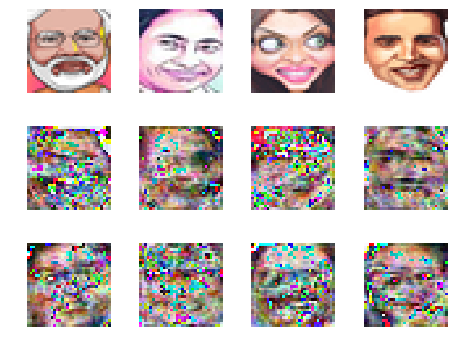

discriminator loss at step 85100:	 1.0818065404891968 	-- adversarial loss at step 85100:	 0.9576056
discriminator loss at step 85200:	 1.0612037181854248 	-- adversarial loss at step 85200:	 1.1050416
discriminator loss at step 85300:	 1.0884897708892822 	-- adversarial loss at step 85300:	 0.9415688
discriminator loss at step 85400:	 1.0652766227722168 	-- adversarial loss at step 85400:	 1.071766
discriminator loss at step 85500:	 1.0800018310546875 	-- adversarial loss at step 85500:	 0.94139683


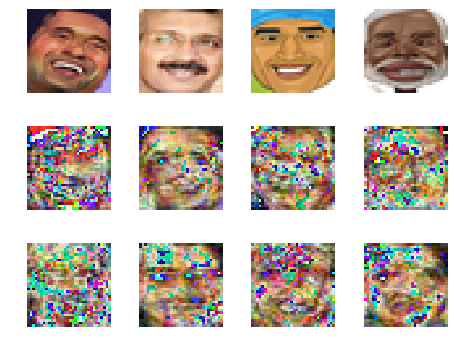

discriminator loss at step 85600:	 1.0925287008285522 	-- adversarial loss at step 85600:	 0.97379565
discriminator loss at step 85700:	 1.0701931715011597 	-- adversarial loss at step 85700:	 1.0696702
discriminator loss at step 85800:	 1.1439564228057861 	-- adversarial loss at step 85800:	 0.91371715
discriminator loss at step 85900:	 1.0664302110671997 	-- adversarial loss at step 85900:	 1.0421183
discriminator loss at step 86000:	 1.0509854555130005 	-- adversarial loss at step 86000:	 0.96386343


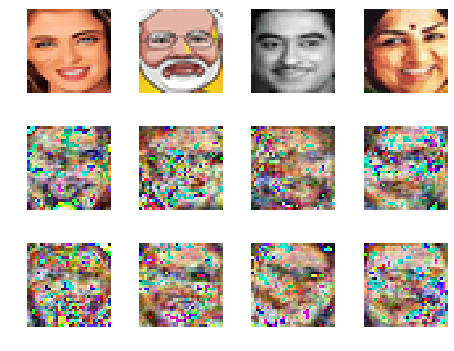

discriminator loss at step 86100:	 1.1483936309814453 	-- adversarial loss at step 86100:	 0.9697273
discriminator loss at step 86200:	 0.9982634782791138 	-- adversarial loss at step 86200:	 1.0539373
discriminator loss at step 86300:	 1.0845192670822144 	-- adversarial loss at step 86300:	 1.0172827
discriminator loss at step 86400:	 1.0249848365783691 	-- adversarial loss at step 86400:	 1.0391946
discriminator loss at step 86500:	 1.0847969055175781 	-- adversarial loss at step 86500:	 0.99091977


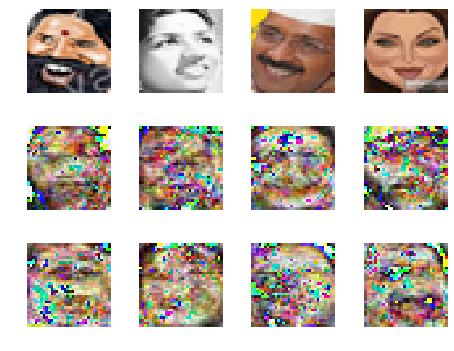

discriminator loss at step 86600:	 1.0941284894943237 	-- adversarial loss at step 86600:	 1.0437044
discriminator loss at step 86700:	 1.0453214645385742 	-- adversarial loss at step 86700:	 1.0254186
discriminator loss at step 86800:	 1.0668189525604248 	-- adversarial loss at step 86800:	 1.0099452
discriminator loss at step 86900:	 1.0579657554626465 	-- adversarial loss at step 86900:	 1.113964
discriminator loss at step 87000:	 1.0707734823226929 	-- adversarial loss at step 87000:	 1.0645483


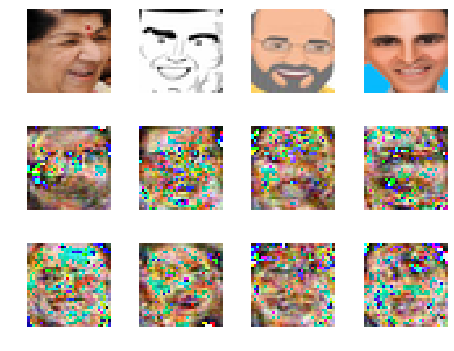

discriminator loss at step 87100:	 1.058048963546753 	-- adversarial loss at step 87100:	 1.0251849
discriminator loss at step 87200:	 1.048419713973999 	-- adversarial loss at step 87200:	 1.0797343
discriminator loss at step 87300:	 1.1124705076217651 	-- adversarial loss at step 87300:	 1.0124067
discriminator loss at step 87400:	 1.0561268329620361 	-- adversarial loss at step 87400:	 1.0428367
discriminator loss at step 87500:	 1.10408616065979 	-- adversarial loss at step 87500:	 0.9783181


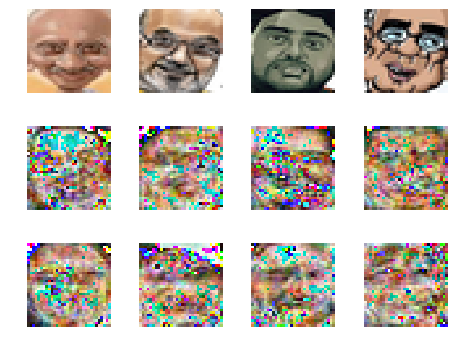

discriminator loss at step 87600:	 1.0619122982025146 	-- adversarial loss at step 87600:	 1.0369799
discriminator loss at step 87700:	 1.105177402496338 	-- adversarial loss at step 87700:	 1.0401314
discriminator loss at step 87800:	 1.1086885929107666 	-- adversarial loss at step 87800:	 0.99536157
discriminator loss at step 87900:	 1.0607168674468994 	-- adversarial loss at step 87900:	 1.0745511
discriminator loss at step 88000:	 1.0791308879852295 	-- adversarial loss at step 88000:	 1.0412872


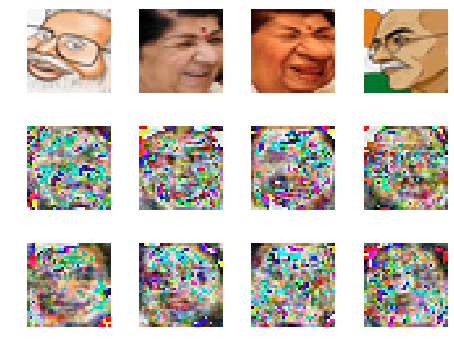

discriminator loss at step 88100:	 1.0579476356506348 	-- adversarial loss at step 88100:	 1.068256
discriminator loss at step 88200:	 1.0513124465942383 	-- adversarial loss at step 88200:	 1.0589768
discriminator loss at step 88300:	 1.1231069564819336 	-- adversarial loss at step 88300:	 1.0912845
discriminator loss at step 88400:	 1.0723612308502197 	-- adversarial loss at step 88400:	 1.0964437
discriminator loss at step 88500:	 1.0618529319763184 	-- adversarial loss at step 88500:	 1.0122755


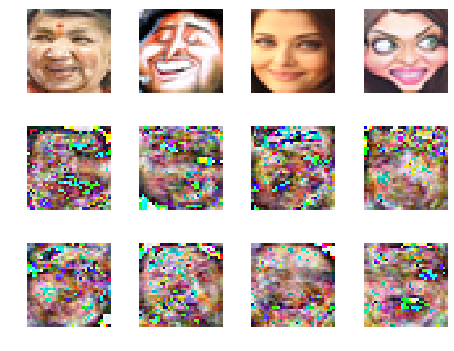

discriminator loss at step 88600:	 1.0598657131195068 	-- adversarial loss at step 88600:	 0.99690914
discriminator loss at step 88700:	 1.0719937086105347 	-- adversarial loss at step 88700:	 1.0402014
discriminator loss at step 88800:	 1.040374994277954 	-- adversarial loss at step 88800:	 1.054255
discriminator loss at step 88900:	 1.1035423278808594 	-- adversarial loss at step 88900:	 1.0748154
discriminator loss at step 89000:	 1.0844011306762695 	-- adversarial loss at step 89000:	 1.0722277


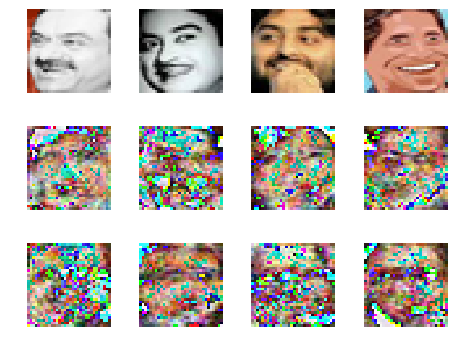

discriminator loss at step 89100:	 1.0934021472930908 	-- adversarial loss at step 89100:	 1.0426223
discriminator loss at step 89200:	 1.0720661878585815 	-- adversarial loss at step 89200:	 1.0245855
discriminator loss at step 89300:	 1.0913325548171997 	-- adversarial loss at step 89300:	 1.0237674
discriminator loss at step 89400:	 1.0723448991775513 	-- adversarial loss at step 89400:	 1.0363321
discriminator loss at step 89500:	 1.0260405540466309 	-- adversarial loss at step 89500:	 1.0156465


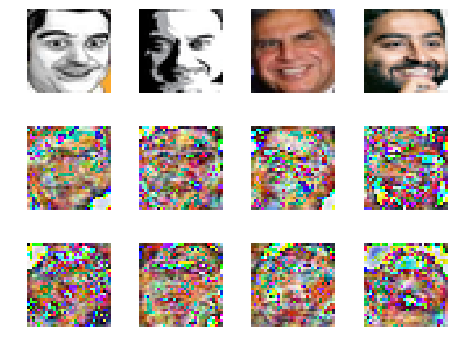

discriminator loss at step 89600:	 1.0823512077331543 	-- adversarial loss at step 89600:	 1.0384767
discriminator loss at step 89700:	 1.0770034790039062 	-- adversarial loss at step 89700:	 1.0541835
discriminator loss at step 89800:	 1.0445866584777832 	-- adversarial loss at step 89800:	 0.99806875
discriminator loss at step 89900:	 1.0771534442901611 	-- adversarial loss at step 89900:	 1.0374062
discriminator loss at step 90000:	 1.0600067377090454 	-- adversarial loss at step 90000:	 1.0885248


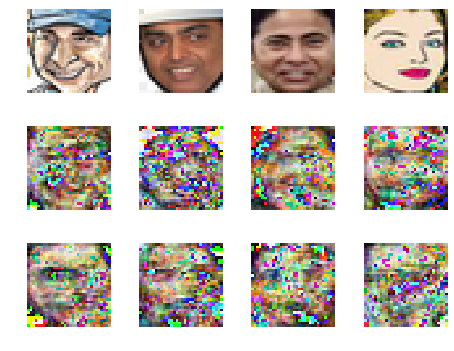

discriminator loss at step 90100:	 1.0775002241134644 	-- adversarial loss at step 90100:	 1.0493379
discriminator loss at step 90200:	 1.0545337200164795 	-- adversarial loss at step 90200:	 1.0572817
discriminator loss at step 90300:	 1.0704166889190674 	-- adversarial loss at step 90300:	 1.040319
discriminator loss at step 90400:	 1.1075847148895264 	-- adversarial loss at step 90400:	 0.98900956
discriminator loss at step 90500:	 1.0935235023498535 	-- adversarial loss at step 90500:	 1.0341537


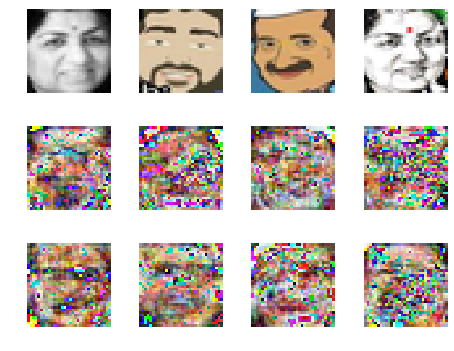

discriminator loss at step 90600:	 1.0846307277679443 	-- adversarial loss at step 90600:	 1.0156338
discriminator loss at step 90700:	 1.0988889932632446 	-- adversarial loss at step 90700:	 1.0300739
discriminator loss at step 90800:	 1.0303971767425537 	-- adversarial loss at step 90800:	 1.0686448
discriminator loss at step 90900:	 1.0841448307037354 	-- adversarial loss at step 90900:	 1.0550284
discriminator loss at step 91000:	 1.0263458490371704 	-- adversarial loss at step 91000:	 1.0496912


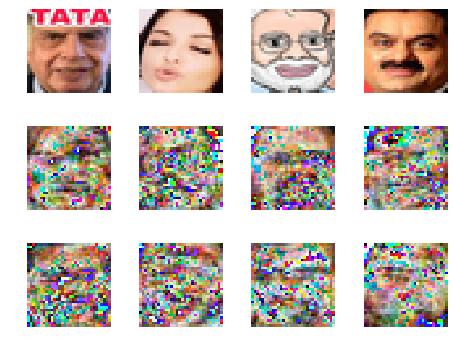

discriminator loss at step 91100:	 1.0811829566955566 	-- adversarial loss at step 91100:	 1.056816
discriminator loss at step 91200:	 1.102248191833496 	-- adversarial loss at step 91200:	 1.0493379
discriminator loss at step 91300:	 1.1003742218017578 	-- adversarial loss at step 91300:	 0.9970809
discriminator loss at step 91400:	 1.0996077060699463 	-- adversarial loss at step 91400:	 1.0222509
discriminator loss at step 91500:	 1.1038506031036377 	-- adversarial loss at step 91500:	 1.10622


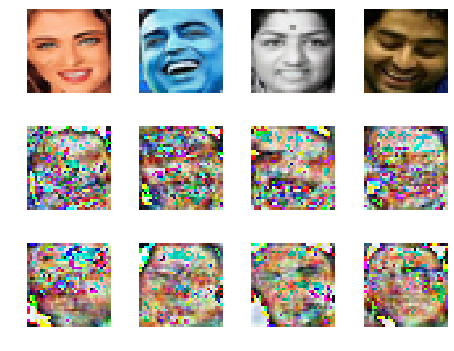

discriminator loss at step 91600:	 1.0766774415969849 	-- adversarial loss at step 91600:	 1.0233667
discriminator loss at step 91700:	 1.0795527696609497 	-- adversarial loss at step 91700:	 1.0006725
discriminator loss at step 91800:	 1.0662617683410645 	-- adversarial loss at step 91800:	 1.0303245
discriminator loss at step 91900:	 1.0844857692718506 	-- adversarial loss at step 91900:	 1.0867541
discriminator loss at step 92000:	 1.089643955230713 	-- adversarial loss at step 92000:	 1.0555291


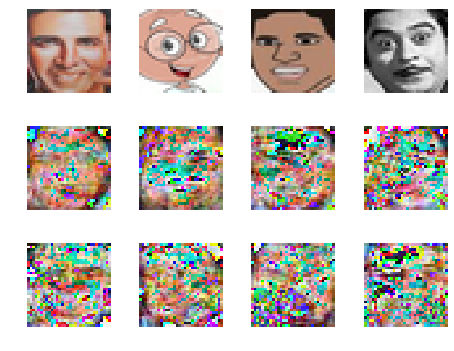

discriminator loss at step 92100:	 1.1164577007293701 	-- adversarial loss at step 92100:	 1.0401654
discriminator loss at step 92200:	 1.0759508609771729 	-- adversarial loss at step 92200:	 1.0471239
discriminator loss at step 92300:	 1.056315541267395 	-- adversarial loss at step 92300:	 1.0649562
discriminator loss at step 92400:	 1.0989041328430176 	-- adversarial loss at step 92400:	 1.0440361
discriminator loss at step 92500:	 1.0664501190185547 	-- adversarial loss at step 92500:	 1.0412657


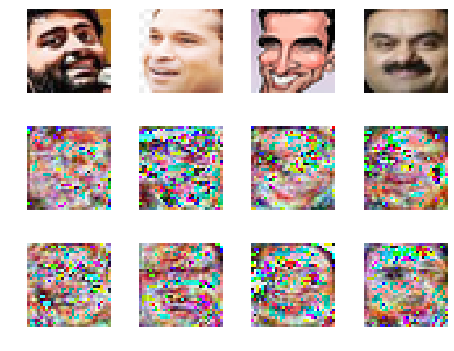

discriminator loss at step 92600:	 1.075570821762085 	-- adversarial loss at step 92600:	 1.0678997
discriminator loss at step 92700:	 1.0475890636444092 	-- adversarial loss at step 92700:	 1.0723175
discriminator loss at step 92800:	 1.1048083305358887 	-- adversarial loss at step 92800:	 0.99062073
discriminator loss at step 92900:	 1.0627689361572266 	-- adversarial loss at step 92900:	 1.0758655
discriminator loss at step 93000:	 1.0430450439453125 	-- adversarial loss at step 93000:	 1.0988469


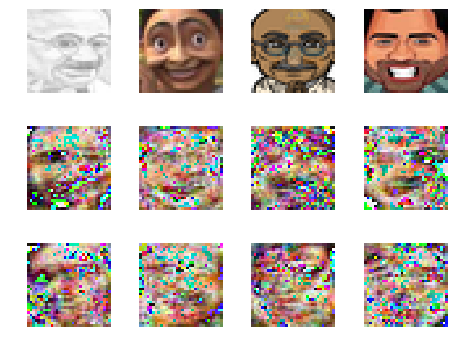

discriminator loss at step 93100:	 1.0669571161270142 	-- adversarial loss at step 93100:	 1.0522424
discriminator loss at step 93200:	 1.0447430610656738 	-- adversarial loss at step 93200:	 1.0491059
discriminator loss at step 93300:	 1.090280294418335 	-- adversarial loss at step 93300:	 1.0474465
discriminator loss at step 93400:	 1.072175145149231 	-- adversarial loss at step 93400:	 1.0377568
discriminator loss at step 93500:	 1.0646159648895264 	-- adversarial loss at step 93500:	 1.0222266


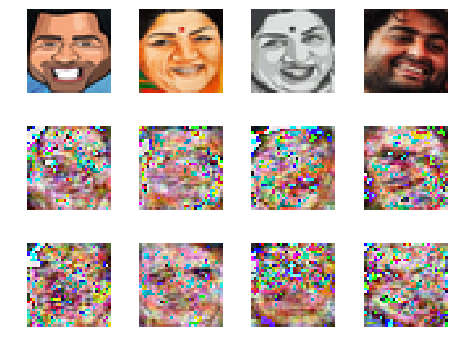

discriminator loss at step 93600:	 1.1080446243286133 	-- adversarial loss at step 93600:	 1.0119642
discriminator loss at step 93700:	 1.0528688430786133 	-- adversarial loss at step 93700:	 1.0475276
discriminator loss at step 93800:	 1.1101839542388916 	-- adversarial loss at step 93800:	 1.0184588
discriminator loss at step 93900:	 1.0212260484695435 	-- adversarial loss at step 93900:	 0.98975295
discriminator loss at step 94000:	 1.0784788131713867 	-- adversarial loss at step 94000:	 1.0618744


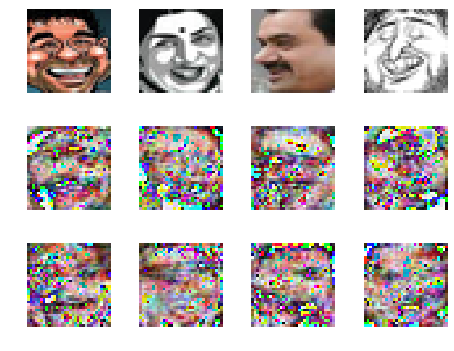

discriminator loss at step 94100:	 1.052199363708496 	-- adversarial loss at step 94100:	 1.0612639
discriminator loss at step 94200:	 1.0648224353790283 	-- adversarial loss at step 94200:	 1.0811408
discriminator loss at step 94300:	 1.0512266159057617 	-- adversarial loss at step 94300:	 0.99946654
discriminator loss at step 94400:	 1.0517243146896362 	-- adversarial loss at step 94400:	 1.0475378
discriminator loss at step 94500:	 1.112189769744873 	-- adversarial loss at step 94500:	 1.0871897


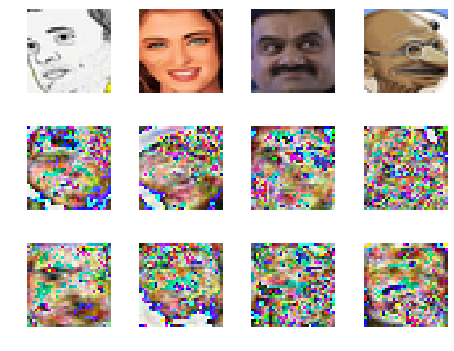

discriminator loss at step 94600:	 1.1203577518463135 	-- adversarial loss at step 94600:	 0.9832516
discriminator loss at step 94700:	 1.0562241077423096 	-- adversarial loss at step 94700:	 1.000278
discriminator loss at step 94800:	 1.0661654472351074 	-- adversarial loss at step 94800:	 1.0557942
discriminator loss at step 94900:	 1.0673718452453613 	-- adversarial loss at step 94900:	 1.0383874
discriminator loss at step 95000:	 1.0511194467544556 	-- adversarial loss at step 95000:	 1.005234


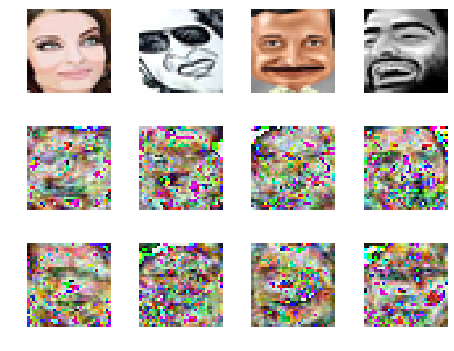

discriminator loss at step 95100:	 1.0559216737747192 	-- adversarial loss at step 95100:	 1.0654082
discriminator loss at step 95200:	 1.057701826095581 	-- adversarial loss at step 95200:	 0.9874375
discriminator loss at step 95300:	 1.1003913879394531 	-- adversarial loss at step 95300:	 0.9969466
discriminator loss at step 95400:	 1.0524687767028809 	-- adversarial loss at step 95400:	 1.0860305
discriminator loss at step 95500:	 1.079237699508667 	-- adversarial loss at step 95500:	 0.9562294


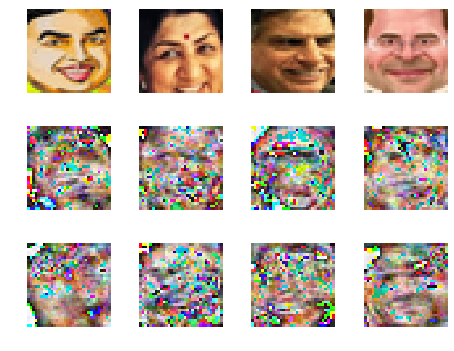

discriminator loss at step 95600:	 1.0635279417037964 	-- adversarial loss at step 95600:	 1.0262678
discriminator loss at step 95700:	 1.0722987651824951 	-- adversarial loss at step 95700:	 0.9806591
discriminator loss at step 95800:	 1.0478225946426392 	-- adversarial loss at step 95800:	 1.0814793
discriminator loss at step 95900:	 1.0460731983184814 	-- adversarial loss at step 95900:	 1.0858037
discriminator loss at step 96000:	 1.0718746185302734 	-- adversarial loss at step 96000:	 1.0703855


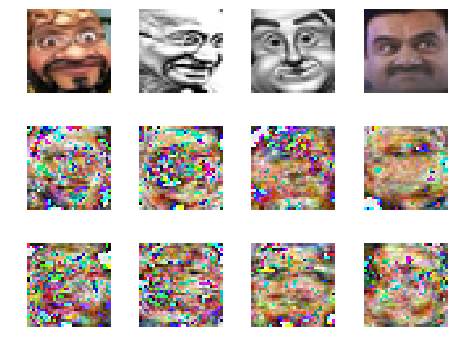

discriminator loss at step 96100:	 1.0640316009521484 	-- adversarial loss at step 96100:	 1.1513492
discriminator loss at step 96200:	 1.0706336498260498 	-- adversarial loss at step 96200:	 0.9917197
discriminator loss at step 96300:	 1.0936909914016724 	-- adversarial loss at step 96300:	 1.0183594
discriminator loss at step 96400:	 1.090576410293579 	-- adversarial loss at step 96400:	 0.9356139
discriminator loss at step 96500:	 1.0839273929595947 	-- adversarial loss at step 96500:	 0.9892714


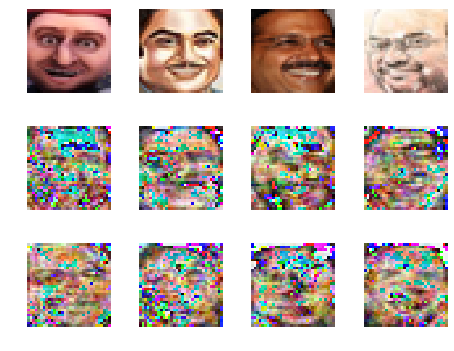

discriminator loss at step 96600:	 1.0539591312408447 	-- adversarial loss at step 96600:	 1.0000023
discriminator loss at step 96700:	 1.1021814346313477 	-- adversarial loss at step 96700:	 1.111645
discriminator loss at step 96800:	 1.0582051277160645 	-- adversarial loss at step 96800:	 1.1053984
discriminator loss at step 96900:	 1.0813472270965576 	-- adversarial loss at step 96900:	 1.0196031
discriminator loss at step 97000:	 1.0822168588638306 	-- adversarial loss at step 97000:	 0.9906545


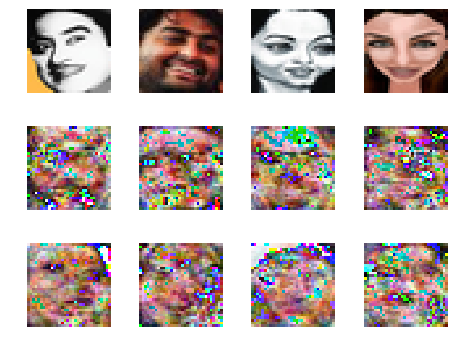

discriminator loss at step 97100:	 1.0607926845550537 	-- adversarial loss at step 97100:	 1.0558636
discriminator loss at step 97200:	 1.0554946660995483 	-- adversarial loss at step 97200:	 0.9959746
discriminator loss at step 97300:	 1.0968095064163208 	-- adversarial loss at step 97300:	 1.0316265
discriminator loss at step 97400:	 1.0586296319961548 	-- adversarial loss at step 97400:	 1.0514419
discriminator loss at step 97500:	 1.0763304233551025 	-- adversarial loss at step 97500:	 1.0603542


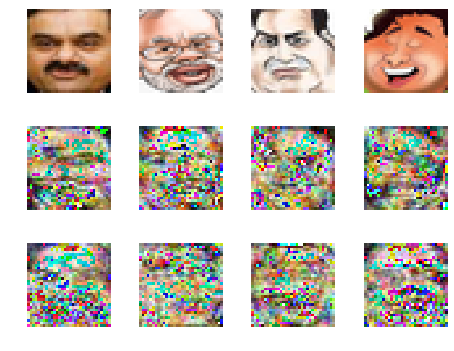

discriminator loss at step 97600:	 1.0447678565979004 	-- adversarial loss at step 97600:	 1.0153501
discriminator loss at step 97700:	 1.0712213516235352 	-- adversarial loss at step 97700:	 1.0644155
discriminator loss at step 97800:	 1.0655423402786255 	-- adversarial loss at step 97800:	 1.0500624
discriminator loss at step 97900:	 1.0488444566726685 	-- adversarial loss at step 97900:	 0.9374619
discriminator loss at step 98000:	 1.10182785987854 	-- adversarial loss at step 98000:	 0.9961219


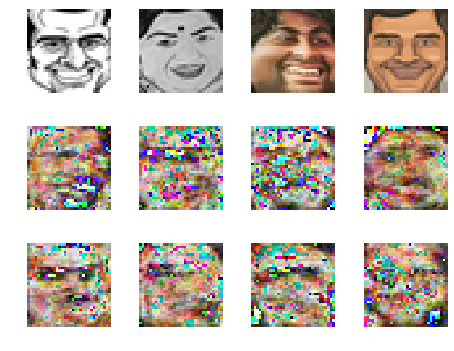

discriminator loss at step 98100:	 1.0460140705108643 	-- adversarial loss at step 98100:	 1.072056
discriminator loss at step 98200:	 1.0692310333251953 	-- adversarial loss at step 98200:	 1.0768279
discriminator loss at step 98300:	 1.0970449447631836 	-- adversarial loss at step 98300:	 0.9567551
discriminator loss at step 98400:	 1.0346884727478027 	-- adversarial loss at step 98400:	 1.0032194
discriminator loss at step 98500:	 1.0757801532745361 	-- adversarial loss at step 98500:	 1.047828


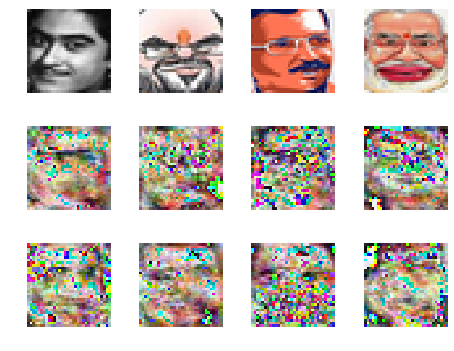

discriminator loss at step 98600:	 1.0793029069900513 	-- adversarial loss at step 98600:	 1.0598962
discriminator loss at step 98700:	 1.0604815483093262 	-- adversarial loss at step 98700:	 1.021993
discriminator loss at step 98800:	 1.0822925567626953 	-- adversarial loss at step 98800:	 1.0228913
discriminator loss at step 98900:	 1.0852348804473877 	-- adversarial loss at step 98900:	 1.0200725
discriminator loss at step 99000:	 1.0921374559402466 	-- adversarial loss at step 99000:	 1.0324512


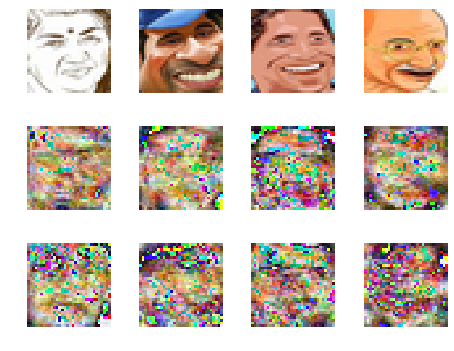

discriminator loss at step 99100:	 1.0918364524841309 	-- adversarial loss at step 99100:	 1.0105454
discriminator loss at step 99200:	 1.0546395778656006 	-- adversarial loss at step 99200:	 1.0013399
discriminator loss at step 99300:	 1.0339900255203247 	-- adversarial loss at step 99300:	 1.0909073
discriminator loss at step 99400:	 1.0794832706451416 	-- adversarial loss at step 99400:	 1.0904937
discriminator loss at step 99500:	 1.1132193803787231 	-- adversarial loss at step 99500:	 1.0226682


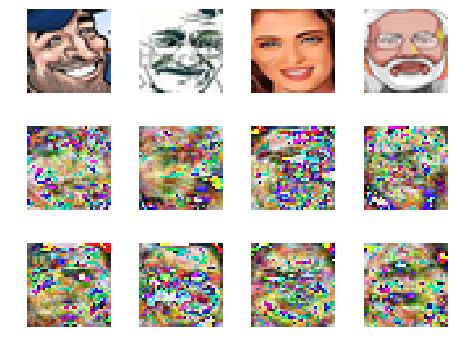

discriminator loss at step 99600:	 1.0849428176879883 	-- adversarial loss at step 99600:	 1.0350697
discriminator loss at step 99700:	 1.0800138711929321 	-- adversarial loss at step 99700:	 1.099753
discriminator loss at step 99800:	 1.062448501586914 	-- adversarial loss at step 99800:	 1.0306162
discriminator loss at step 99900:	 1.0816516876220703 	-- adversarial loss at step 99900:	 1.0140902


In [ ]:
iterations = 100000

start = 0
for step in range(iterations):
    random_latent_vectors = np.random.normal(size=(batch_size, latent_dim))
    generated_images = generator.predict(random_latent_vectors)
    stop = start + batch_size
    real_images = np.zeros((batch_size, width, height, channels), dtype=np.float64)
    
    cont = 0
    for k in range(start, stop):
        real_images[cont] = generate_real(train_df, k, (width, height));
        cont += 1
    
    labels_real = np.ones((batch_size, 1))
    labels_fake = np.ones((batch_size, 1))
    
    # Add random noise to the labels
    labels_real += 0.05 * np.random.random(labels_real.shape)
    labels_fake += 0.05 * np.random.random(labels_fake.shape)

    # Train the discriminator
    d_loss1 = discriminator.train_on_batch(real_images, labels_real)
    d_loss2 = discriminator.train_on_batch(generated_images, -labels_fake)
    d_loss = 0.5 * (d_loss1 + d_loss2)

    random_latent_vectors = np.random.normal(size=(batch_size, latent_dim))

    misleading_targets = np.ones((batch_size, 1))

    a_loss = gan.train_on_batch(random_latent_vectors, misleading_targets)
    
    start += batch_size
    if start > len(train_df) - batch_size:
        start = 0

    if step % 100 == 0:
        print('discriminator loss at step %s:\t %s \t-- adversarial loss at step %s:\t %s' % (step, d_loss, step, a_loss))
        
    if step % 500 == 0:
        showimages = np.concatenate([real_images[:4], generated_images[:8]])
        plot_images(save2file=False, fake=True, samples=12, images=showimages, dpi=60)

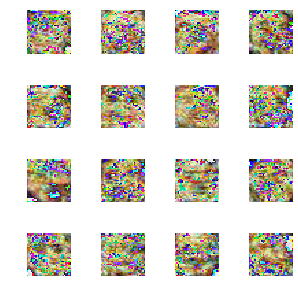

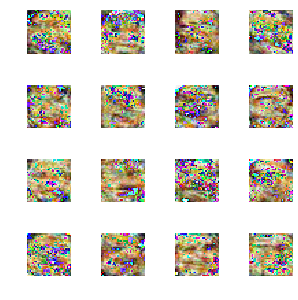

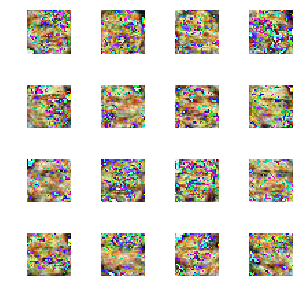

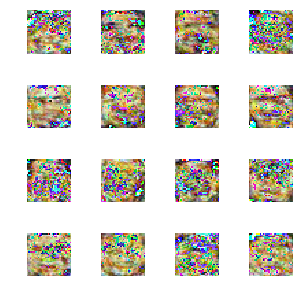

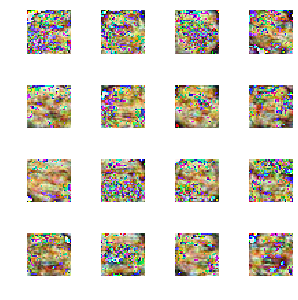

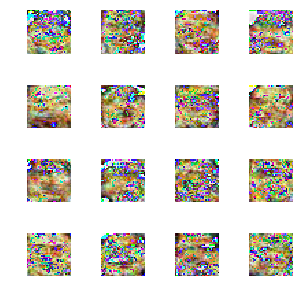

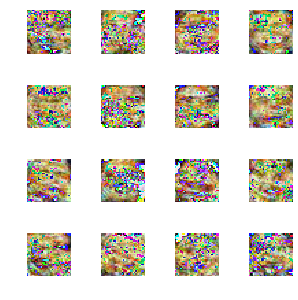

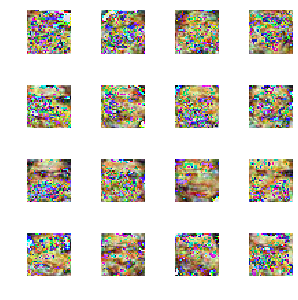

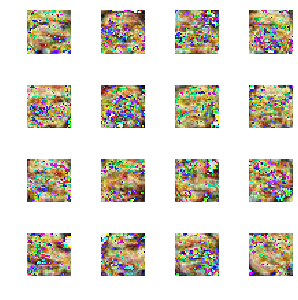

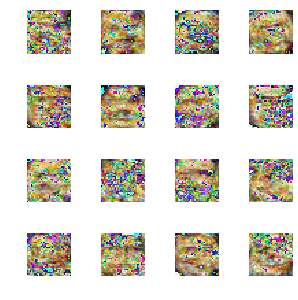

In [ ]:
for k in range(0, 10):
    random_latent_vectors = np.random.normal(size=(batch_size, latent_dim))
    generated_images = generator.predict(random_latent_vectors)
    plot_images(save2file=False, fake=True, samples=16, images=generated_images[:16], dpi=120)